In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('txr_1.csv')

In [3]:
examsttns = df['EXAMSTTN'].value_counts()
for i,j in examsttns.items():
    print(f'{i} : {j}')

DDU : 9553
BLEY : 7087
NKJ : 6594
GD : 5472
BSL : 4854
GIMY : 4095
STA : 3772
RYD : 3711
ICDD : 3680
TICD : 3574
SMP : 3100
KRCA : 3041
BNDM : 2804
FL : 2593
NJPT : 2492
KJGY : 2446
HAPA : 2372
BKEY : 2343
ADTP : 2312
KTTY : 2287
NGCT : 2150
RDM : 2021
BKDC : 1971
BZA : 1875
GY : 1834
BPA : 1815
BRWD : 1813
PTRU : 1811
PRDP : 1677
BJE : 1651
PEH : 1573
DBEC : 1536
OBR : 1480
PKR : 1399
TNPM : 1376
EMTY : 1330
COA : 1272
MLDT : 1271
OEC : 1242
BIA : 1196
SSB : 1180
JSWT : 1169
NHYD : 1148
GMC : 1145
UDLU : 1138
DICD : 1136
NBQY : 1135
HPT : 1075
JTJ : 1070
SGWF : 1063
SMYD : 1062
GHZ : 1062
JUC : 1052
FPY : 1044
PLPC : 1036
UMB : 994
BTI : 991
MRJ : 959
JSWD : 952
BAD : 944
NPRY : 941
DPS : 911
NLPD : 876
NATD : 868
DKJ : 803
ED : 793
WDD : 782
DD : 727
MXA : 721
SNF : 702
ETYD : 654
KLMG : 640
CTKR : 612
TKD : 607
AJNI : 586
LDH : 577
MKPP : 566
REJN : 554
BTTR : 544
CCJS : 530
PGFS : 530
GDGH : 521
CT : 518
MVN : 515
ET : 499
ADRA : 494
IPN : 493
MLPM : 493
CP : 488
JMP : 483
UTCM : 4

## STA Exam Station - EDA

In [4]:
sta = df[df['EXAMSTTN'] == 'STA'].copy()
sta.count()

RDATE            3772
RAKETYPE         3772
EXAMSTTN         3772
ZONE             3772
ARVLTIME         3772
PLCTTIME         3772
RELSTIME         3772
DPRTTIME         3772
AR_TO_PL         3772
PL_TO_RL         3772
RL_TO_DP         3772
TOTAL_TIME       3772
R_DATEOFMONTH    3772
R_MONTH          3772
R_DAYOFWEEK      3772
R_WEEK           3772
ARVL_H           3772
PLCT_H           3772
RELS_H           3772
DPRT_H           3772
dtype: int64

In [5]:
sta.nunique()

RDATE             363
RAKETYPE            6
EXAMSTTN            1
ZONE                1
ARVLTIME         3650
PLCTTIME         3630
RELSTIME         3644
DPRTTIME         3715
AR_TO_PL          246
PL_TO_RL          113
RL_TO_DP          922
TOTAL_TIME       1218
R_DATEOFMONTH     363
R_MONTH            12
R_DAYOFWEEK         7
R_WEEK             53
ARVL_H             24
PLCT_H             24
RELS_H             24
DPRT_H             24
dtype: int64

In [6]:
sta.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
358,2024-04-01,BCN,STA,WC,2024-04-01 19:20:00,2024-04-01 19:20:00,2024-04-01 19:20:00,2024-04-01 23:44:00,0,0,264,264,2024-04-01,2024-04,0,W-14-2024,19,19,19,23
359,2024-04-01,BCN,STA,WC,2024-04-01 12:10:00,2024-04-01 13:25:00,2024-04-01 17:50:00,2024-04-01 23:45:00,75,265,355,695,2024-04-01,2024-04,0,W-14-2024,12,13,17,23
360,2024-04-01,BCN,STA,WC,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,0,0,139,139,2024-04-01,2024-04,0,W-14-2024,6,6,6,8
361,2024-04-01,BCNHL,STA,WC,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,2024-04-01 14:45:00,50,300,545,895,2024-04-01,2024-04,0,W-14-2024,23,0,5,14
362,2024-04-01,BCN,STA,WC,2024-04-01 15:00:00,2024-04-01 15:00:00,2024-04-01 15:00:00,2024-04-01 18:35:00,0,0,215,215,2024-04-01,2024-04,0,W-14-2024,15,15,15,18


In [7]:
print(sta['RAKETYPE'].nunique())
sta['RAKETYPE'].value_counts()

6


RAKETYPE
BCN         2631
BCNHL        978
BCNAHSM1     120
BCFCM         20
BLC           19
BOXN           4
Name: count, dtype: int64

In [8]:
print(sta['ZONE'].nunique())
sta['ZONE'].value_counts()

1


ZONE
WC    3772
Name: count, dtype: int64

#### New Features

In [9]:
df1 = sta.copy()

In [10]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [11]:
df1['ARVLTIME'] = pd.to_datetime(df1['ARVLTIME'], format='%Y-%m-%d %H:%M:%S')
df1['PLCTTIME'] = pd.to_datetime(df1['PLCTTIME'], format='%Y-%m-%d %H:%M:%S')
df1['RELSTIME'] = pd.to_datetime(df1['RELSTIME'], format='%Y-%m-%d %H:%M:%S')
df1['DPRTTIME'] = pd.to_datetime(df1['DPRTTIME'], format='%Y-%m-%d %H:%M:%S')

In [12]:
df1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
0,2024-04-01,BCNHL,STA,WC,2024-03-31 19:17:00,2024-03-31 19:50:00,2024-03-31 23:15:00,2024-04-01 10:00:00,33,205,645,883,2024-04-01,2024-04,0,W-14-2024,19,19,23,10
1,2024-04-02,BCNHL,STA,WC,2024-03-31 23:00:00,2024-03-31 23:30:00,2024-04-01 04:20:00,2024-04-02 07:09:00,30,290,1609,1929,2024-04-02,2024-04,1,W-14-2024,23,23,4,7
2,2024-04-01,BCNHL,STA,WC,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,2024-04-01 14:45:00,50,300,545,895,2024-04-01,2024-04,0,W-14-2024,23,0,5,14
3,2024-04-01,BCN,STA,WC,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,0,0,139,139,2024-04-01,2024-04,0,W-14-2024,6,6,6,8
4,2024-04-01,BCN,STA,WC,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:40:00,0,0,10,10,2024-04-01,2024-04,0,W-14-2024,9,9,9,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3767,2025-03-31,BCNAHSM1,STA,WC,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:05:00,0,0,5,5,2025-03-31,2025-03,0,W-14-2025,12,12,12,12
3768,2025-03-31,BCNAHSM1,STA,WC,2025-03-31 12:15:00,2025-03-31 12:25:00,2025-03-31 16:00:00,2025-03-31 19:15:00,10,215,195,420,2025-03-31,2025-03,0,W-14-2025,12,12,16,19
3769,2025-03-31,BCN,STA,WC,2025-03-31 14:35:00,2025-03-31 15:00:00,2025-03-31 19:35:00,2025-03-31 23:01:00,25,275,206,506,2025-03-31,2025-03,0,W-14-2025,14,15,19,23
3770,2025-03-31,BCN,STA,WC,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:30:00,0,0,30,30,2025-03-31,2025-03,0,W-14-2025,18,18,18,18


In [13]:
# Count of rakes in shunting time (AR_TO_PL) when the current rake arrives
# Shunting time for a rake is from its ARVLTIME to its PLCTTIME

num_rakes_shunting = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have arrived BEFORE or AT current_arrival_time
    # AND whose placement time is AFTER current_arrival_time
    # (meaning they are still in shunting phase)
    # Exclude the current rake itself from the count if its ARVLTIME == current_arrival_time
        
    # Filter for rakes whose shunting period overlaps with the current_arrival_time
    # A rake is in shunting if current_arrival_time is between its ARVLTIME and PLCTTIME
        
    # Filter rakes that started shunting before or at the current rake's arrival time
    potential_rakes = df1[(df1['ARVLTIME'] <= current_arrival_time) & (df1.index != i)]
        
    # From those, count how many are still in shunting phase (their PLCTTIME is in the future relative to current_arrival_time)
    count = potential_rakes[potential_rakes['PLCTTIME'] > current_arrival_time].shape[0]
    num_rakes_shunting.append(count)
df1['Num_Rakes_Shunting_At_ARVL'] = num_rakes_shunting

In [14]:
df1[['ARVLTIME', 'PLCTTIME', 'Num_Rakes_Shunting_At_ARVL']]

,ARVLTIME,PLCTTIME,Num_Rakes_Shunting_At_ARVL
0,2024-03-31 19:17:00,2024-03-31 19:50:00,0
1,2024-03-31 23:00:00,2024-03-31 23:30:00,0
2,2024-03-31 23:50:00,2024-04-01 00:40:00,0
3,2024-04-01 06:00:00,2024-04-01 06:00:00,0
4,2024-04-01 09:30:00,2024-04-01 09:30:00,0
...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,0
3768,2025-03-31 12:15:00,2025-03-31 12:25:00,0
3769,2025-03-31 14:35:00,2025-03-31 15:00:00,0
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,0


In [15]:
# Count of rakes in examination time (PL_TO_RL) when the current rake arrives
# Examination time for a rake is from its PLCTTIME to its RELSTIME

num_rakes_exam = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been placed BEFORE or AT current_arrival_time
    # AND whose release time is AFTER current_arrival_time
    # (meaning they are still in examination phase)
            
    potential_rakes = df1[(df1['PLCTTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_arrival_time].shape[0]
    num_rakes_exam.append(count)
df1['Num_Rakes_Exam_At_ARVL'] = num_rakes_exam

In [16]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'Num_Rakes_Exam_At_ARVL']]

,ARVLTIME,PLCTTIME,RELSTIME,Num_Rakes_Exam_At_ARVL
0,2024-03-31 19:17:00,2024-03-31 19:50:00,2024-03-31 23:15:00,0
1,2024-03-31 23:00:00,2024-03-31 23:30:00,2024-04-01 04:20:00,1
2,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,1
3,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,0
4,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:30:00,0
...,...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:00:00,2
3768,2025-03-31 12:15:00,2025-03-31 12:25:00,2025-03-31 16:00:00,1
3769,2025-03-31 14:35:00,2025-03-31 15:00:00,2025-03-31 19:35:00,2
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,1


In [17]:
# Count of rakes in departure time (RL_TO_DP) when the current rake arrives
# Departure time for a rake is from its RELSTIME to its DPRTTIME

num_rakes_departure = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been released BEFORE or AT current_arrival_time
    # AND whose departure time is AFTER current_arrival_time
    # (meaning they are still in departure phase)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_arrival_time].shape[0]
    num_rakes_departure.append(count)
df1['Num_Rakes_Departure_At_ARVL'] = num_rakes_departure

In [18]:
df1[['ARVLTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_ARVL']]

,ARVLTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_ARVL
0,2024-03-31 19:17:00,2024-03-31 23:15:00,2024-04-01 10:00:00,0
1,2024-03-31 23:00:00,2024-04-01 04:20:00,2024-04-02 07:09:00,0
2,2024-03-31 23:50:00,2024-04-01 05:40:00,2024-04-01 14:45:00,1
3,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,3
4,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:40:00,3
...,...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:05:00,1
3768,2025-03-31 12:15:00,2025-03-31 16:00:00,2025-03-31 19:15:00,2
3769,2025-03-31 14:35:00,2025-03-31 19:35:00,2025-03-31 23:01:00,1
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:30:00,3


In [19]:
num_rakes_exam_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Identifying other rakes that are in their examination phase at this 'current_placement_time'.
    # A rake 'other_rake' is in examination if:
    # 1. Its placement time (start of exam) is less than or equal to 'current_placement_time'.
    # 2. Its release time (end of exam) is greater than 'current_placement_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['PLCTTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_placement_time].shape[0]
    num_rakes_exam_at_placement.append(count)
        
df1['Num_Rakes_Exam_At_PLCT'] = num_rakes_exam_at_placement

In [20]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Exam_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Exam_At_PLCT
0,2024-03-31 19:17:00,2024-03-31 19:50:00,2024-03-31 23:15:00,2024-04-01 10:00:00,0
1,2024-03-31 23:00:00,2024-03-31 23:30:00,2024-04-01 04:20:00,2024-04-02 07:09:00,0
2,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,2024-04-01 14:45:00,1
3,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,0
4,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:40:00,0
...,...,...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:05:00,2
3768,2025-03-31 12:15:00,2025-03-31 12:25:00,2025-03-31 16:00:00,2025-03-31 19:15:00,1
3769,2025-03-31 14:35:00,2025-03-31 15:00:00,2025-03-31 19:35:00,2025-03-31 23:01:00,1
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:30:00,1


In [21]:
# Count of rakes in departure time (RL_TO_DP) when the current rake is in its examination time
# This means, for a current rake (i), count others that are in RL_TO_DP phase
# at the current rake's PLCTTIME (start of examination) or RELSTIME (end of examination, start of departure phase)
# The request states "at the point of time when the current rakes is in their examination time".
# Let's interpret this as the *start* of the current rake's examination, which is PLCTTIME, as it's a fixed point.

num_rakes_departure_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Count rakes that have been released BEFORE or AT current_placement_time
    # AND whose departure time is AFTER current_placement_time
    # (meaning they are still in departure phase)
    # Exclude the current rake itself if its RELSTIME or DPRTTIME overlap (though unlikely here)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_placement_time].shape[0]
    num_rakes_departure_at_placement.append(count)
df1['Num_Rakes_Departure_At_PLCT'] = num_rakes_departure_at_placement

In [22]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_PLCT
0,2024-03-31 19:17:00,2024-03-31 19:50:00,2024-03-31 23:15:00,2024-04-01 10:00:00,0
1,2024-03-31 23:00:00,2024-03-31 23:30:00,2024-04-01 04:20:00,2024-04-02 07:09:00,1
2,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,2024-04-01 14:45:00,1
3,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,3
4,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:40:00,3
...,...,...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:05:00,1
3768,2025-03-31 12:15:00,2025-03-31 12:25:00,2025-03-31 16:00:00,2025-03-31 19:15:00,2
3769,2025-03-31 14:35:00,2025-03-31 15:00:00,2025-03-31 19:35:00,2025-03-31 23:01:00,2
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:30:00,3


In [23]:
num_rakes_departure_at_release = []
for i, current_rake in df1.iterrows():
    current_release_time = current_rake['RELSTIME']
        
    # Identifying other rakes that are in their departure phase at this 'current_release_time'.
    # A rake 'other_rake' is in departure if:
    # 1. Its release time (start of departure) is less than or equal to 'current_release_time'.
    # 2. Its departure time (end of departure) is greater than 'current_release_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_release_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_release_time].shape[0]
    num_rakes_departure_at_release.append(count)
        
df1['Num_Rakes_Departure_At_RELS'] = num_rakes_departure_at_release

In [24]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_RELS']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_RELS
0,2024-03-31 19:17:00,2024-03-31 19:50:00,2024-03-31 23:15:00,2024-04-01 10:00:00,0
1,2024-03-31 23:00:00,2024-03-31 23:30:00,2024-04-01 04:20:00,2024-04-02 07:09:00,1
2,2024-03-31 23:50:00,2024-04-01 00:40:00,2024-04-01 05:40:00,2024-04-01 14:45:00,2
3,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 06:00:00,2024-04-01 08:19:00,3
4,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:30:00,2024-04-01 09:40:00,3
...,...,...,...,...,...
3767,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:00:00,2025-03-31 12:05:00,1
3768,2025-03-31 12:15:00,2025-03-31 12:25:00,2025-03-31 16:00:00,2025-03-31 19:15:00,2
3769,2025-03-31 14:35:00,2025-03-31 15:00:00,2025-03-31 19:35:00,2025-03-31 23:01:00,2
3770,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:30:00,3


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3772 entries, 0 to 3771
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        3772 non-null   object        
 1   RAKETYPE                     3772 non-null   object        
 2   EXAMSTTN                     3772 non-null   object        
 3   ZONE                         3772 non-null   object        
 4   ARVLTIME                     3772 non-null   datetime64[ns]
 5   PLCTTIME                     3772 non-null   datetime64[ns]
 6   RELSTIME                     3772 non-null   datetime64[ns]
 7   DPRTTIME                     3772 non-null   datetime64[ns]
 8   AR_TO_PL                     3772 non-null   int64         
 9   PL_TO_RL                     3772 non-null   int64         
 10  RL_TO_DP                     3772 non-null   int64         
 11  TOTAL_TIME                   3772 non-null 

In [26]:
# Time since last Arrival
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)
df1['Time_Since_Last_ARVL'] = df1.groupby('EXAMSTTN')['ARVLTIME'].diff().dt.total_seconds()//60

In [27]:
# Time since last Placement
df1 = df1.sort_values(by='PLCTTIME').reset_index(drop=True)
df1['Time_Since_Last_PLCT'] = df1.groupby('EXAMSTTN')['PLCTTIME'].diff().dt.total_seconds()//60

In [28]:
df1 = df1.sort_values(by='RELSTIME').reset_index(drop=True)
df1['Time_Since_Last_RELS'] = df1.groupby('EXAMSTTN')['RELSTIME'].diff().dt.total_seconds()//60

In [29]:
df1 = df1.sort_values(by='DPRTTIME').reset_index(drop=True)
df1['Time_Since_Last_DPRT'] = df1.groupby('EXAMSTTN')['DPRTTIME'].diff().dt.total_seconds()//60

In [30]:
df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']] = \
    df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']].fillna(0)

In [31]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [32]:
df1[['ARVLTIME', 'Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']]

,ARVLTIME,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-03-31 19:17:00,0.0,0.0,0.0,20.0
1,2024-03-31 23:00:00,223.0,220.0,305.0,444.0
2,2024-03-31 23:50:00,50.0,70.0,80.0,13.0
3,2024-04-01 06:00:00,370.0,320.0,20.0,0.0
4,2024-04-01 09:30:00,210.0,210.0,210.0,81.0
...,...,...,...,...,...
3767,2025-03-31 12:00:00,110.0,105.0,115.0,194.0
3768,2025-03-31 12:15:00,15.0,25.0,75.0,45.0
3769,2025-03-31 14:35:00,140.0,155.0,35.0,103.0
3770,2025-03-31 18:00:00,205.0,180.0,120.0,10.0


In [33]:
df1.drop(columns=['ARVLTIME','PLCTTIME','RELSTIME','DPRTTIME'], axis=1, inplace=True)

In [34]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3772 entries, 0 to 3771
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   RDATE                        3772 non-null   object 
 1   RAKETYPE                     3772 non-null   object 
 2   EXAMSTTN                     3772 non-null   object 
 3   ZONE                         3772 non-null   object 
 4   AR_TO_PL                     3772 non-null   int64  
 5   PL_TO_RL                     3772 non-null   int64  
 6   RL_TO_DP                     3772 non-null   int64  
 7   TOTAL_TIME                   3772 non-null   int64  
 8   R_DATEOFMONTH                3772 non-null   object 
 9   R_MONTH                      3772 non-null   object 
 10  R_DAYOFWEEK                  3772 non-null   int64  
 11  R_WEEK                       3772 non-null   object 
 12  ARVL_H                       3772 non-null   int64  
 13  PLCT_H            

#### Monthly Analysis

In [35]:
sta_monthly = df1['R_MONTH'].value_counts(sort=False).reset_index()
sta_monthly.columns =['R_MONTH','RAKE_COUNT']
sta_monthly = pd.DataFrame(sta_monthly)

monthly_shunting_time_sum = df1.groupby('R_MONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby('R_MONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby('R_MONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

sta_monthly['AVG_SHUNTING_TIME'] = monthly_shunting_time_sum['Shunting_Time'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_EXAMINATION_TIME'] = monthly_examination_time_sum['Examination_Time'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_DEPARTURE_TIME'] = monthly_departure_lag_time_sum['Departure_Lag'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_numrakes1['numrakes1'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_numrakes2['numrakes2'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_numrakes3['numrakes3'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_numrakes4['numrakes4'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_numrakes5['numrakes5'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Num_Rakes_Departure_At_RELS'] = monthly_numrakes6['numrakes6'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Time_Since_Last_ARVL'] = monthly_timesince1['timesince1'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Time_Since_Last_PLCT'] = monthly_timesince2['timesince2'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Time_Since_Last_RELS'] = monthly_timesince3['timesince3'] / sta_monthly['RAKE_COUNT']
sta_monthly['AVG_Time_Since_Last_DPRT'] = monthly_timesince4['timesince4'] / sta_monthly['RAKE_COUNT']

sta_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,332,53.493976,115.174699,448.921687,0.403614,0.828313,3.382530,0.677711,3.557229,3.424699,128.123494,127.334337,127.680723,128.316265
1,2024-05,260,88.819231,130.000000,470.161538,0.396154,0.696154,2.611538,0.542308,2.676923,2.580769,171.161538,172.576923,171.346154,171.846154
2,2024-06,296,48.706081,113.016892,352.601351,0.290541,0.675676,2.317568,0.614865,2.375000,2.199324,148.442568,147.905405,148.327703,145.962838
3,2024-07,354,78.717514,111.211864,284.887006,1.432203,0.776836,2.966102,0.658192,3.112994,2.909605,125.206215,125.875706,125.564972,125.997175
4,2024-08,360,255.038889,137.808333,574.258333,1.227778,1.005556,3.702778,0.891667,3.838889,3.577778,123.877778,123.375000,124.069444,124.061111
5,2024-09,247,73.429150,134.008097,369.635628,0.327935,0.842105,2.793522,0.757085,2.910931,2.615385,174.554656,175.263158,175.263158,175.056680
6,2024-10,380,29.026316,122.550000,313.142105,0.200000,0.884211,2.710526,0.810526,2.742105,2.555263,118.068421,117.513158,116.894737,116.844737
7,2024-11,357,25.736695,129.966387,365.084034,0.184874,0.915966,3.008403,0.809524,3.072829,2.795518,120.644258,120.728291,121.750700,121.456583
8,2024-12,400,21.435000,134.007500,368.035000,0.155000,1.002500,3.175000,0.900000,3.275000,2.980000,112.467500,112.325000,111.387500,111.735000
9,2025-01,266,14.766917,131.815789,465.860902,0.090226,0.721805,2.981203,0.661654,3.007519,2.785714,165.424812,165.676692,166.278195,165.962406


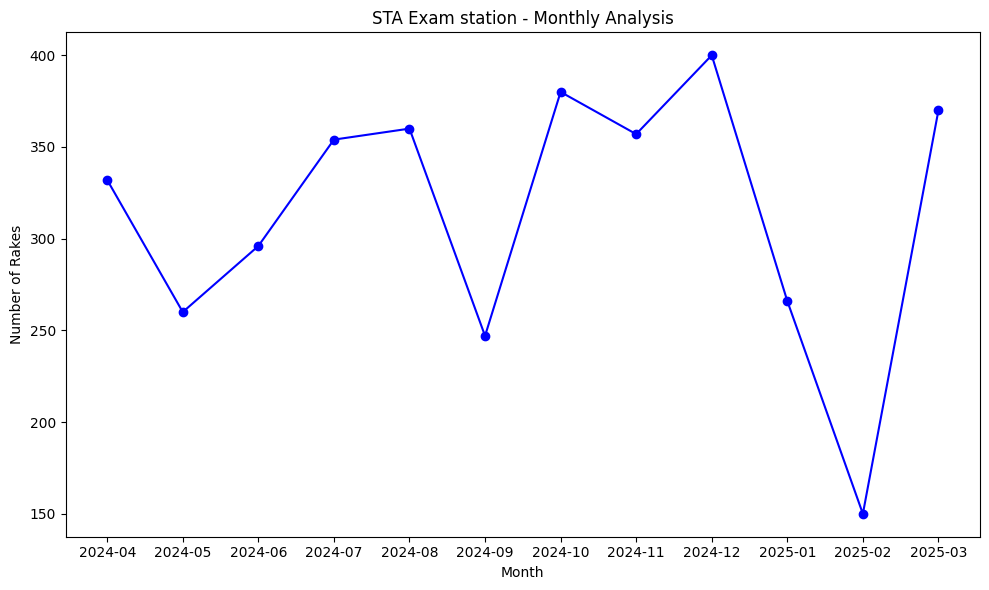

In [36]:
plt.figure(figsize=(10,6))
plt.plot(sta_monthly['R_MONTH'], sta_monthly['RAKE_COUNT'], marker='o', linestyle='-', color='blue')
plt.title('STA Exam station - Monthly Analysis')
plt.xlabel('Month')
plt.ylabel('Number of Rakes')
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\1718429497.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\1718429497.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\1718429497.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_mont

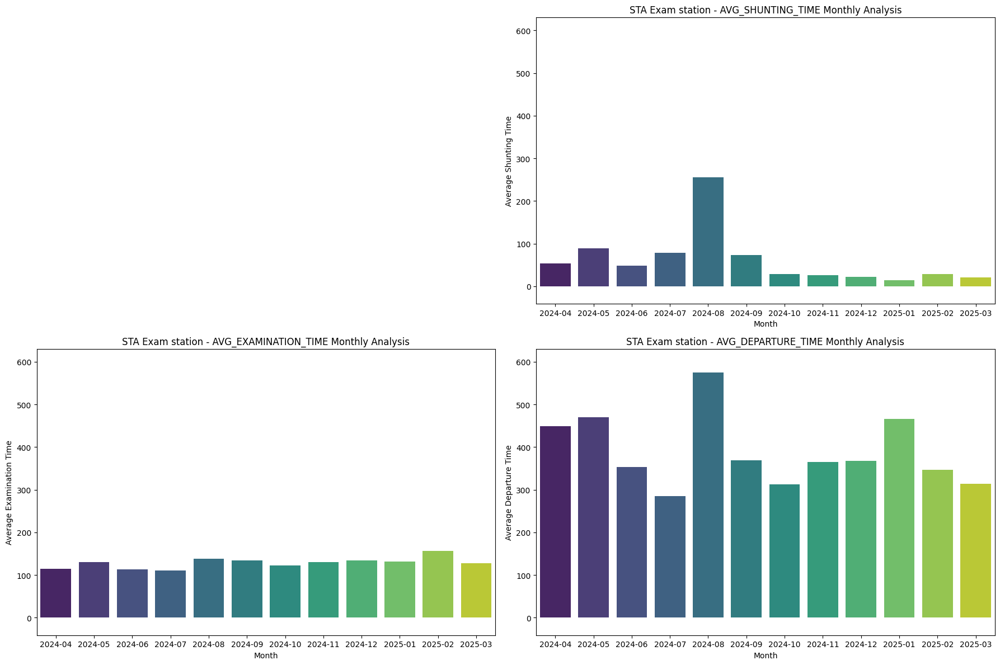

In [37]:
min_y = min(sta_monthly['AVG_SHUNTING_TIME'].min(),
            sta_monthly['AVG_EXAMINATION_TIME'].min(),
            sta_monthly['AVG_DEPARTURE_TIME'].min())

max_y = max(sta_monthly['AVG_SHUNTING_TIME'].max(),
            sta_monthly['AVG_EXAMINATION_TIME'].max(),
            sta_monthly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].axis('off')

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_SHUNTING_TIME Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_EXAMINATION_TIME Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('STA Exam station - AVG_DEPARTURE_TIME Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2652942343.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2652942343.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2652942343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns

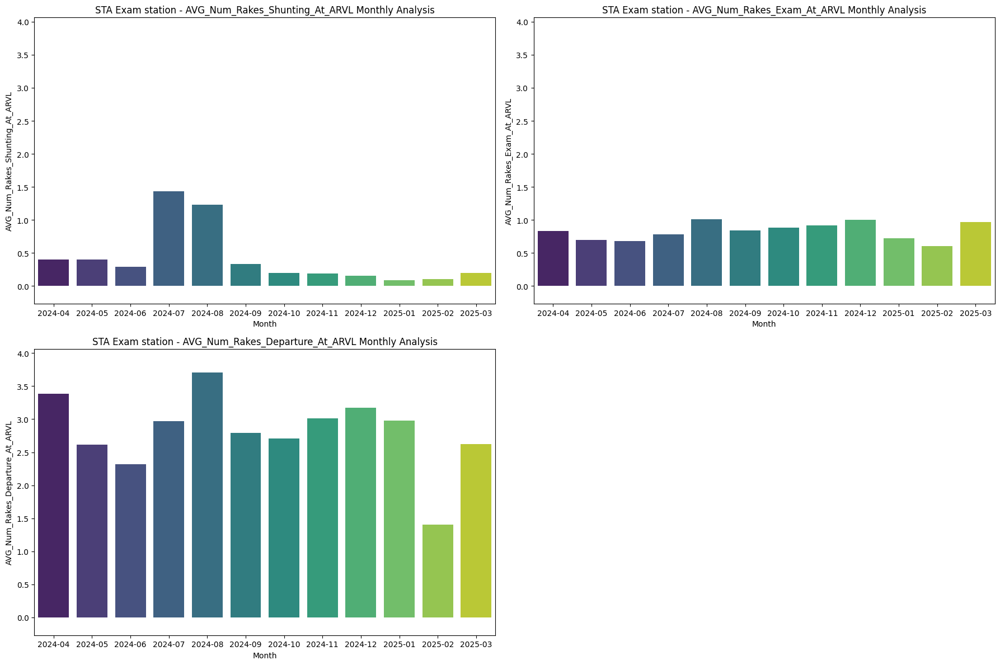

In [38]:
min_y = min(sta_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            sta_monthly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            sta_monthly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(sta_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            sta_monthly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            sta_monthly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\192931776.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\192931776.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\192931776.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.b

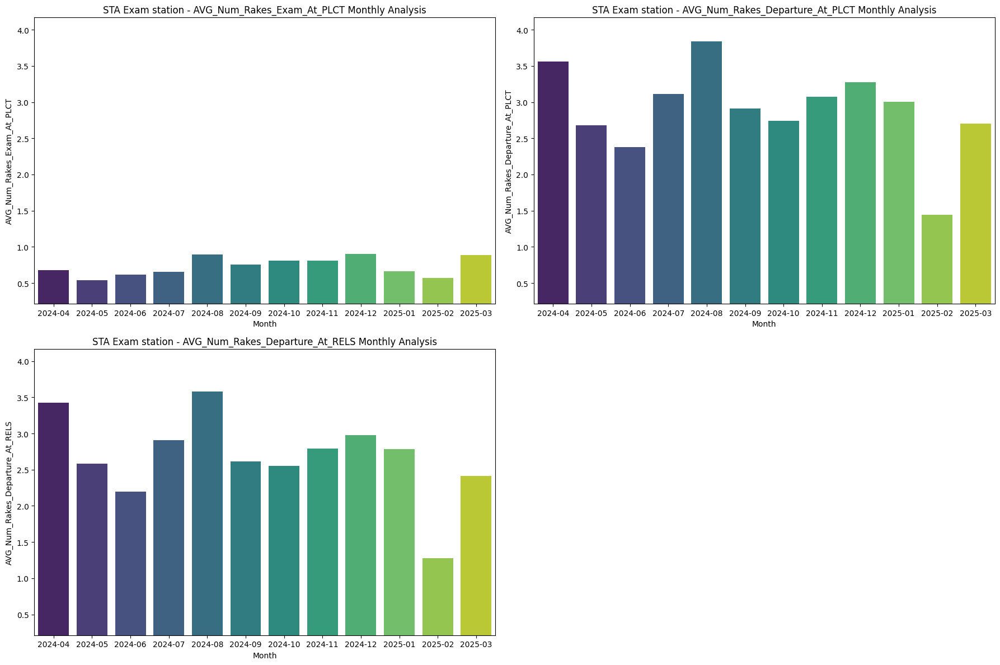

In [39]:
min_y = min(sta_monthly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            sta_monthly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            sta_monthly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(sta_monthly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            sta_monthly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            sta_monthly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [40]:
sta_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,332,53.493976,115.174699,448.921687,0.403614,0.828313,3.382530,0.677711,3.557229,3.424699,128.123494,127.334337,127.680723,128.316265
1,2024-05,260,88.819231,130.000000,470.161538,0.396154,0.696154,2.611538,0.542308,2.676923,2.580769,171.161538,172.576923,171.346154,171.846154
2,2024-06,296,48.706081,113.016892,352.601351,0.290541,0.675676,2.317568,0.614865,2.375000,2.199324,148.442568,147.905405,148.327703,145.962838
3,2024-07,354,78.717514,111.211864,284.887006,1.432203,0.776836,2.966102,0.658192,3.112994,2.909605,125.206215,125.875706,125.564972,125.997175
4,2024-08,360,255.038889,137.808333,574.258333,1.227778,1.005556,3.702778,0.891667,3.838889,3.577778,123.877778,123.375000,124.069444,124.061111
5,2024-09,247,73.429150,134.008097,369.635628,0.327935,0.842105,2.793522,0.757085,2.910931,2.615385,174.554656,175.263158,175.263158,175.056680
6,2024-10,380,29.026316,122.550000,313.142105,0.200000,0.884211,2.710526,0.810526,2.742105,2.555263,118.068421,117.513158,116.894737,116.844737
7,2024-11,357,25.736695,129.966387,365.084034,0.184874,0.915966,3.008403,0.809524,3.072829,2.795518,120.644258,120.728291,121.750700,121.456583
8,2024-12,400,21.435000,134.007500,368.035000,0.155000,1.002500,3.175000,0.900000,3.275000,2.980000,112.467500,112.325000,111.387500,111.735000
9,2025-01,266,14.766917,131.815789,465.860902,0.090226,0.721805,2.981203,0.661654,3.007519,2.785714,165.424812,165.676692,166.278195,165.962406


C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3067118718.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3067118718.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3067118718.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot

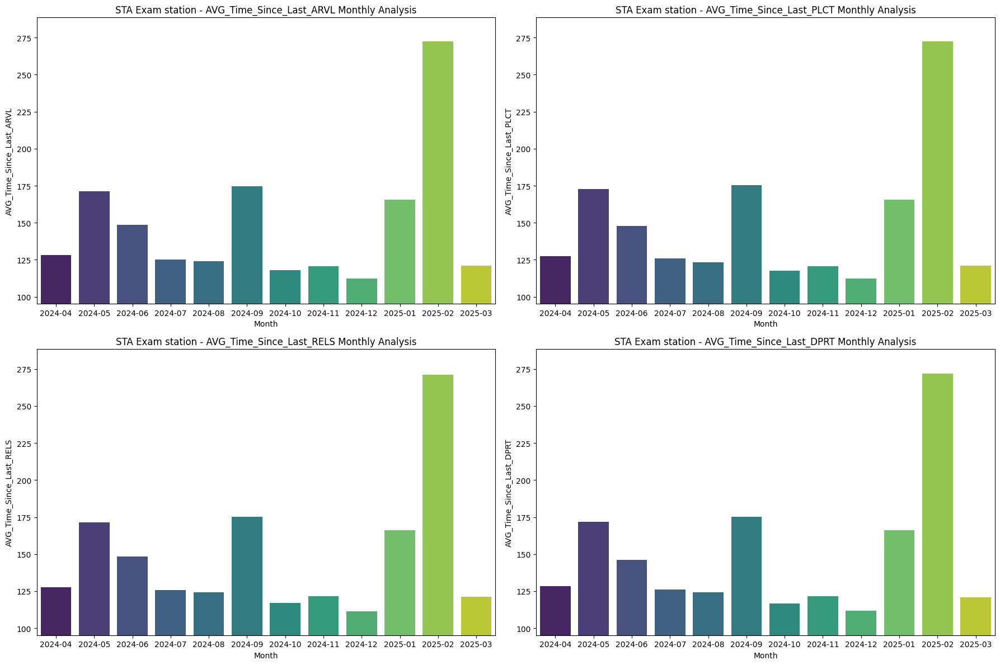

In [41]:
min_y = min(sta_monthly['AVG_Time_Since_Last_ARVL'].min(),
            sta_monthly['AVG_Time_Since_Last_PLCT'].min(),
            sta_monthly['AVG_Time_Since_Last_RELS'].min(),
            sta_monthly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(sta_monthly['AVG_Time_Since_Last_ARVL'].max(),
            sta_monthly['AVG_Time_Since_Last_PLCT'].max(),
            sta_monthly['AVG_Time_Since_Last_RELS'].max(),
            sta_monthly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Time_Since_Last_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Time_Since_Last_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Time_Since_Last_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_monthly['R_MONTH'], y=sta_monthly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('STA Exam station - AVG_Time_Since_Last_DPRT Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [42]:
monthly_rake_type_count = df1.groupby(['R_MONTH', 'RAKETYPE'])['RDATE'].count().reset_index(name='RAKE_COUNT')
monthly_rake_type_count = pd.DataFrame(monthly_rake_type_count)

monthly_shunting_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_shunting_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_SHUNTING_TIME'] = monthly_rake_type_count['Shunting_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_examination_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_EXAMINATION_TIME'] = monthly_rake_type_count['Examination_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_departure_lag_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_DEPARTURE_TIME'] = monthly_rake_type_count['Departure_Lag'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_rake_type_count['numrakes1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_rake_type_count['numrakes2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_rake_type_count['numrakes3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_rake_type_count['numrakes4'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes5, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_rake_type_count['numrakes5'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes6, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'] = monthly_rake_type_count['numrakes6'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_ARVL'] = monthly_rake_type_count['timesince1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_PLCT'] = monthly_rake_type_count['timesince2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_RELS'] = monthly_rake_type_count['timesince3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_DPRT'] = monthly_rake_type_count['timesince4'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag','numrakes1','numrakes2','numrakes3','numrakes4','numrakes5','numrakes6','timesince1','timesince2','timesince3','timesince4'], axis=1, inplace=True)

monthly_rake_type_count

,R_MONTH,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,BCN,252,44.722222,100.170635,412.916667,0.424603,0.853175,3.440476,0.694444,3.654762,3.519841,119.309524,116.666667,121.924603,118.329365
1,2024-04,BCNAHSM1,7,55.285714,78.571429,308.857143,0.428571,0.571429,3.714286,0.714286,3.714286,3.428571,139.571429,148.000000,158.000000,80.142857
2,2024-04,BCNHL,72,83.791667,165.694444,588.055556,0.333333,0.763889,3.166667,0.625000,3.208333,3.097222,156.472222,160.680556,144.361111,168.208333
3,2024-04,BLC,1,70.000000,515.000000,485.000000,0.000000,1.000000,2.000000,0.000000,3.000000,3.000000,228.000000,270.000000,165.000000,110.000000
4,2024-05,BCN,184,74.336957,106.331522,395.630435,0.369565,0.673913,2.565217,0.510870,2.657609,2.538043,170.239130,173.804348,176.820652,183.739130
5,2024-05,BCNAHSM1,2,442.500000,115.000000,557.000000,1.000000,0.500000,3.500000,0.500000,3.500000,4.000000,67.500000,57.500000,87.500000,198.000000
6,2024-05,BCNHL,72,99.513889,188.263889,663.986111,0.444444,0.777778,2.694444,0.625000,2.708333,2.652778,177.541667,174.722222,158.750000,144.722222
7,2024-05,BLC,2,682.500000,225.000000,262.500000,0.500000,0.000000,3.000000,0.500000,2.500000,2.500000,130.000000,97.500000,205.000000,28.000000
8,2024-06,BCN,198,53.702020,97.666667,327.060606,0.277778,0.702020,2.267677,0.621212,2.343434,2.126263,147.666667,151.297980,143.712121,140.873737
9,2024-06,BCNAHSM1,5,54.000000,119.000000,179.800000,0.200000,1.000000,2.200000,0.600000,3.000000,3.200000,169.000000,43.000000,102.000000,88.200000


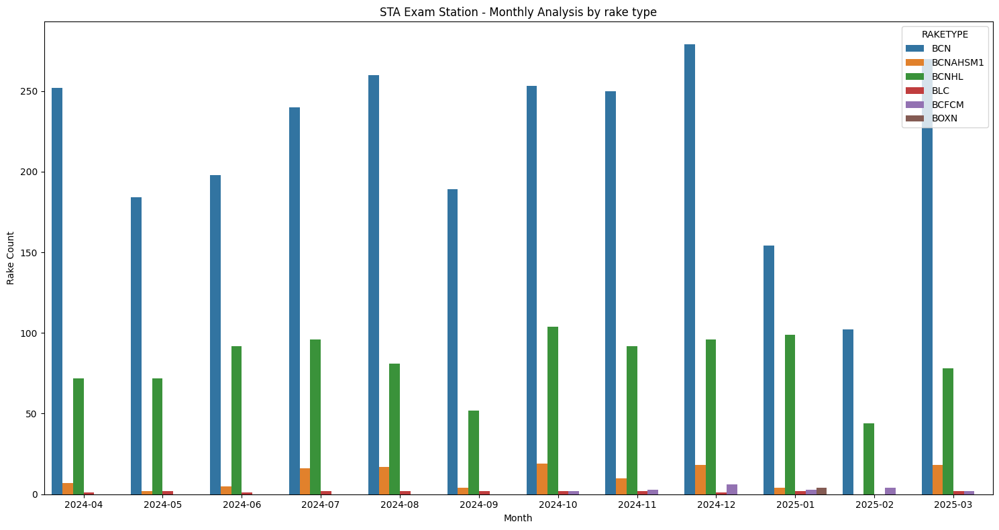

In [43]:
plt.figure(figsize=(15,8))
sns.barplot(monthly_rake_type_count, x='R_MONTH', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('STA Exam Station - Monthly Analysis by rake type')
plt.xlabel('Month')
plt.ylabel('Rake Count')
plt.tight_layout()
plt.show()

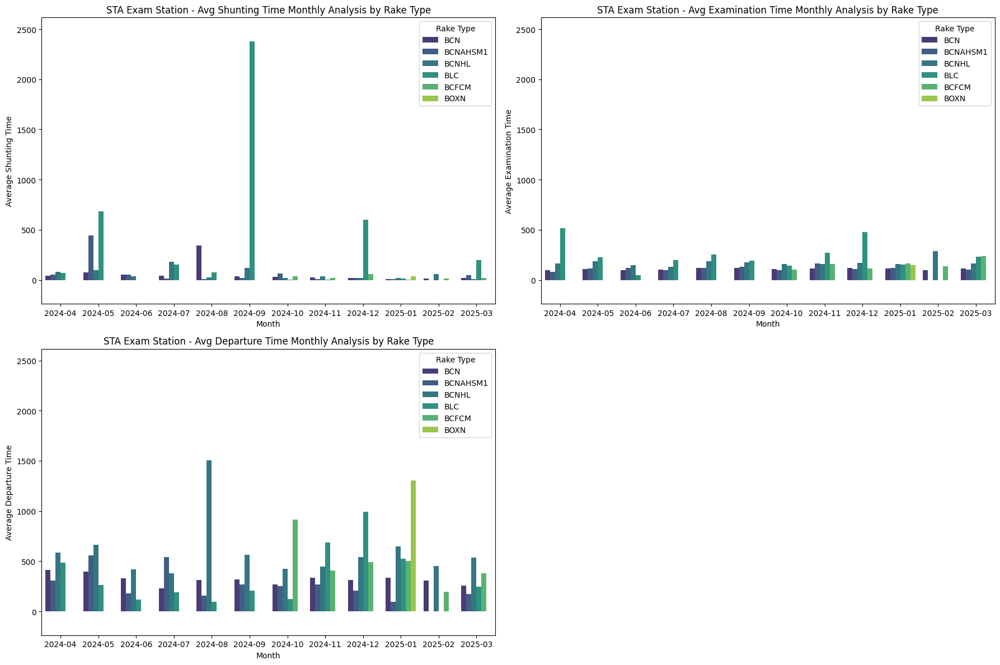

In [44]:
min_y = min(monthly_rake_type_count['AVG_SHUNTING_TIME'].min(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].min(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].min())

max_y = max(monthly_rake_type_count['AVG_SHUNTING_TIME'].max(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].max(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_SHUNTING_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam Station - Avg Shunting Time Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Average Shunting Time')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_EXAMINATION_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam Station - Avg Examination Time Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Examination Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_DEPARTURE_TIME', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam Station - Avg Departure Time Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Departure Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

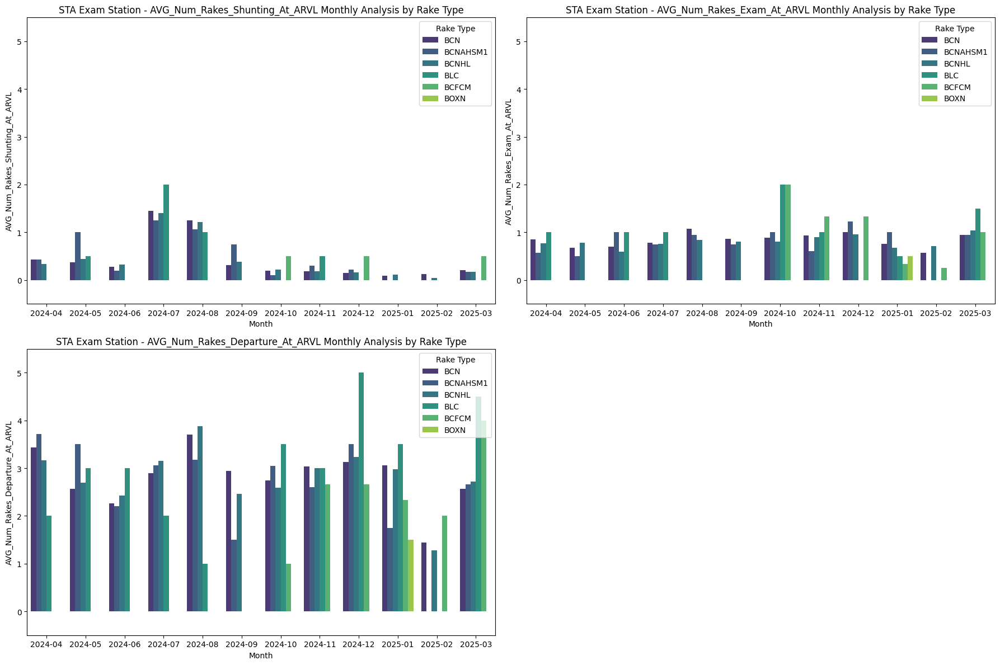

In [45]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Shunting_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam Station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

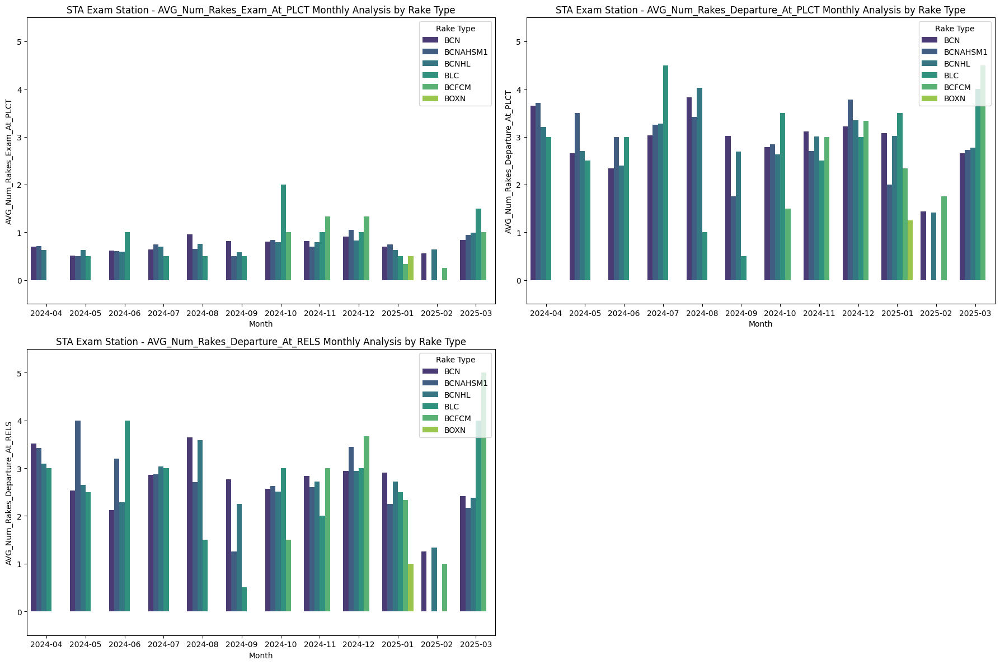

In [46]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam Station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

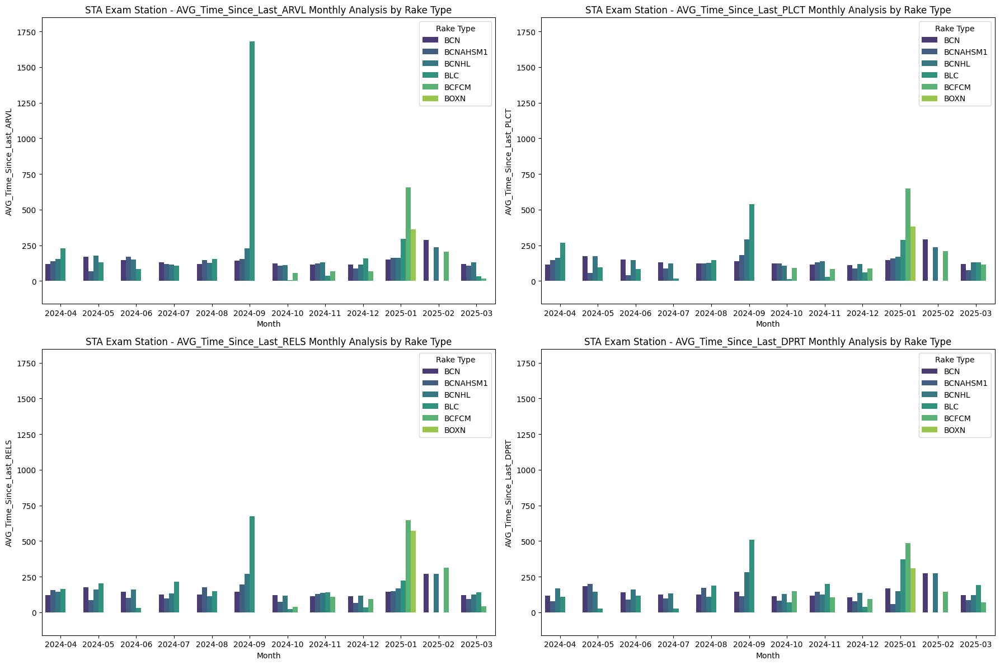

In [47]:
min_y = min(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].min())

max_y = max(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam Station - AVG_Time_Since_Last_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam Station - AVG_Time_Since_Last_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam Station - AVG_Time_Since_Last_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_DPRT', hue='RAKETYPE', palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('STA Exam Station - AVG_Time_Since_Last_DPRT Monthly Analysis by Rake Type')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 1].legend(title='Rake Type', loc='upper right')

plt.tight_layout()
plt.show()

#### Weekly Analysis

In [48]:
sta_weekly = df1['R_WEEK'].value_counts(sort=False).reset_index()
sta_weekly.columns =['R_WEEK','RAKE_COUNT']
sta_weekly = pd.DataFrame(sta_weekly)

weekly_shunting_time_sum = df1.groupby('R_WEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = df1.groupby('R_WEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = df1.groupby('R_WEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekly_numrakes1 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekly_numrakes2 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekly_numrakes3 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekly_numrakes4 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekly_numrakes5 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekly_numrakes6 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekly_timesince1 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekly_timesince2 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekly_timesince3 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekly_timesince4 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

sta_weekly['AVG_SHUNTING_TIME'] = weekly_shunting_time_sum['Shunting_Time'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_EXAMINATION_TIME'] = weekly_examination_time_sum['Examination_Time'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_DEPARTURE_TIME'] = weekly_departure_lag_time_sum['Departure_Lag'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Shunting_At_ARVL'] = weekly_numrakes1['numrakes1'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Exam_At_ARVL'] = weekly_numrakes2['numrakes2'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Departure_At_ARVL'] = weekly_numrakes3['numrakes3'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Exam_At_PLCT'] = weekly_numrakes4['numrakes4'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Departure_At_PLCT'] = weekly_numrakes5['numrakes5'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Num_Rakes_Departure_At_RELS'] = weekly_numrakes6['numrakes6'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Time_Since_Last_ARVL'] = weekly_timesince1['timesince1'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Time_Since_Last_PLCT'] = weekly_timesince2['timesince2'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Time_Since_Last_RELS'] = weekly_timesince3['timesince3'] / sta_weekly['RAKE_COUNT']
sta_weekly['AVG_Time_Since_Last_DPRT'] = weekly_timesince4['timesince4'] / sta_weekly['RAKE_COUNT']

sta_weekly.head()

,R_WEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,W-14-2024,82,61.975610,99.024390,424.597561,0.512195,0.731707,3.500000,0.621951,3.548780,3.524390,122.048780,120.914634,119.329268,116.780488
1,W-15-2024,85,26.917647,87.388235,447.364706,0.223529,0.752941,3.823529,0.623529,4.011765,3.941176,111.658824,110.000000,109.058824,117.894118
2,W-16-2024,70,48.542857,129.214286,514.828571,0.242857,0.828571,3.342857,0.614286,3.485714,3.271429,142.428571,145.357143,150.142857,141.057143
3,W-17-2024,78,68.217949,140.448718,406.653846,0.551282,0.935897,2.756410,0.794872,3.012821,2.846154,131.717949,132.756410,130.705128,131.858974
4,W-18-2024,65,84.338462,145.692308,596.307692,0.400000,0.815385,3.569231,0.584615,3.723077,3.523077,153.384615,153.230769,157.615385,155.538462


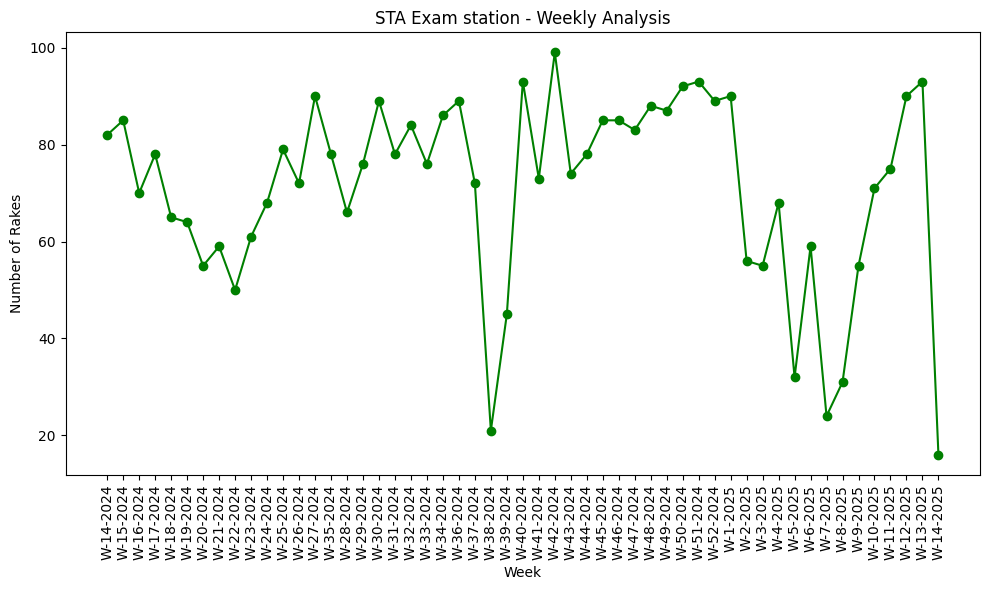

In [49]:
plt.figure(figsize=(10,6))
plt.plot(sta_weekly['R_WEEK'], sta_weekly['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam station - Weekly Analysis')
plt.xlabel('Week')
plt.ylabel('Number of Rakes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2836062148.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2836062148.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2836062148.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anan

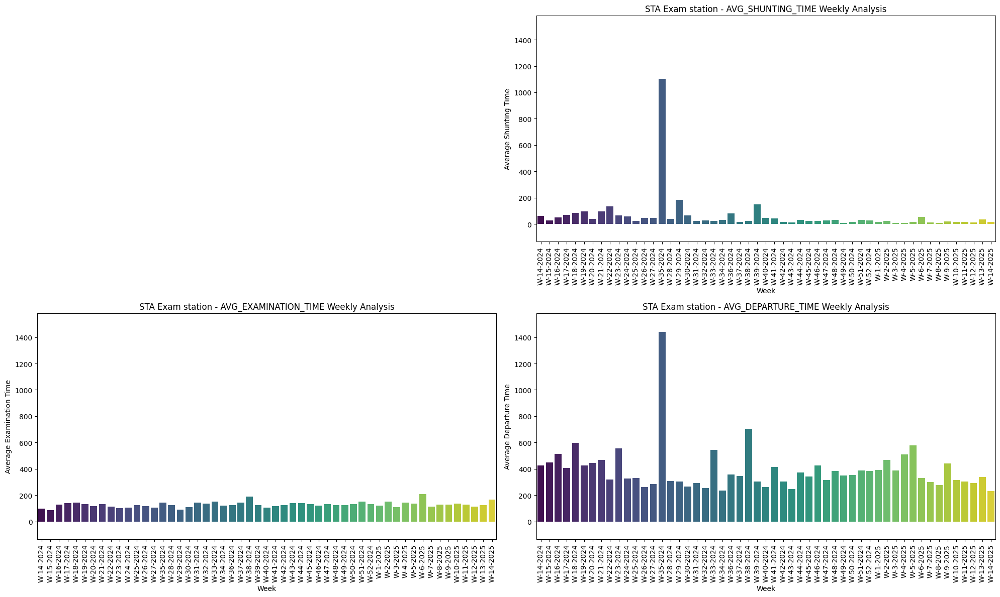

In [50]:
min_y = min(sta_weekly['AVG_SHUNTING_TIME'].min(),
            sta_weekly['AVG_EXAMINATION_TIME'].min(),
            sta_weekly['AVG_DEPARTURE_TIME'].min())

max_y = max(sta_weekly['AVG_SHUNTING_TIME'].max(),
            sta_weekly['AVG_EXAMINATION_TIME'].max(),
            sta_weekly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].axis('off')

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_SHUNTING_TIME Weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_EXAMINATION_TIME Weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('STA Exam station - AVG_DEPARTURE_TIME Weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2040341622.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2040341622.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\2040341622.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barpl

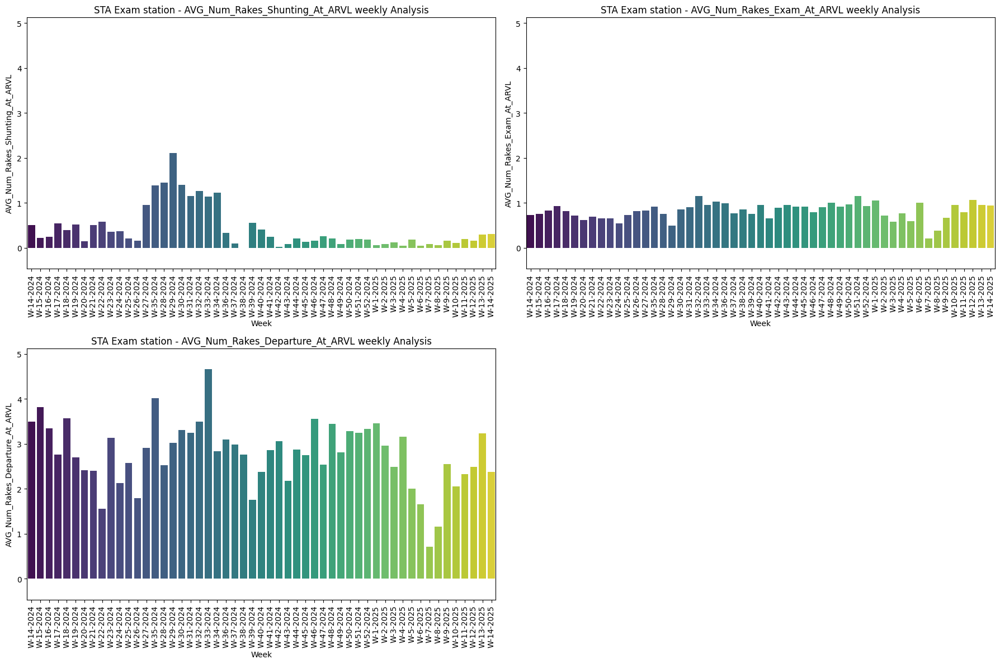

In [51]:
min_y = min(sta_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            sta_weekly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            sta_weekly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(sta_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            sta_weekly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            sta_weekly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Num_Rakes_Shunting_At_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Num_Rakes_Exam_At_ARVL weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_ARVL weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3844047225.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3844047225.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3844047225.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barp

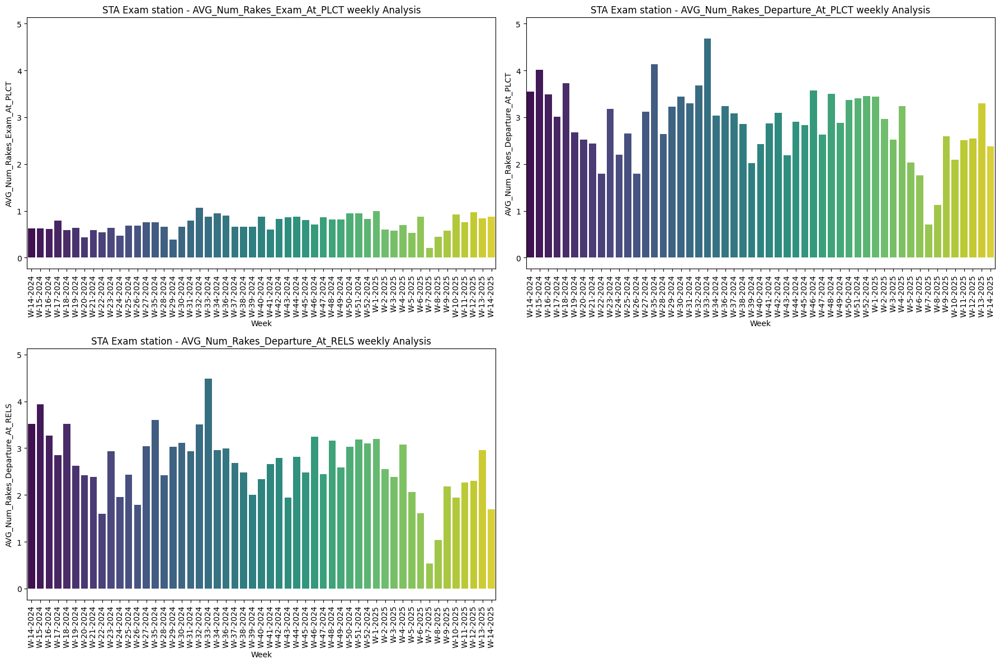

In [52]:
min_y = min(sta_weekly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            sta_weekly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            sta_weekly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(sta_weekly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            sta_weekly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            sta_weekly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Num_Rakes_Exam_At_PLCT weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Num_Rakes_Departure_At_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3226029677.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3226029677.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_19484\3226029677.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sta

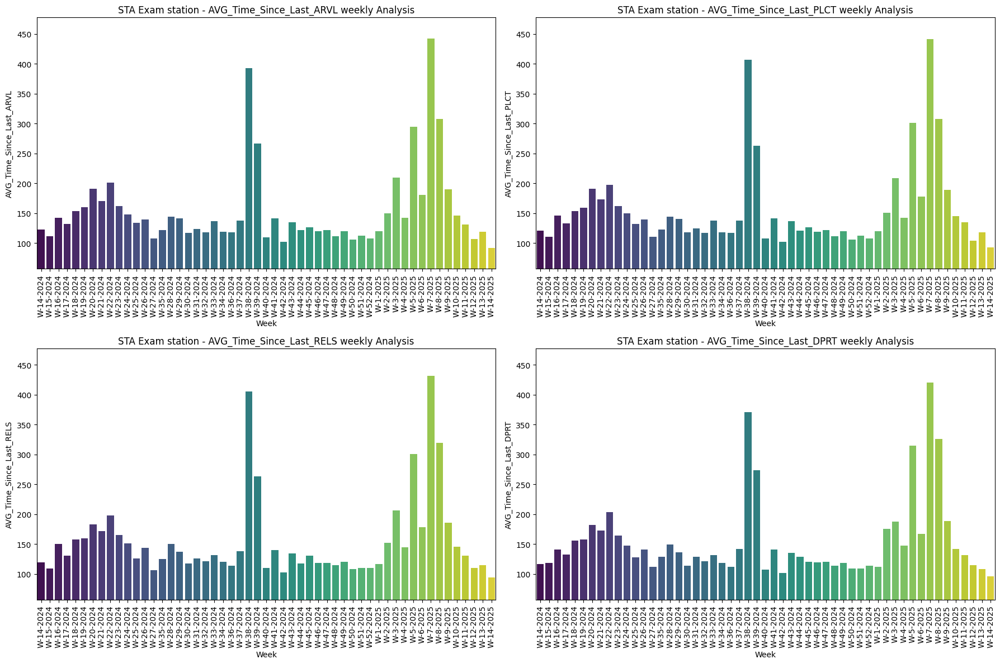

In [53]:
min_y = min(sta_weekly['AVG_Time_Since_Last_ARVL'].min(),
            sta_weekly['AVG_Time_Since_Last_PLCT'].min(),
            sta_weekly['AVG_Time_Since_Last_RELS'].min(),
            sta_weekly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(sta_weekly['AVG_Time_Since_Last_ARVL'].max(),
            sta_weekly['AVG_Time_Since_Last_PLCT'].max(),
            sta_weekly['AVG_Time_Since_Last_RELS'].max(),
            sta_weekly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('STA Exam station - AVG_Time_Since_Last_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('STA Exam station - AVG_Time_Since_Last_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('STA Exam station - AVG_Time_Since_Last_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=sta_weekly['R_WEEK'], y=sta_weekly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('STA Exam station - AVG_Time_Since_Last_DPRT weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].tick_params(axis='x', labelrotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [54]:
weekly_rake_type_count = sta.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
weekly_rake_type_count = pd.DataFrame(weekly_rake_type_count)

weekly_shunting_time_sum = sta.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = sta.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = sta.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')

weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_shunting_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_SHUNTING_TIME'] = weekly_rake_type_count['Shunting_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_examination_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_EXAMINATION_TIME'] = weekly_rake_type_count['Examination_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_departure_lag_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_DEPARTURE_TIME'] = weekly_rake_type_count['Departure_Lag'] / weekly_rake_type_count['RAKE_COUNT']

weekly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag'], axis=1, inplace=True)

weekly_rake_type_count

,R_WEEK,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
0,W-14-2024,BCN,57,39.438596,88.157895,391.000000
1,W-14-2024,BCNHL,21,133.523810,132.142857,566.571429
2,W-14-2024,BCNAHSM1,4,7.500000,80.000000,158.000000
3,W-15-2024,BCN,68,17.955882,69.014706,372.647059
4,W-15-2024,BCNHL,15,65.000000,167.000000,754.066667
...,...,...,...,...,...,...
167,W-13-2025,BCNAHSM1,5,153.600000,69.800000,154.600000
168,W-13-2025,BCFCM,2,17.500000,240.000000,380.000000
169,W-14-2025,BCN,10,12.200000,129.000000,170.200000
170,W-14-2025,BCNAHSM1,4,10.500000,182.500000,175.250000


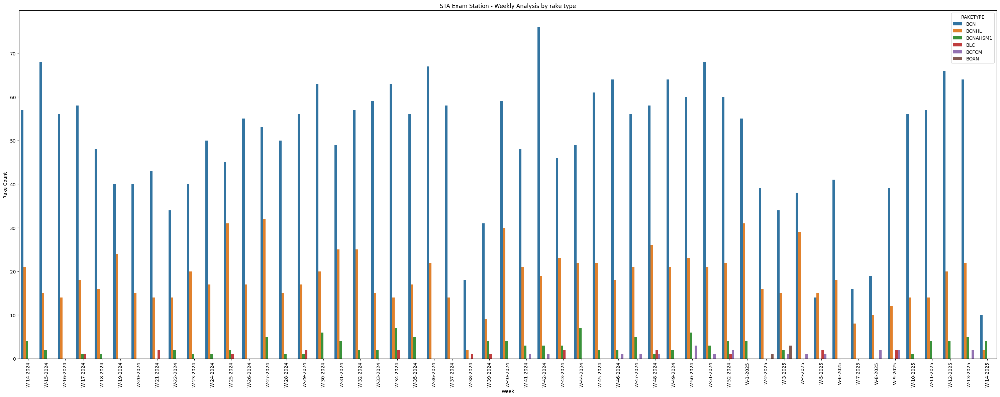

In [55]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('STA Exam Station - Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

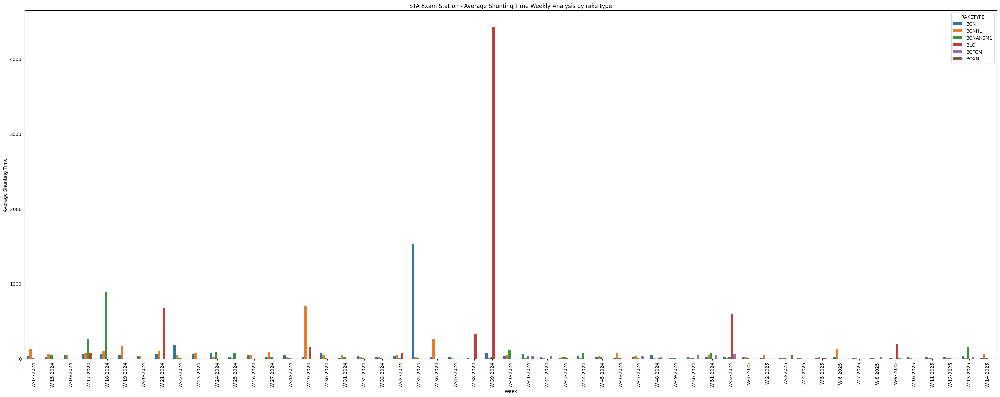

In [56]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_SHUNTING_TIME', hue='RAKETYPE')
plt.title('STA Exam Station - Average Shunting Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Shunting Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

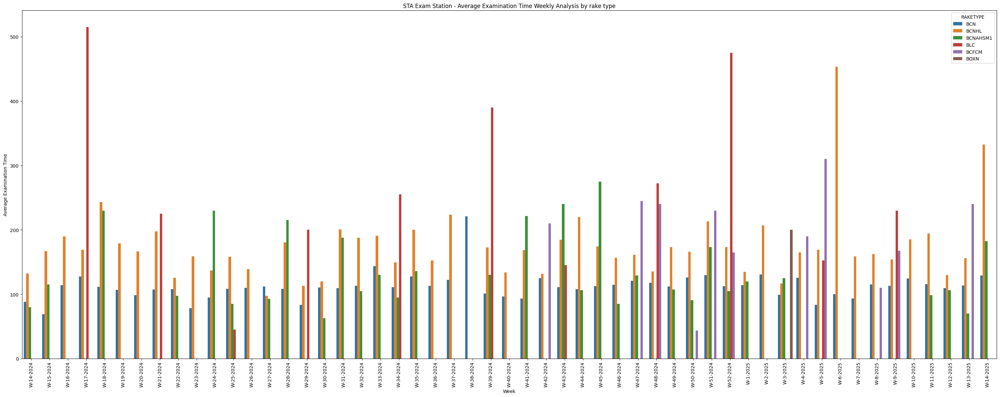

In [57]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_EXAMINATION_TIME', hue='RAKETYPE')
plt.title('STA Exam Station - Average Examination Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Examination Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

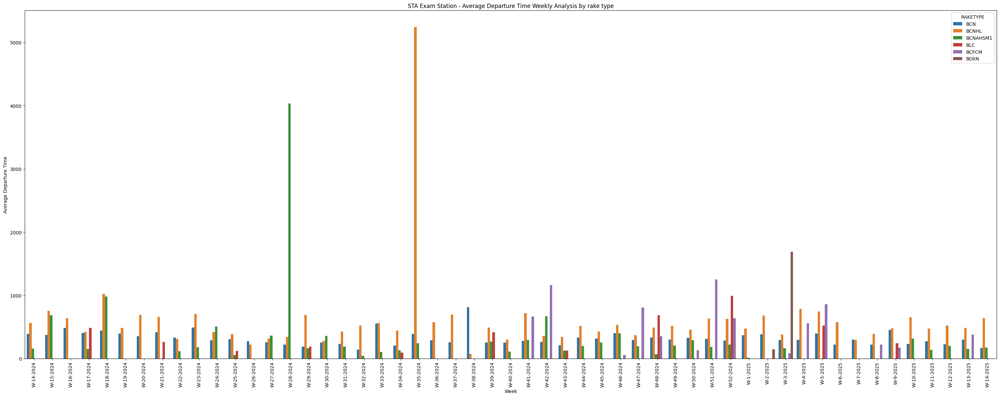

In [58]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_DEPARTURE_TIME', hue='RAKETYPE')
plt.title('STA Exam Station - Average Departure Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Departure Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Daily Analysis

In [59]:
sta_daily = df1.groupby('R_DATEOFMONTH', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_daily = pd.DataFrame(sta_daily)

daily_shunting_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
daily_examination_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
daily_departure_lag_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
daily_numrakes1 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
daily_numrakes2 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
daily_numrakes3 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
daily_numrakes4 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
daily_numrakes5 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
daily_numrakes6 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
daily_timesince1 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
daily_timesince2 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
daily_timesince3 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
daily_timesince4 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

sta_daily['AVG_SHUNTING_TIME'] = daily_shunting_time_sum['Shunting_Time'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_EXAMINATION_TIME'] = daily_examination_time_sum['Examination_Time'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_DEPARTURE_TIME'] = daily_departure_lag_time_sum['Departure_Lag'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Shunting_At_ARVL'] = daily_numrakes1['numrakes1'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Exam_At_ARVL'] = daily_numrakes2['numrakes2'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Departure_At_ARVL'] = daily_numrakes3['numrakes3'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Exam_At_PLCT'] = daily_numrakes4['numrakes4'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Departure_At_PLCT'] = daily_numrakes5['numrakes5'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Num_Rakes_Departure_At_RELS'] = daily_numrakes6['numrakes6'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Time_Since_Last_ARVL'] = daily_timesince1['timesince1'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Time_Since_Last_PLCT'] = daily_timesince2['timesince2'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Time_Since_Last_RELS'] = daily_timesince3['timesince3'] / sta_daily['RAKE_COUNT']
sta_daily['AVG_Time_Since_Last_DPRT'] = daily_timesince4['timesince4'] / sta_daily['RAKE_COUNT']

sta_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,11,16.181818,79.545455,330.272727,0.181818,0.727273,2.727273,0.636364,3.000000,3.272727,90.181818,85.454545,76.818182,84.181818
1,2024-04-02,8,17.625000,175.625000,652.875000,0.125000,0.375000,4.125000,0.250000,4.125000,3.500000,218.500000,198.750000,190.000000,168.125000
2,2024-04-03,16,13.750000,47.812500,349.375000,0.562500,0.812500,3.812500,0.812500,3.687500,4.125000,97.500000,108.062500,111.187500,96.250000
3,2024-04-04,8,110.375000,138.750000,600.000000,0.375000,1.000000,2.750000,0.875000,3.125000,3.500000,152.375000,143.250000,165.125000,169.625000
4,2024-04-05,11,119.818182,125.909091,408.909091,0.818182,1.000000,3.272727,0.818182,3.363636,3.090909,77.636364,105.000000,90.454545,116.363636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,2025-03-27,11,75.727273,135.363636,246.181818,0.545455,0.636364,1.727273,0.545455,1.727273,1.181818,131.727273,144.090909,156.818182,125.000000
359,2025-03-28,18,51.388889,118.611111,244.277778,0.444444,1.333333,3.222222,1.222222,3.277778,3.277778,81.722222,83.333333,82.777778,82.500000
360,2025-03-29,15,10.000000,120.666667,429.000000,0.266667,1.000000,4.266667,0.800000,4.666667,4.066667,69.333333,81.333333,77.666667,100.733333
361,2025-03-30,11,18.727273,162.272727,387.545455,0.000000,1.090909,3.363636,0.818182,3.454545,3.454545,162.636364,144.545455,145.909091,117.000000


In [60]:
import matplotlib.dates as mdates

In [61]:
sta_daily['R_DATEOFMONTH'] = pd.to_datetime(sta_daily['R_DATEOFMONTH'], format='%Y-%m-%d')

sta_daily = sta_daily.sort_values(by='R_DATEOFMONTH')

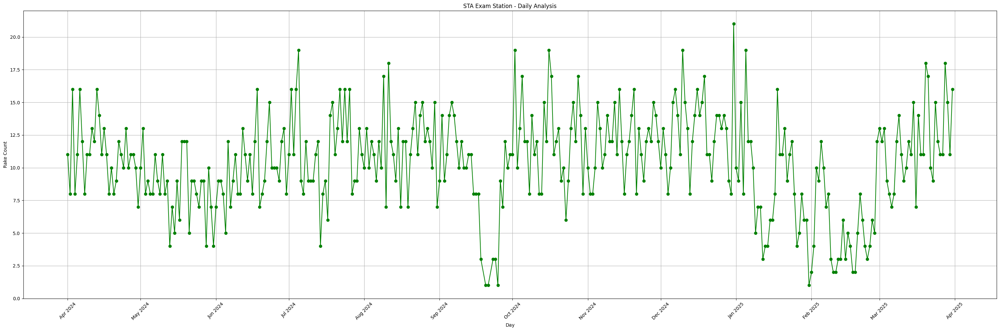

In [62]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['RAKE_COUNT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Rake Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

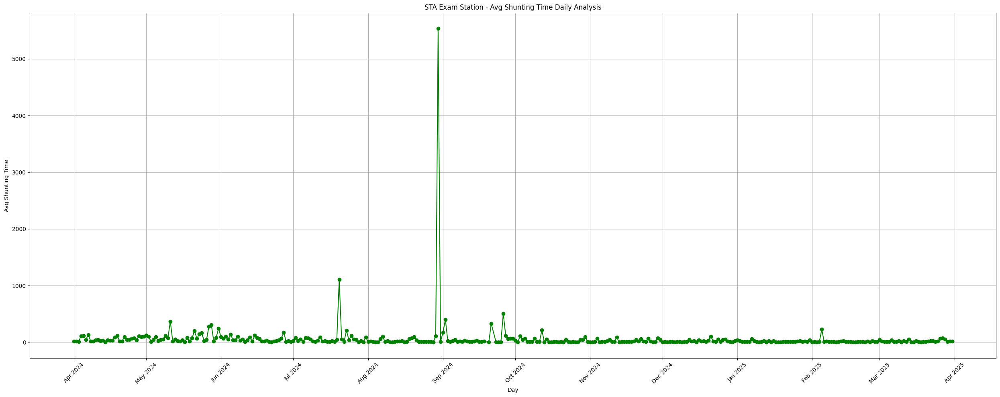

In [63]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - Avg Shunting Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Shunting Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [64]:
sta_daily[sta_daily['AVG_SHUNTING_TIME'] > 1000]

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
105,2024-07-20,11,1106.181818,117.727273,366.909091,2.181818,0.545455,2.636364,0.272727,2.909091,2.363636,116.090909,117.727273,117.272727,131.636364
95,2024-08-30,15,5534.400000,125.666667,5707.933333,2.000000,1.066667,4.000000,0.933333,4.133333,3.533333,122.266667,106.666667,121.333333,102.000000


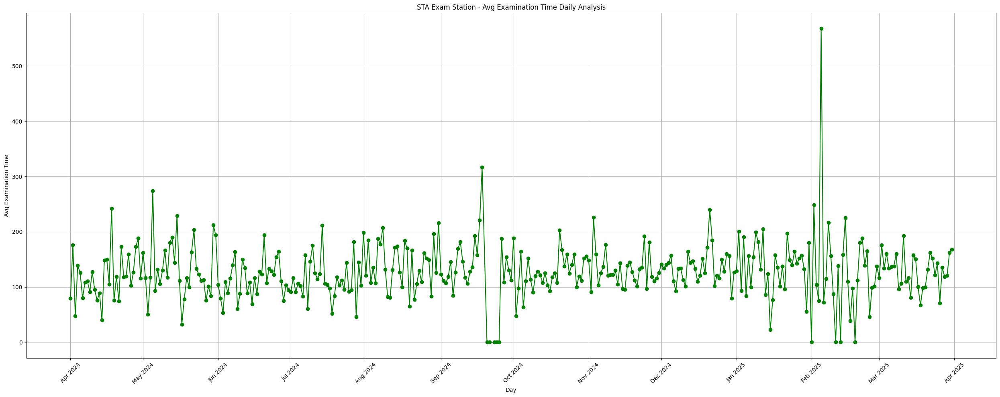

In [65]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - Avg Examination Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Examination Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

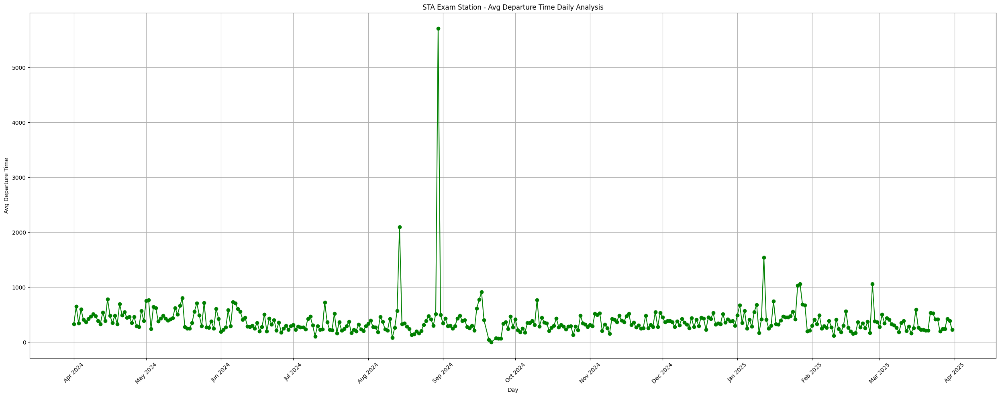

In [66]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - Avg Departure Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Departure Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

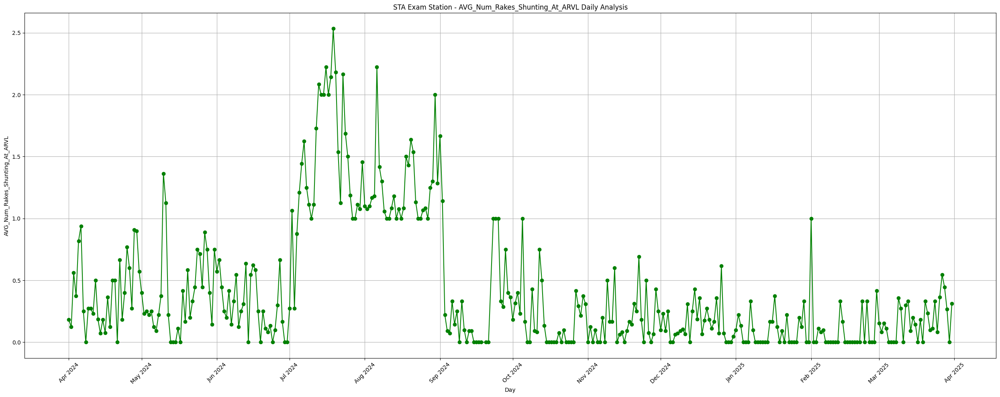

In [67]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

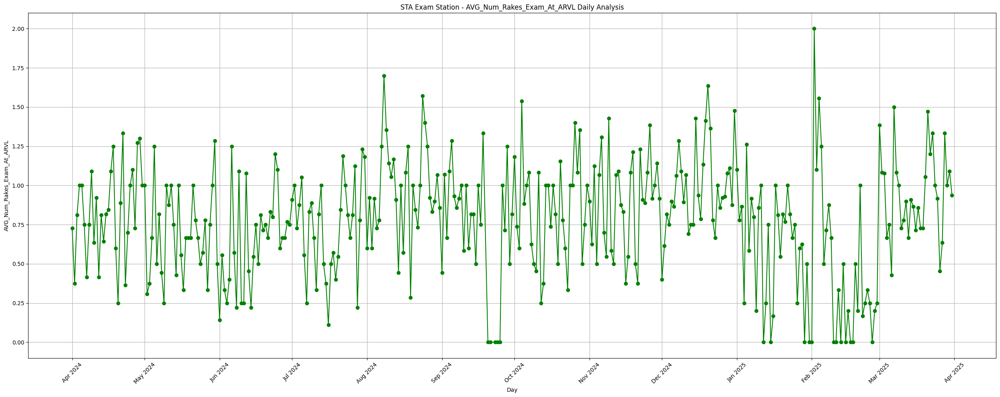

In [68]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Exam_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

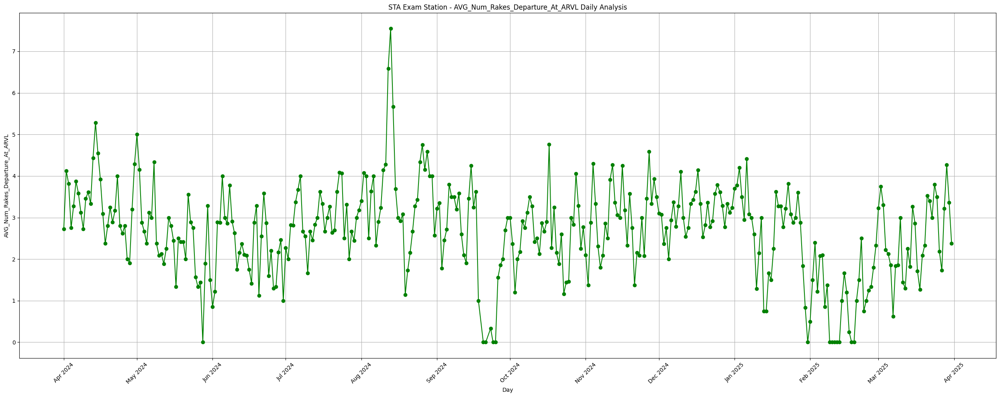

In [69]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

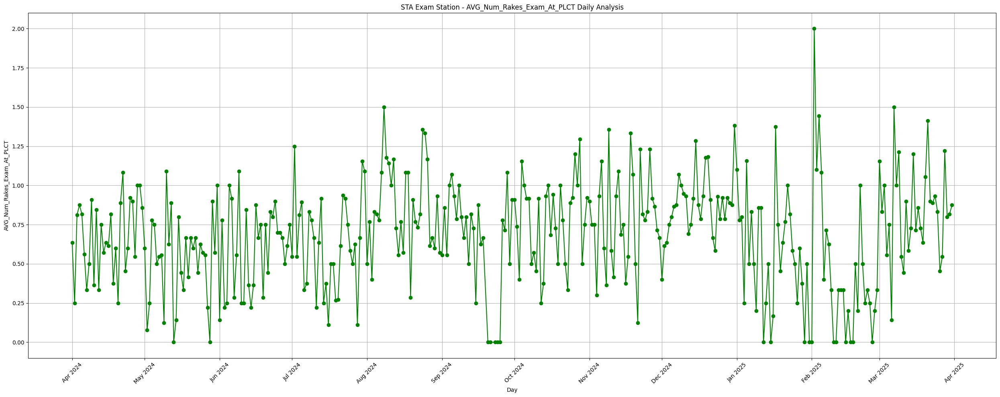

In [70]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Exam_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

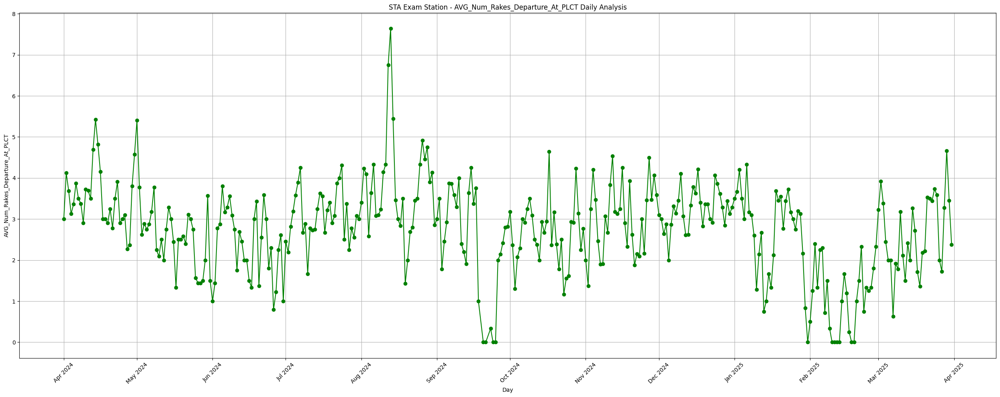

In [71]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

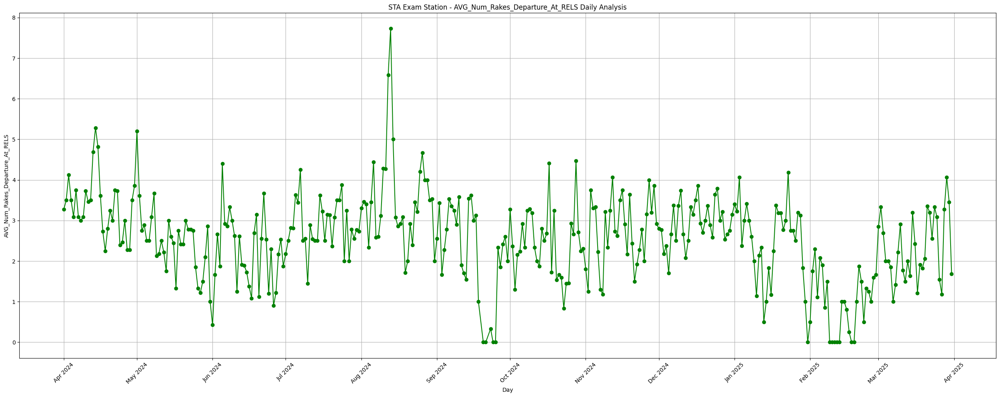

In [72]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Num_Rakes_Departure_At_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

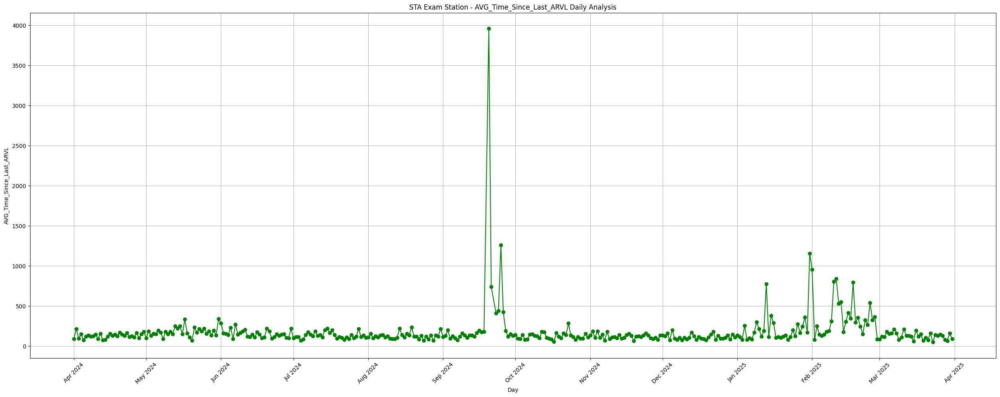

In [73]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Time_Since_Last_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

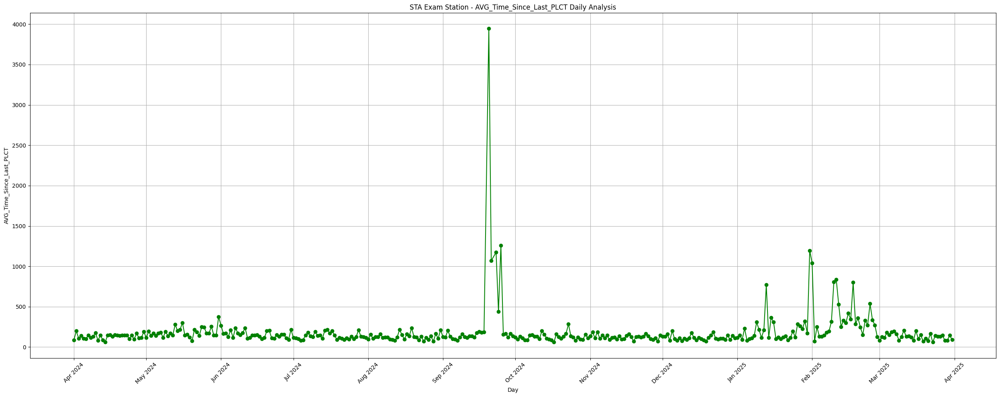

In [74]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Time_Since_Last_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

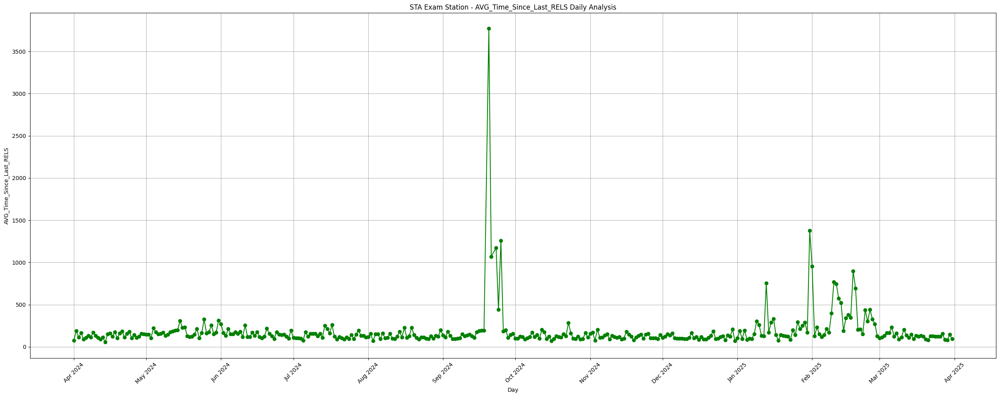

In [75]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Time_Since_Last_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

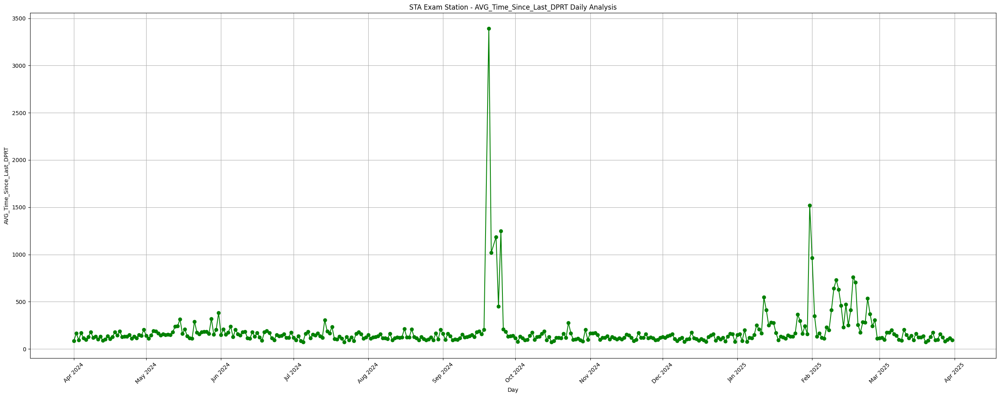

In [76]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(sta_daily['R_DATEOFMONTH'], sta_daily['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('STA Exam Station - AVG_Time_Since_Last_DPRT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Weekend Analysis

In [77]:
sta_weekend = df1.groupby('R_DAYOFWEEK', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_weekend = pd.DataFrame(sta_weekend)

weekend_shunting_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekend_examination_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekend_departure_lag_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekend_numrakes1 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekend_numrakes2 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekend_numrakes3 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekend_numrakes4 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekend_numrakes5 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekend_numrakes6 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekend_timesince1 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekend_timesince2 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekend_timesince3 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekend_timesince4 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

sta_weekend['AVG_SHUNTING_TIME'] = weekend_shunting_time_sum['Shunting_Time'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_EXAMINATION_TIME'] = weekend_examination_time_sum['Examination_Time'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_DEPARTURE_TIME'] = weekend_departure_lag_time_sum['Departure_Lag'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Shunting_At_ARVL'] = weekend_numrakes1['numrakes1'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Exam_At_ARVL'] = weekend_numrakes2['numrakes2'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Departure_At_ARVL'] = weekend_numrakes3['numrakes3'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Exam_At_PLCT'] = weekend_numrakes4['numrakes4'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Departure_At_PLCT'] = weekend_numrakes5['numrakes5'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Num_Rakes_Departure_At_RELS'] = weekend_numrakes6['numrakes6'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Time_Since_Last_ARVL'] = weekend_timesince1['timesince1'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Time_Since_Last_PLCT'] = weekend_timesince2['timesince2'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Time_Since_Last_RELS'] = weekend_timesince3['timesince3'] / sta_weekend['RAKE_COUNT']
sta_weekend['AVG_Time_Since_Last_DPRT'] = weekend_timesince4['timesince4'] / sta_weekend['RAKE_COUNT']

sta_weekend

,R_DAYOFWEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,0,547,43.051188,120.577697,371.497258,0.416819,0.848263,3.020110,0.758684,3.100548,2.831810,142.592322,146.638026,145.753199,141.012797
1,1,540,36.142593,128.966667,383.964815,0.420370,0.861111,3.083333,0.759259,3.238889,2.998148,145.983333,144.983333,143.272222,138.581481
2,2,524,35.826336,130.524809,381.469466,0.404580,0.812977,2.893130,0.732824,2.937023,2.723282,139.398855,137.442748,142.891221,142.129771
3,3,540,49.392593,128.579630,383.031481,0.451852,0.798148,2.670370,0.672222,2.753704,2.487037,139.205556,137.979630,135.970370,133.562963
4,4,562,181.811388,121.843416,453.149466,0.517794,0.896797,2.736655,0.793594,2.807829,2.635231,141.697509,140.099644,136.475089,138.679715
5,5,547,60.208410,128.398537,354.877514,0.464351,0.853748,2.959781,0.760512,3.043876,2.850091,131.659963,133.839122,133.919561,136.641682
6,6,512,27.929688,132.714844,385.076172,0.416016,0.876953,2.886719,0.783203,2.996094,2.796875,134.542969,133.931641,136.785156,144.126953


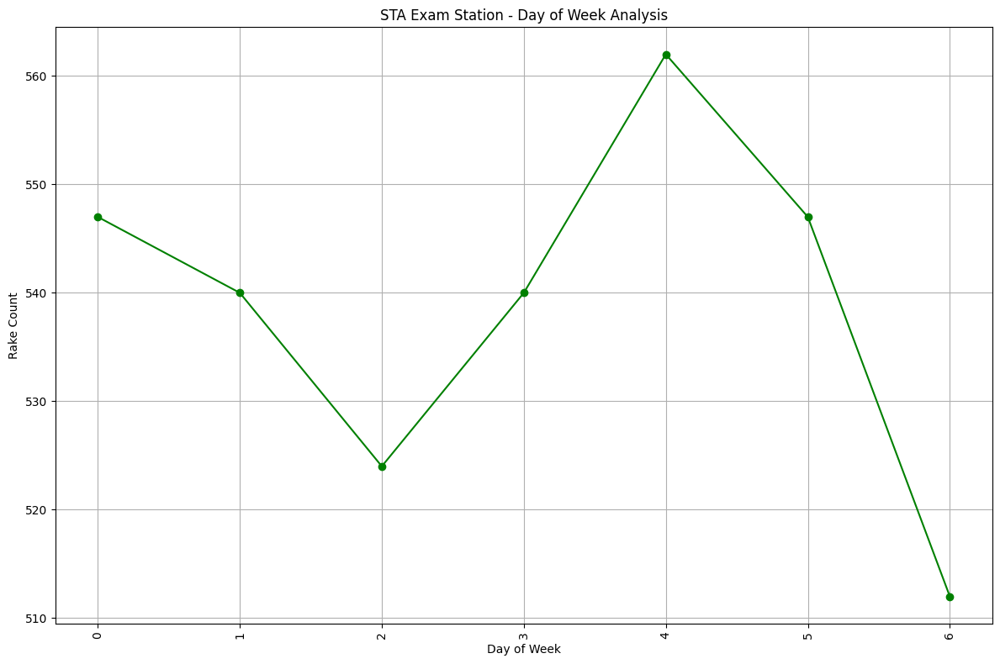

In [78]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

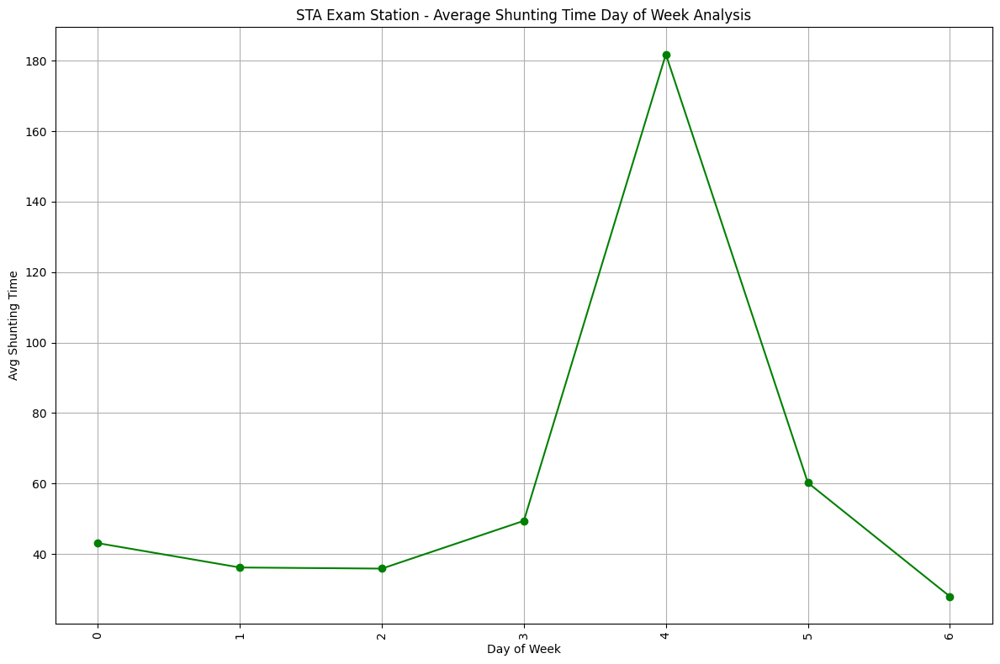

In [79]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Average Shunting Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Shunting Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

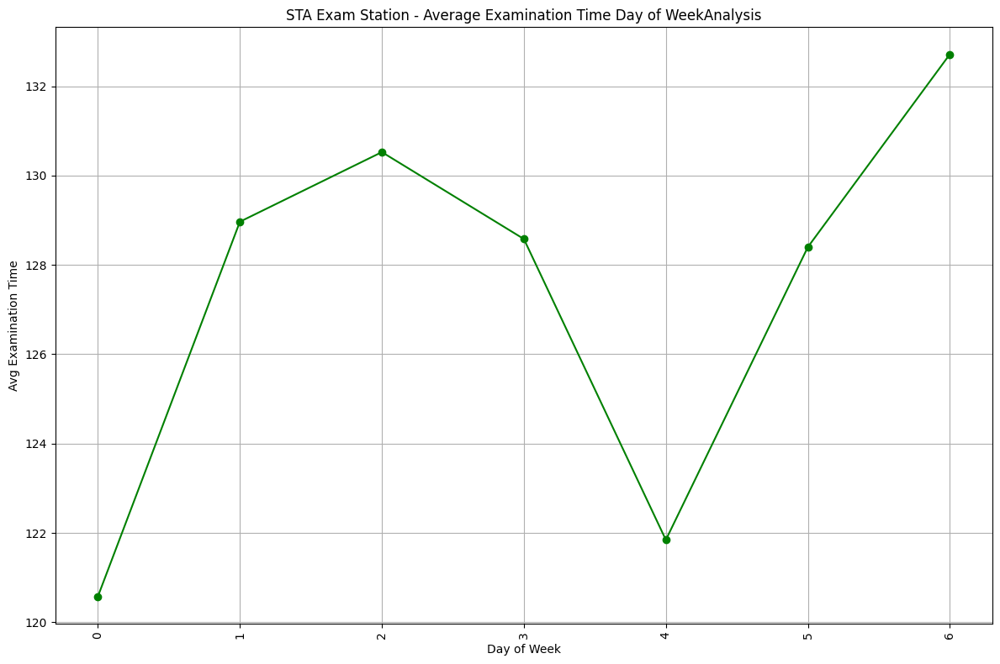

In [80]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Average Examination Time Day of WeekAnalysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Examination Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

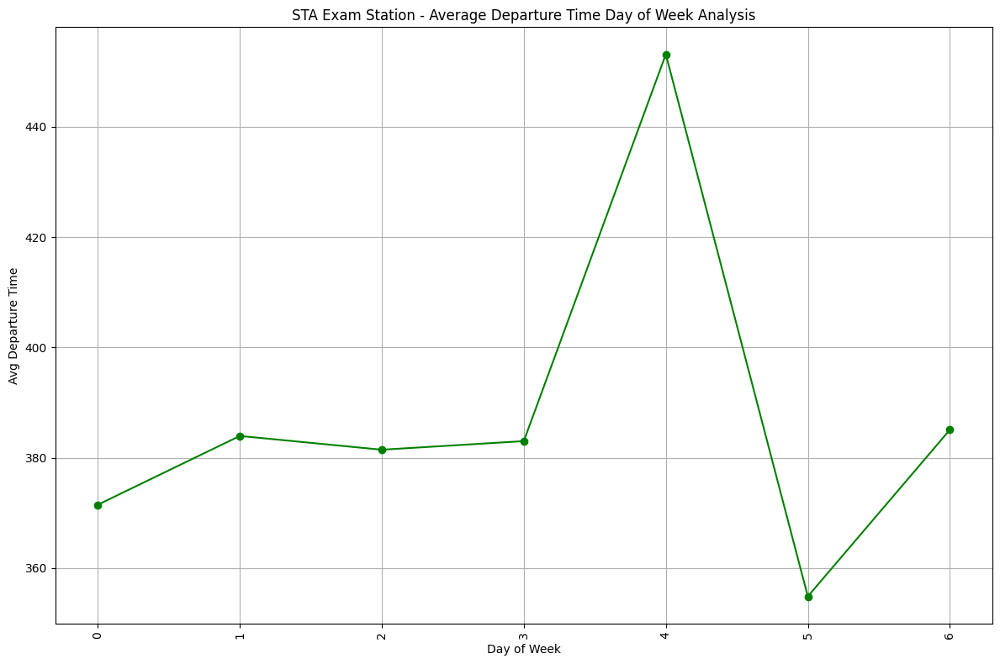

In [81]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Average Departure Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Departure Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

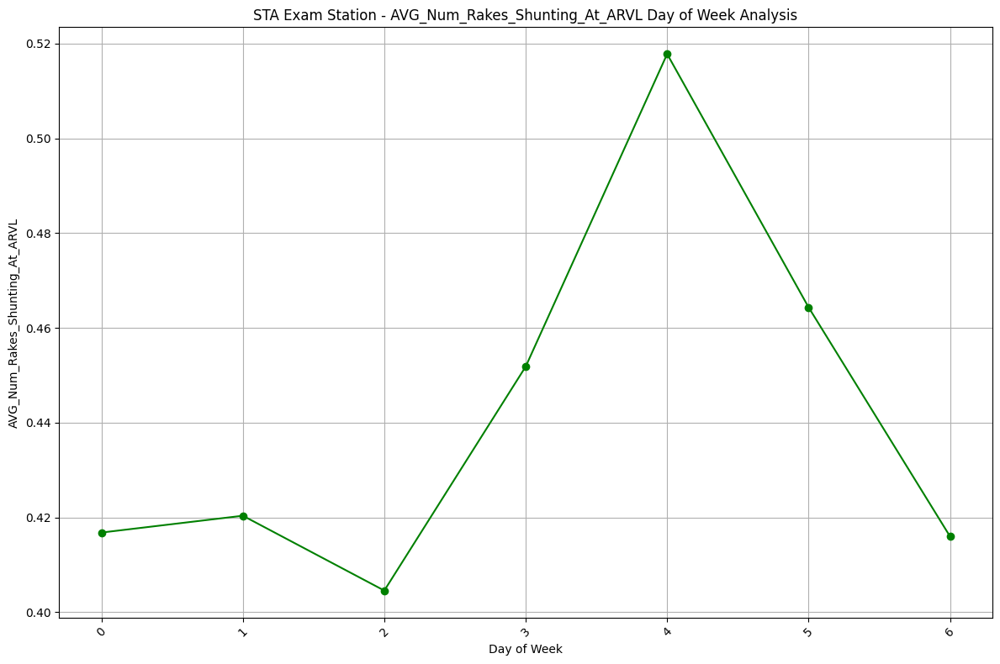

In [82]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

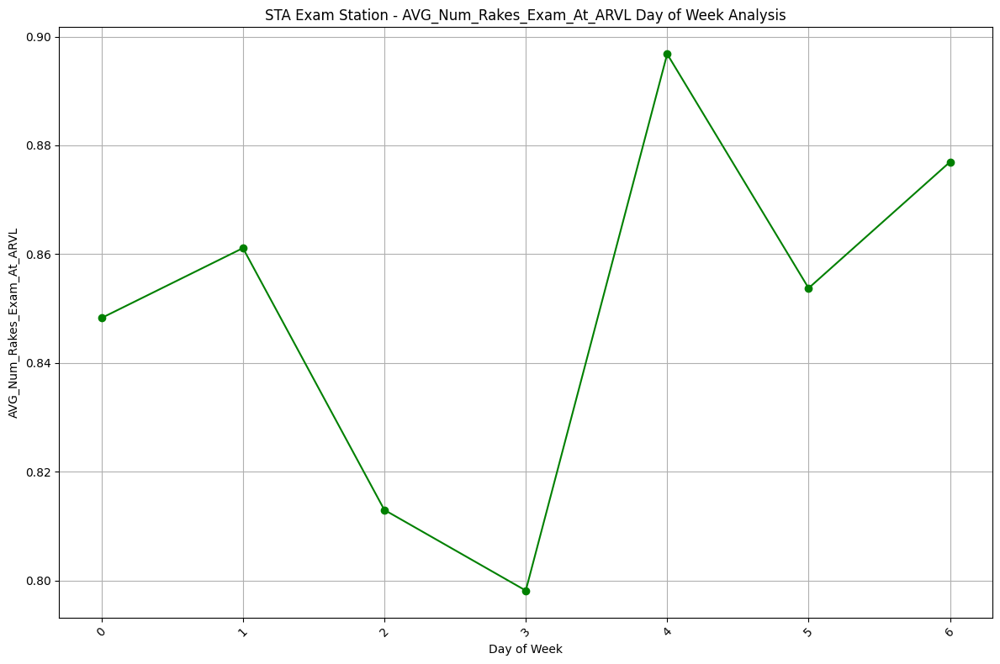

In [83]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Exam_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

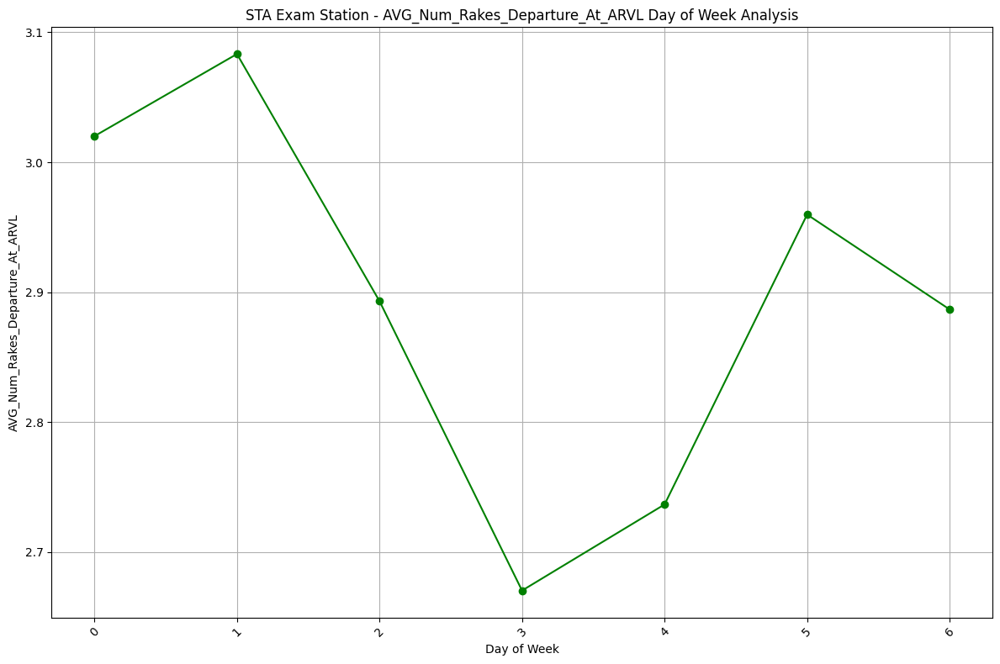

In [84]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Departure_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

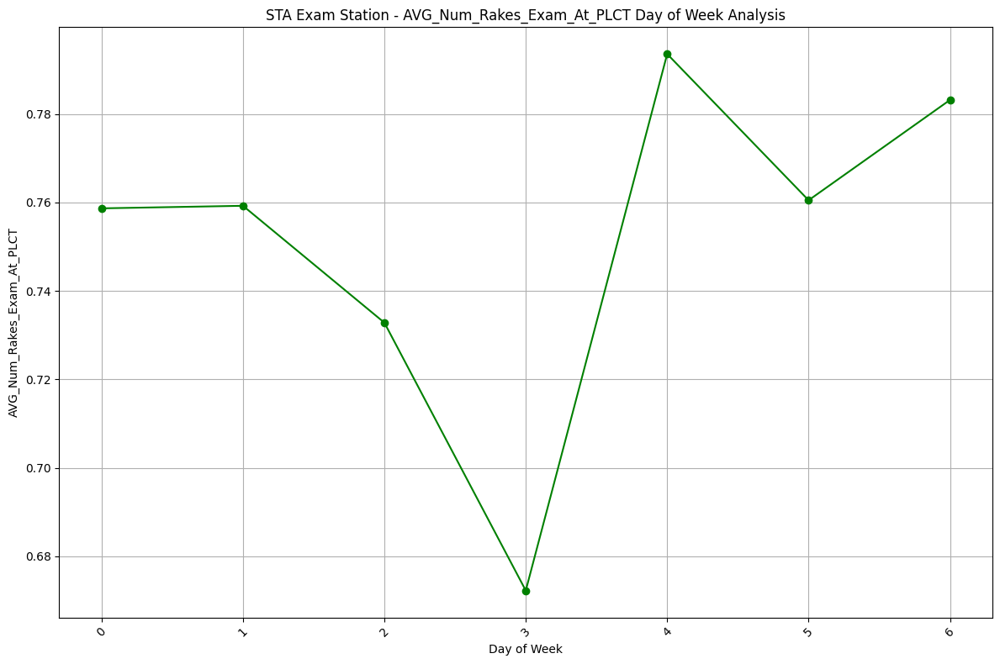

In [85]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Exam_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

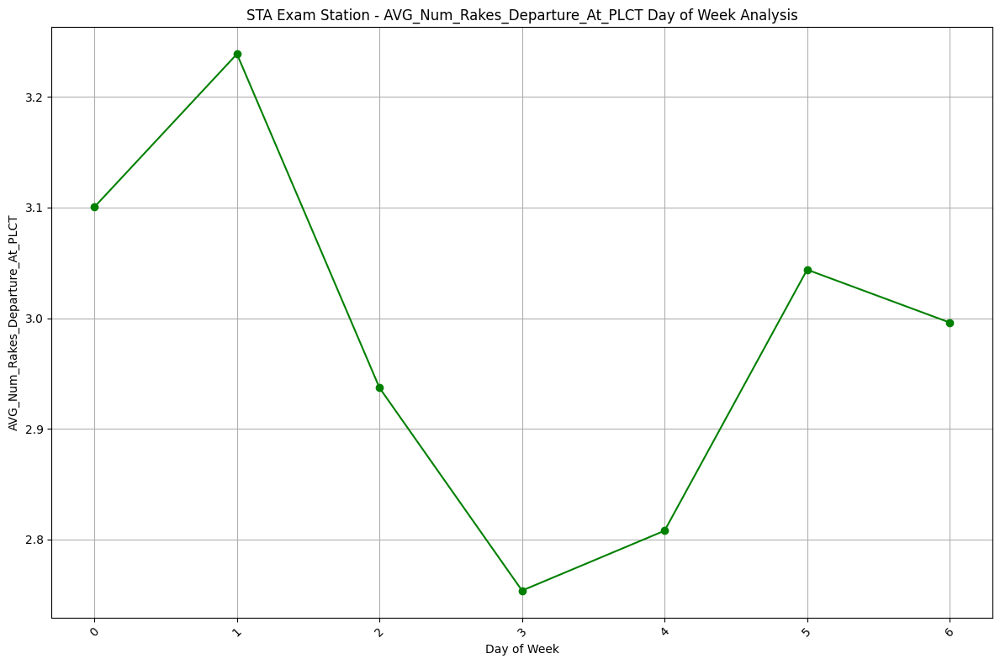

In [86]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Departure_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

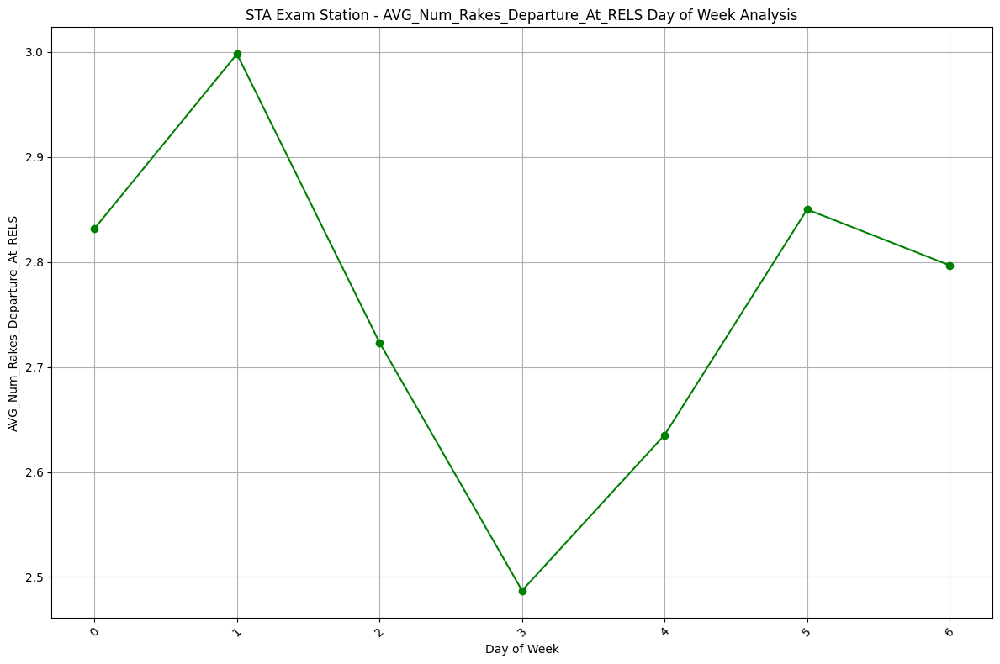

In [87]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Num_Rakes_Departure_At_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

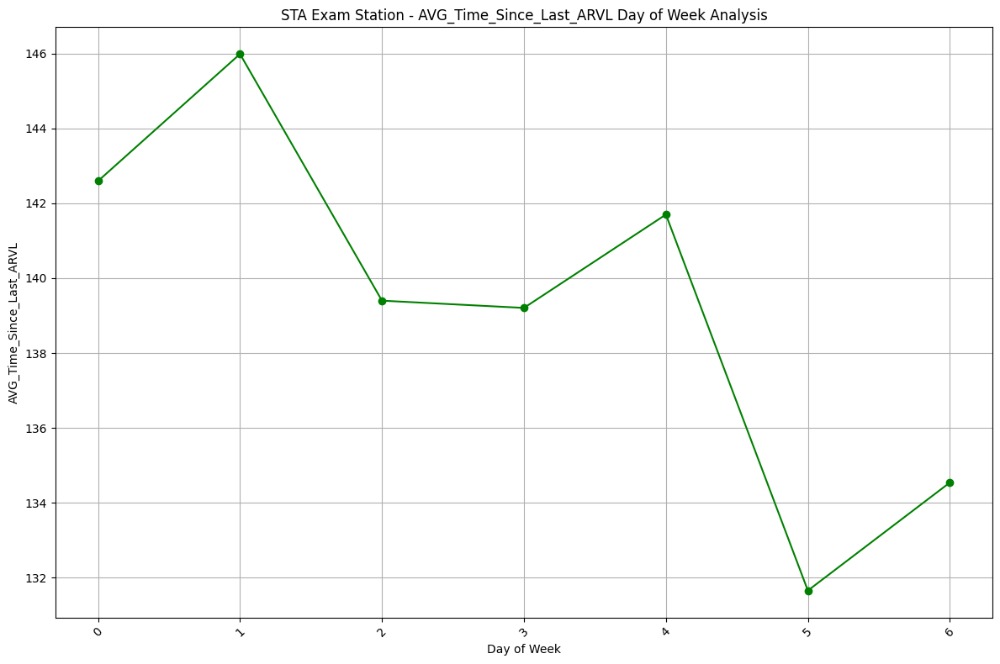

In [88]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Time_Since_Last_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

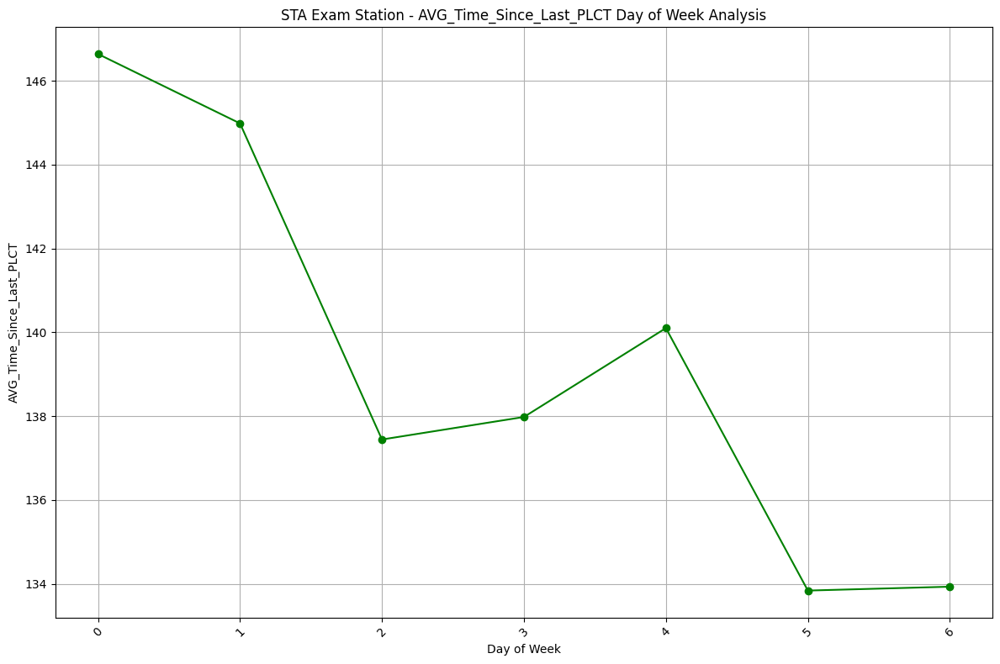

In [89]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Time_Since_Last_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

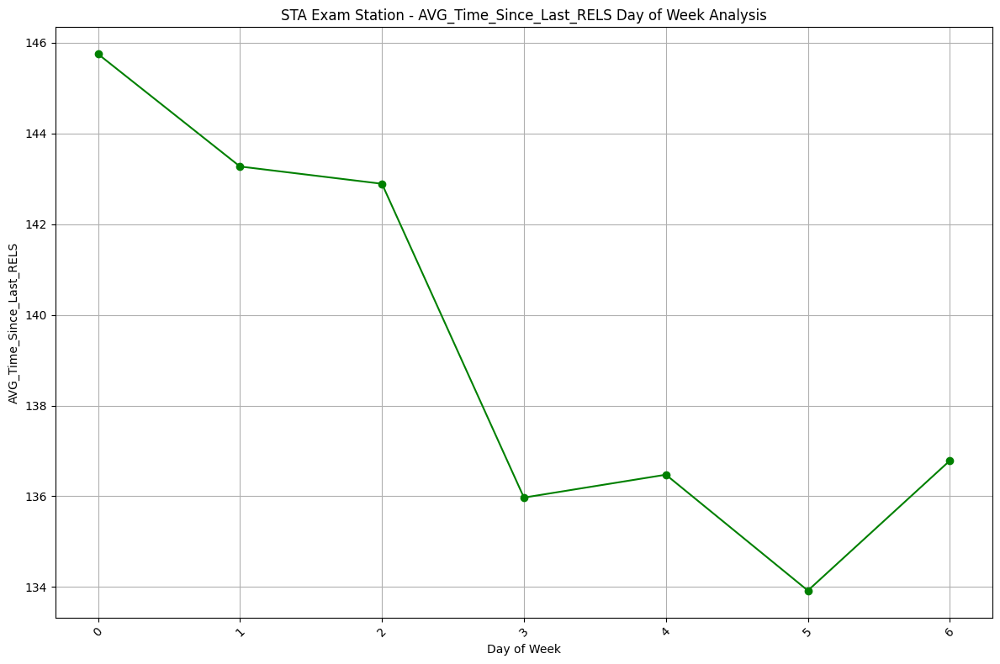

In [90]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Time_Since_Last_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

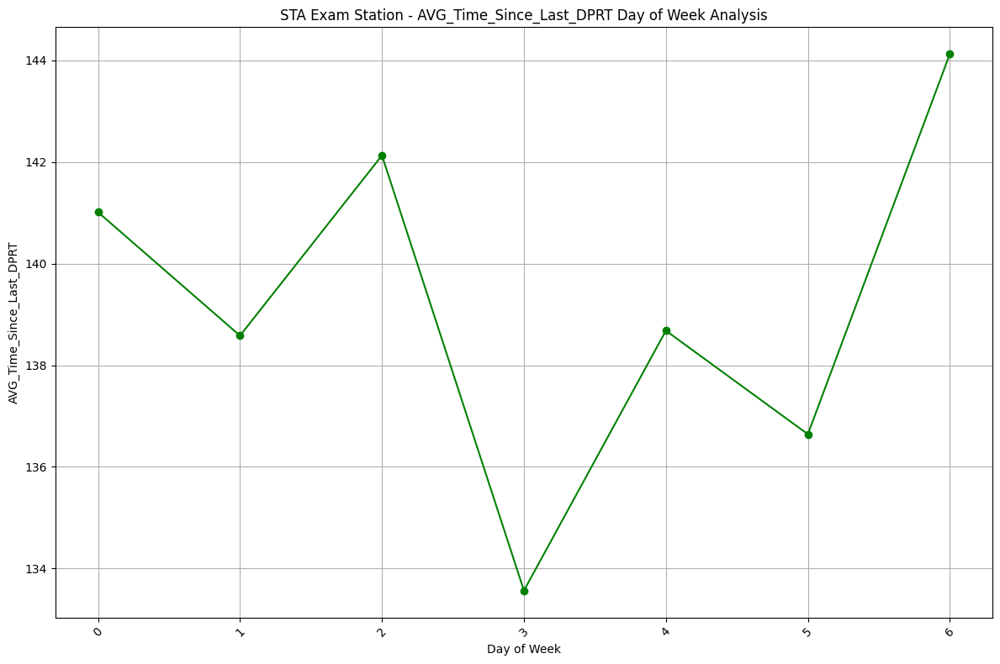

In [91]:
plt.figure(figsize=(12,8))
plt.plot(sta_weekend['R_DAYOFWEEK'], sta_weekend['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - AVG_Time_Since_Last_DPRT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Hourly Analysis

In [92]:
sta_arvl_h = sta.groupby('ARVL_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_arvl_h = pd.DataFrame(sta_arvl_h)
sta_plct_h = sta.groupby('PLCT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_plct_h = pd.DataFrame(sta_plct_h)
sta_rels_h = sta.groupby('RELS_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_rels_h = pd.DataFrame(sta_rels_h)
sta_dprt_h = sta.groupby('DPRT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
sta_dprt_h = pd.DataFrame(sta_dprt_h)

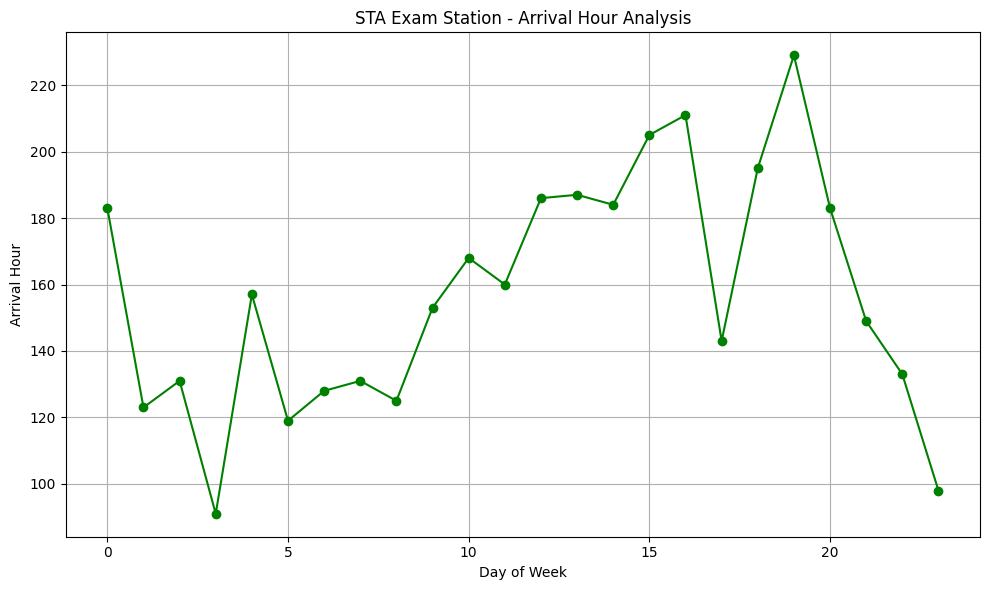

In [93]:
plt.figure(figsize=(10,6))
plt.plot(sta_arvl_h['ARVL_H'], sta_arvl_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Arrival Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Arrival Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

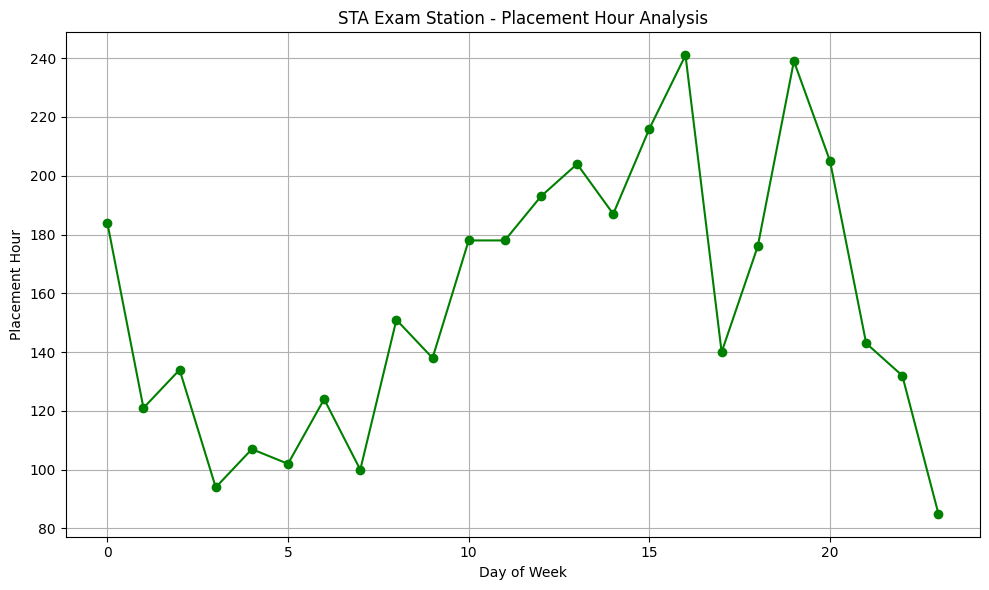

In [94]:
plt.figure(figsize=(10,6))
plt.plot(sta_plct_h['PLCT_H'], sta_plct_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Placement Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Placement Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

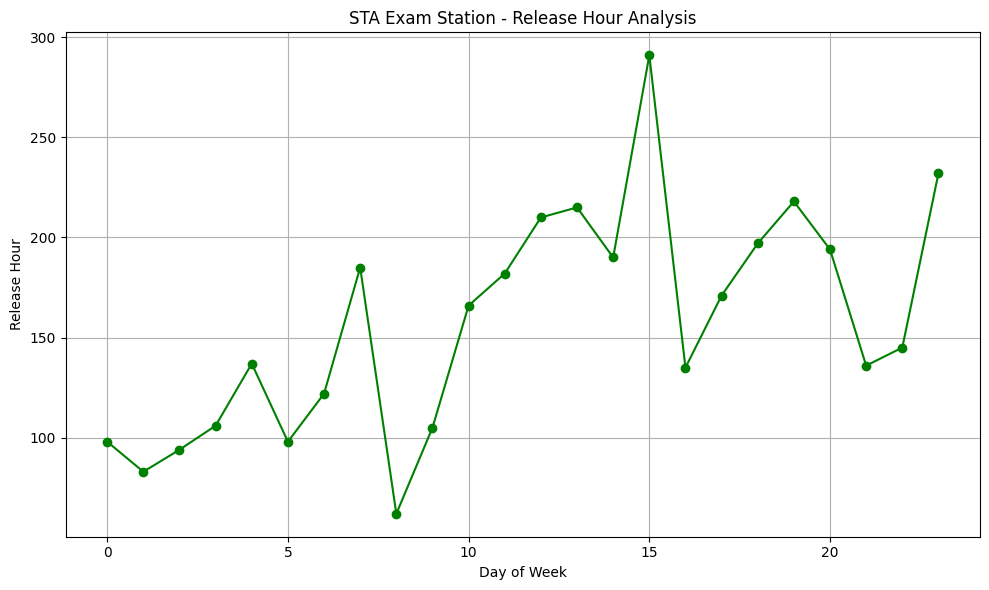

In [95]:
plt.figure(figsize=(10,6))
plt.plot(sta_rels_h['RELS_H'], sta_rels_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Release Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Release Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

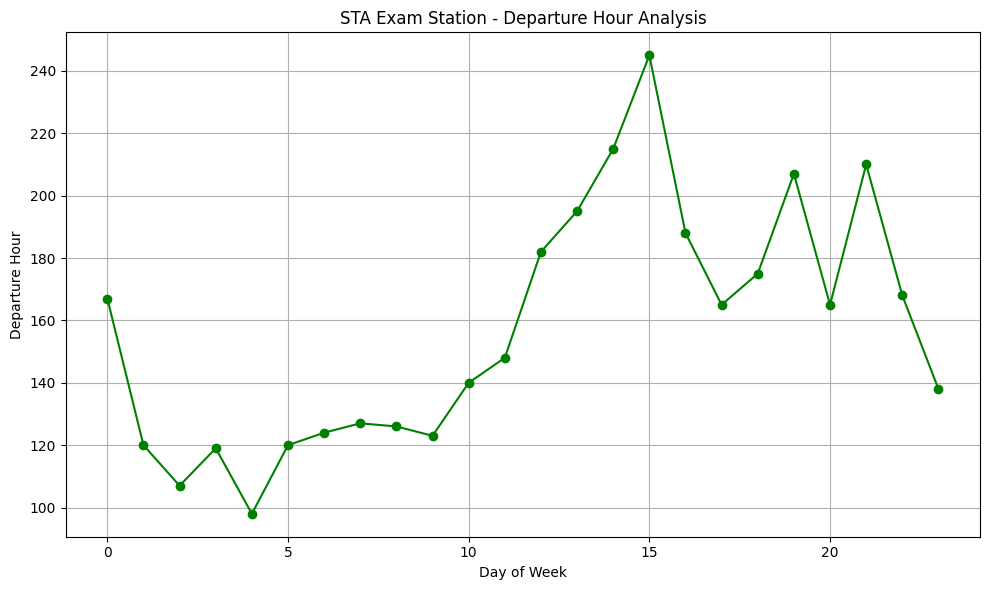

In [96]:
plt.figure(figsize=(10,6))
plt.plot(sta_dprt_h['DPRT_H'], sta_dprt_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('STA Exam Station - Departure Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Departure Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

In [97]:
corr_df = df1.copy()

In [98]:
corr_df['R_DATEOFMONTH'] = corr_df['R_DATEOFMONTH'].str.split('-').str[2].astype('int64')
corr_df['R_MONTH'] = corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
corr_df['R_WEEK'] = corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE'], axis=1, inplace=True)

In [99]:
corr = corr_df.corr()

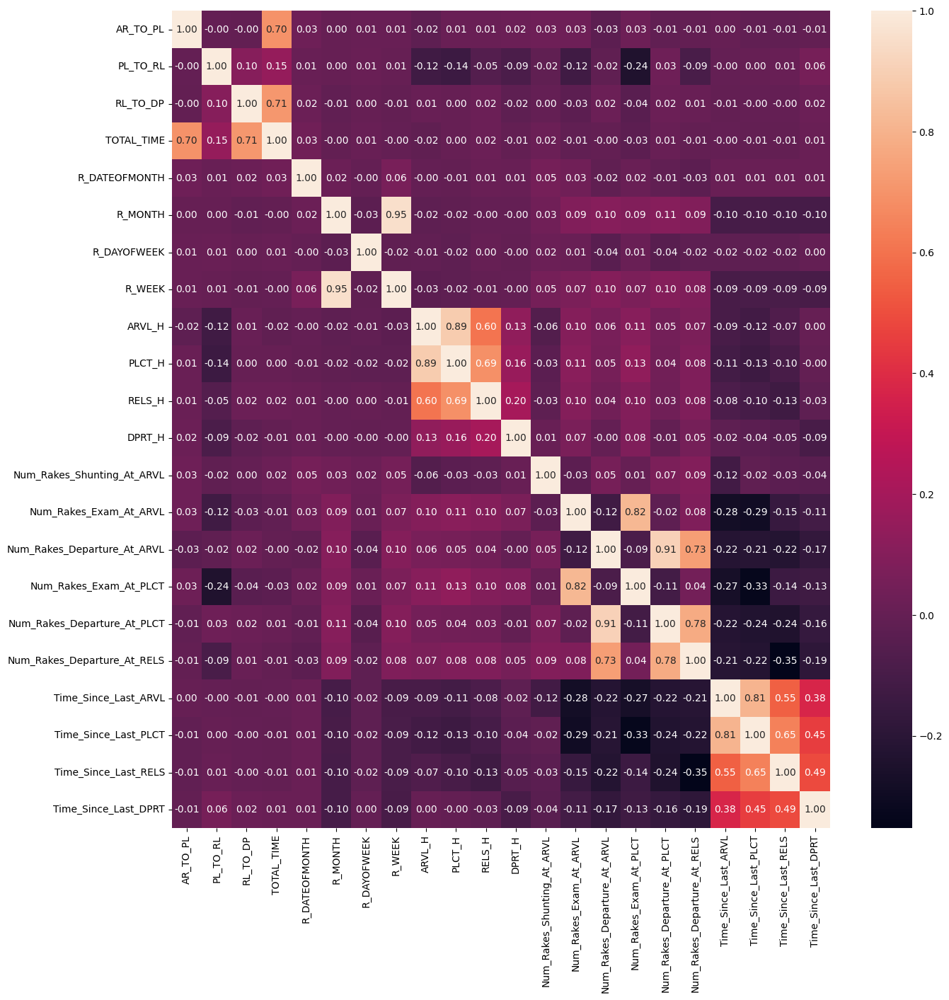

In [100]:
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

#### 10 new feature analysis

In [101]:
df1[['Num_Rakes_Shunting_At_ARVL','Num_Rakes_Exam_At_ARVL','Num_Rakes_Departure_At_ARVL','Num_Rakes_Exam_At_PLCT','Num_Rakes_Departure_At_PLCT','Num_Rakes_Departure_At_RELS','Time_Since_Last_ARVL','Time_Since_Last_PLCT','Time_Since_Last_RELS','Time_Since_Last_DPRT']].describe()

,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
count,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000,3772.000000
mean,0.442471,0.849947,2.892365,0.751591,2.981972,2.759809,139.338017,139.329268,139.284199,139.194592
std,0.676639,0.745368,1.456184,0.711731,1.470904,1.446325,165.781841,168.740455,165.668260,161.378393
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,2.000000,0.000000,2.000000,2.000000,33.000000,35.000000,35.000000,40.000000
50%,0.000000,1.000000,3.000000,1.000000,3.000000,3.000000,95.000000,95.000000,100.000000,95.000000
75%,1.000000,1.000000,4.000000,1.000000,4.000000,4.000000,195.000000,195.000000,195.000000,190.000000
max,5.000000,3.000000,9.000000,3.000000,9.000000,9.000000,3960.000000,3945.000000,3770.000000,3462.000000


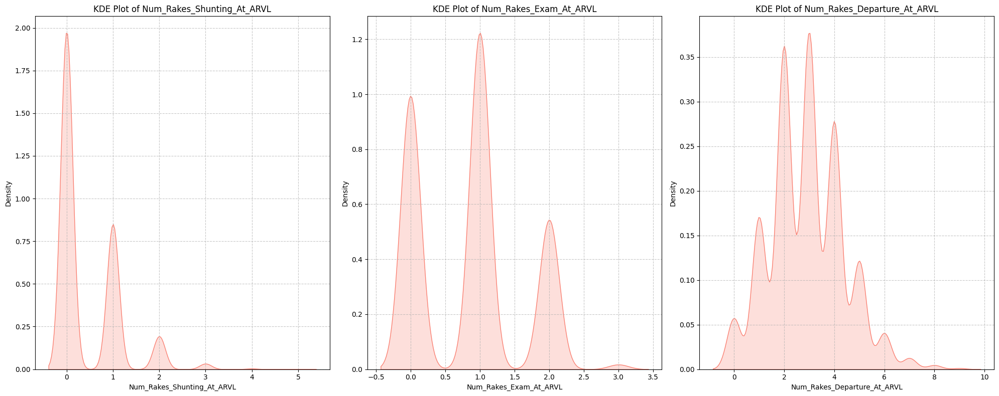

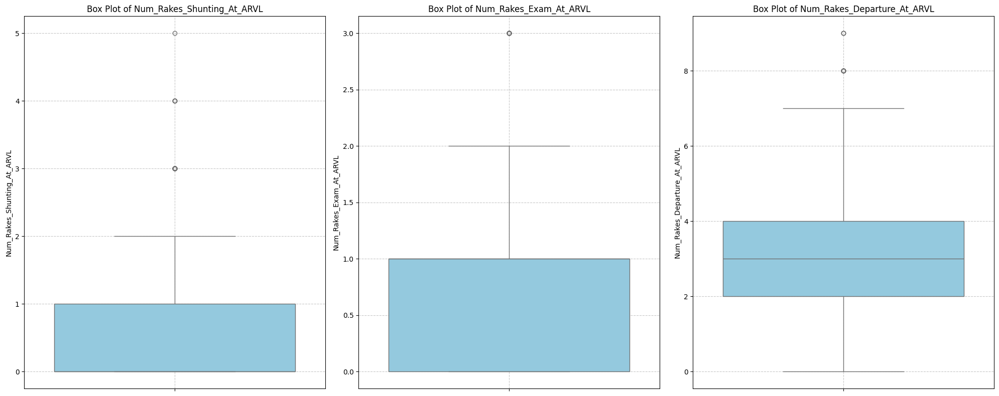

In [102]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Shunting_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Shunting_At_ARVL')
plt.xlabel('Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Exam_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_ARVL')
plt.xlabel('Num_Rakes_Exam_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_ARVL')
plt.xlabel('Num_Rakes_Departure_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Shunting_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Num_Rakes_Shunting_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Exam_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_ARVL')
plt.ylabel('Num_Rakes_Exam_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_ARVL')
plt.ylabel('Num_Rakes_Departure_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

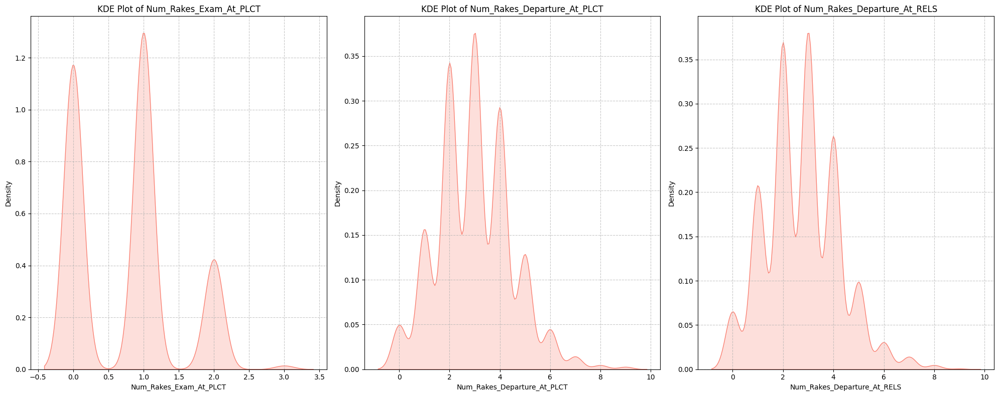

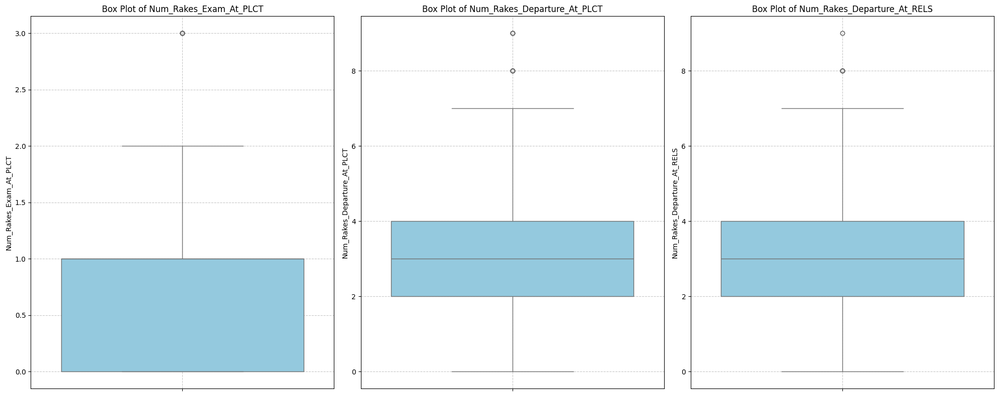

In [103]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Exam_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_PLCT')
plt.xlabel('Num_Rakes_Exam_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Departure_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_PLCT')
plt.xlabel('Num_Rakes_Departure_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_RELS')
plt.xlabel('Num_Rakes_Departure_At_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Exam_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_PLCT')
plt.ylabel('Num_Rakes_Exam_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Departure_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_PLCT')
plt.ylabel('Num_Rakes_Departure_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_RELS'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_RELS')
plt.ylabel('Num_Rakes_Departure_At_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

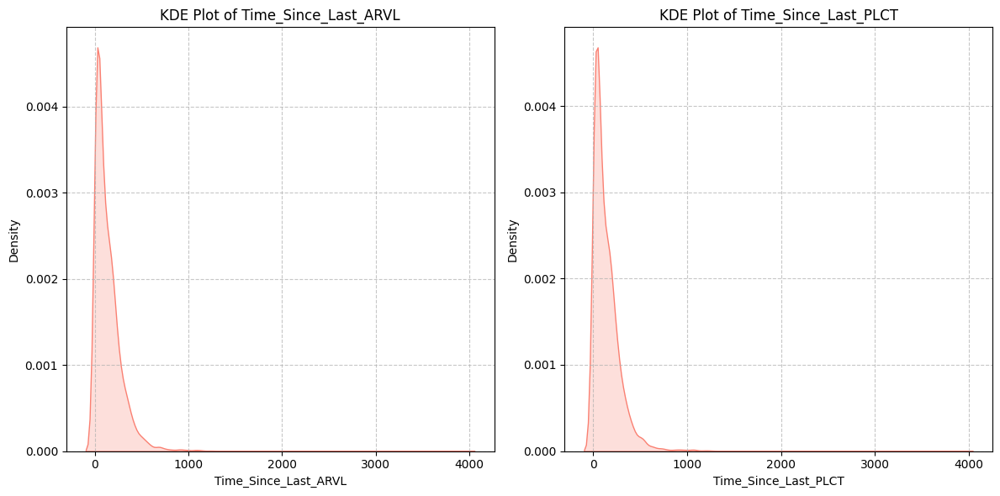

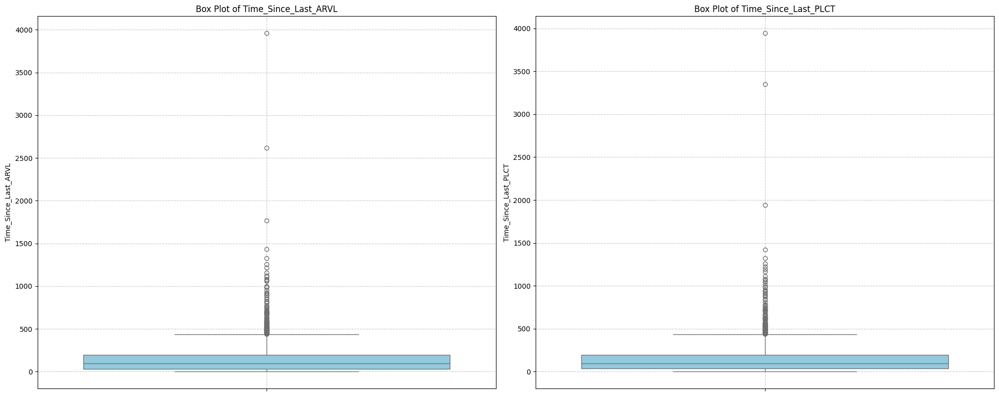

In [104]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_ARVL')
plt.xlabel('Time_Since_Last_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_PLCT')
plt.xlabel('Time_Since_Last_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_ARVL'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_ARVL')
plt.ylabel('Time_Since_Last_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_PLCT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_PLCT')
plt.ylabel('Time_Since_Last_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

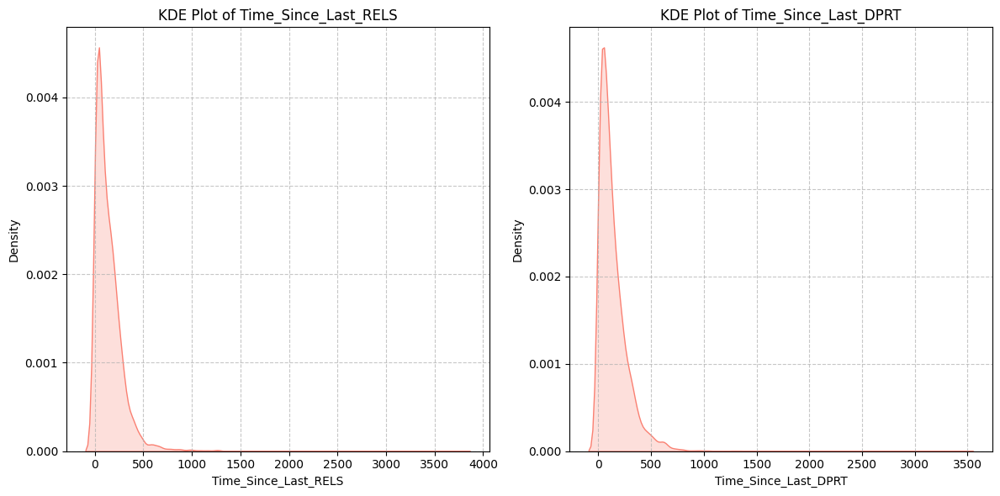

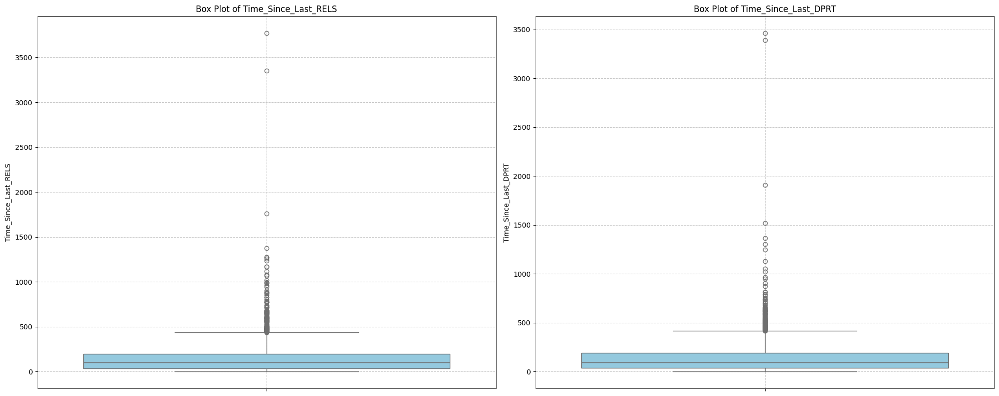

In [105]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_RELS')
plt.xlabel('Time_Since_Last_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_DPRT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_DPRT')
plt.xlabel('Time_Since_Last_DPRT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_RELS'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_RELS')
plt.ylabel('Time_Since_Last_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_DPRT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_DPRT')
plt.ylabel('Time_Since_Last_DPRT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Handling Outliers on the basis of EDA

#### outliers removal

In [106]:
sta_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,11,16.181818,79.545455,330.272727,0.181818,0.727273,2.727273,0.636364,3.000000,3.272727,90.181818,85.454545,76.818182,84.181818
1,2024-04-02,8,17.625000,175.625000,652.875000,0.125000,0.375000,4.125000,0.250000,4.125000,3.500000,218.500000,198.750000,190.000000,168.125000
2,2024-04-03,16,13.750000,47.812500,349.375000,0.562500,0.812500,3.812500,0.812500,3.687500,4.125000,97.500000,108.062500,111.187500,96.250000
3,2024-04-04,8,110.375000,138.750000,600.000000,0.375000,1.000000,2.750000,0.875000,3.125000,3.500000,152.375000,143.250000,165.125000,169.625000
4,2024-04-05,11,119.818182,125.909091,408.909091,0.818182,1.000000,3.272727,0.818182,3.363636,3.090909,77.636364,105.000000,90.454545,116.363636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,2025-03-27,11,75.727273,135.363636,246.181818,0.545455,0.636364,1.727273,0.545455,1.727273,1.181818,131.727273,144.090909,156.818182,125.000000
359,2025-03-28,18,51.388889,118.611111,244.277778,0.444444,1.333333,3.222222,1.222222,3.277778,3.277778,81.722222,83.333333,82.777778,82.500000
360,2025-03-29,15,10.000000,120.666667,429.000000,0.266667,1.000000,4.266667,0.800000,4.666667,4.066667,69.333333,81.333333,77.666667,100.733333
361,2025-03-30,11,18.727273,162.272727,387.545455,0.000000,1.090909,3.363636,0.818182,3.454545,3.454545,162.636364,144.545455,145.909091,117.000000


In [107]:
sta_daily.describe()

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
count,363,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000,363.000000
mean,2024-09-30 01:15:22.314049280,10.391185,57.790471,127.573104,392.444407,0.419952,0.779869,2.680807,0.683935,2.766501,2.553637,179.078200,181.064273,182.453613,183.632306
min,2024-04-01 00:00:00,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,49.888889,59.444444,53.928571,71.500000
25%,2024-06-30 12:00:00,8.000000,9.309524,101.250000,263.360902,0.055060,0.545455,2.090909,0.500000,2.142857,1.894444,107.562500,108.324176,108.500000,114.112179
50%,2024-10-01 00:00:00,11.000000,17.333333,123.750000,346.133333,0.222222,0.812500,2.800000,0.727273,2.900000,2.625000,135.384615,133.636364,131.875000,135.000000
75%,2024-12-30 12:00:00,13.000000,47.775000,154.333333,446.812500,0.583333,1.000000,3.333333,0.909091,3.458042,3.236111,175.812500,172.500000,172.638889,174.097222
max,2025-03-31 00:00:00,21.000000,5534.400000,567.500000,5707.933333,2.533333,2.000000,7.545455,2.000000,7.636364,7.727273,3960.000000,3945.000000,3770.000000,3390.000000
std,NaN,3.688287,299.415656,51.044444,339.438721,0.520702,0.363488,1.100958,0.335748,1.107647,1.069926,241.559342,248.705609,244.169830,228.548191


In [108]:
df1['R_DATEOFMONTH'] = pd.to_datetime(df1['R_DATEOFMONTH'], format='%Y-%m-%d')

In [109]:
merged_sta_df = pd.merge(df1, sta_daily[['R_DATEOFMONTH', 'AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME']], on='R_DATEOFMONTH', how='left')

In [110]:
shuntingavg_q1, shuntingavg_q3 = np.quantile(sta_daily['AVG_SHUNTING_TIME'], q=(0.25,0.75))

shuntingavg_lf = shuntingavg_q1 - 1.5*(shuntingavg_q3-shuntingavg_q1)
shuntingavg_hf = shuntingavg_q3 + 1.5*(shuntingavg_q3-shuntingavg_q1)

print(shuntingavg_lf, shuntingavg_hf)

shunting_q1, shunting_q3 = np.quantile(merged_sta_df['AR_TO_PL'], q=(0.25,0.75))

shunting_lf = shunting_q1 - 1.5*(shunting_q3-shunting_q1)
shunting_hf = shunting_q3 + 1.5*(shunting_q3-shunting_q1)

print(shunting_lf, shunting_hf)

-48.388690476190476 105.47321428571428
-30.0 50.0


In [111]:
shunting_outliers = merged_sta_df[(merged_sta_df['AVG_SHUNTING_TIME'] < shuntingavg_lf) & (merged_sta_df['AR_TO_PL'] < shunting_lf) | (merged_sta_df['AVG_SHUNTING_TIME'] > shuntingavg_hf) & (merged_sta_df['AR_TO_PL'] > shunting_hf)]

print(shunting_outliers.count())
shunting_outliers.head()

RDATE                          73
RAKETYPE                       73
EXAMSTTN                       73
ZONE                           73
AR_TO_PL                       73
PL_TO_RL                       73
RL_TO_DP                       73
TOTAL_TIME                     73
R_DATEOFMONTH                  73
R_MONTH                        73
R_DAYOFWEEK                    73
R_WEEK                         73
ARVL_H                         73
PLCT_H                         73
RELS_H                         73
DPRT_H                         73
Num_Rakes_Shunting_At_ARVL     73
Num_Rakes_Exam_At_ARVL         73
Num_Rakes_Departure_At_ARVL    73
Num_Rakes_Exam_At_PLCT         73
Num_Rakes_Departure_At_PLCT    73
Num_Rakes_Departure_At_RELS    73
Time_Since_Last_ARVL           73
Time_Since_Last_PLCT           73
Time_Since_Last_RELS           73
Time_Since_Last_DPRT           73
AVG_SHUNTING_TIME              73
AVG_EXAMINATION_TIME           73
AVG_DEPARTURE_TIME             73
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
23,2024-04-04,BCNHL,STA,WC,680,225,1610,2515,2024-04-04,2024-04,...,2,1,7,60.0,25.0,0.0,105.0,110.375000,138.750000,600.000000
30,2024-04-04,BCN,STA,WC,152,140,1011,1303,2024-04-04,2024-04,...,0,9,7,43.0,5.0,35.0,363.0,110.375000,138.750000,600.000000
42,2024-04-05,BCN,STA,WC,196,265,1492,1953,2024-04-05,2024-04,...,1,1,1,29.0,195.0,190.0,147.0,119.818182,125.909091,408.909091
44,2024-04-05,BCNHL,STA,WC,475,0,65,540,2024-04-05,2024-04,...,0,3,3,115.0,335.0,130.0,218.0,119.818182,125.909091,408.909091
51,2024-04-05,BCN,STA,WC,440,0,60,500,2024-04-05,2024-04,...,1,3,3,30.0,55.0,65.0,119.0,119.818182,125.909091,408.909091


In [112]:
examinationavg_q1, examinationavg_q3 = np.quantile(sta_daily['AVG_EXAMINATION_TIME'], q=(0.25,0.75))

examinationavg_lf = examinationavg_q1 - 1.5*(examinationavg_q3-examinationavg_q1)
examinationavg_hf = examinationavg_q3 + 1.5*(examinationavg_q3-examinationavg_q1)

print(examinationavg_lf, examinationavg_hf)

examination_q1, examination_q3 = np.quantile(merged_sta_df['PL_TO_RL'], q=(0.25,0.75))

examination_lf = examination_q1 - 1.5*(examination_q3-examination_q1)
examination_hf = examination_q3 + 1.5*(examination_q3-examination_q1)

print(examination_lf, examination_hf)

21.62500000000003 233.9583333333333
-360.0 600.0


In [113]:
examination_outliers = merged_sta_df[(merged_sta_df['AVG_EXAMINATION_TIME'] < examinationavg_lf) & (merged_sta_df['PL_TO_RL'] < examination_lf) | (merged_sta_df['AVG_EXAMINATION_TIME'] > examinationavg_hf) & (merged_sta_df['PL_TO_RL'] > examination_hf)]

print(examination_outliers.count())
examination_outliers.head()

RDATE                          2
RAKETYPE                       2
EXAMSTTN                       2
ZONE                           2
AR_TO_PL                       2
PL_TO_RL                       2
RL_TO_DP                       2
TOTAL_TIME                     2
R_DATEOFMONTH                  2
R_MONTH                        2
R_DAYOFWEEK                    2
R_WEEK                         2
ARVL_H                         2
PLCT_H                         2
RELS_H                         2
DPRT_H                         2
Num_Rakes_Shunting_At_ARVL     2
Num_Rakes_Exam_At_ARVL         2
Num_Rakes_Departure_At_ARVL    2
Num_Rakes_Exam_At_PLCT         2
Num_Rakes_Departure_At_PLCT    2
Num_Rakes_Departure_At_RELS    2
Time_Since_Last_ARVL           2
Time_Since_Last_PLCT           2
Time_Since_Last_RELS           2
Time_Since_Last_DPRT           2
AVG_SHUNTING_TIME              2
AVG_EXAMINATION_TIME           2
AVG_DEPARTURE_TIME             2
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
2845,2024-12-21,BCNHL,STA,WC,715,1115,61,1891,2024-12-21,2024-12,...,1,3,4,46.0,30.0,170.0,55.0,104.636364,240.0,430.181818
3252,2025-02-05,BCNHL,STA,WC,1975,5520,0,7495,2025-02-05,2025-02,...,0,2,1,210.0,60.0,115.0,25.0,226.750000,567.5,250.000000


In [114]:
departureavg_q1, departureavg_q3 = np.quantile(sta_daily['AVG_DEPARTURE_TIME'], q=(0.25,0.75))

departureavg_lf = departureavg_q1 - 1.5*(departureavg_q3-departureavg_q1)
departureavg_hf = departureavg_q3 + 1.5*(departureavg_q3-departureavg_q1)

print(departureavg_lf, departureavg_hf)

departure_q1, departure_q3 = np.quantile(merged_sta_df['RL_TO_DP'], q=(0.25,0.75))

departure_lf = departure_q1 - 1.5*(departure_q3-departure_q1)
departure_hf = departure_q3 + 1.5*(departure_q3-departure_q1)

print(departure_lf, departure_hf)

-11.816494360902311 721.9898966165414
-539.0 1133.0


In [115]:
departure_outliers = merged_sta_df[(merged_sta_df['AVG_DEPARTURE_TIME'] < departureavg_lf) & (merged_sta_df['RL_TO_DP'] < departure_lf) | (merged_sta_df['AVG_DEPARTURE_TIME'] > departureavg_hf) & (merged_sta_df['RL_TO_DP'] > departure_hf)]

print(departure_outliers.count())
departure_outliers.head()

RDATE                          25
RAKETYPE                       25
EXAMSTTN                       25
ZONE                           25
AR_TO_PL                       25
PL_TO_RL                       25
RL_TO_DP                       25
TOTAL_TIME                     25
R_DATEOFMONTH                  25
R_MONTH                        25
R_DAYOFWEEK                    25
R_WEEK                         25
ARVL_H                         25
PLCT_H                         25
RELS_H                         25
DPRT_H                         25
Num_Rakes_Shunting_At_ARVL     25
Num_Rakes_Exam_At_ARVL         25
Num_Rakes_Departure_At_ARVL    25
Num_Rakes_Exam_At_PLCT         25
Num_Rakes_Departure_At_PLCT    25
Num_Rakes_Departure_At_RELS    25
Time_Since_Last_ARVL           25
Time_Since_Last_PLCT           25
Time_Since_Last_RELS           25
Time_Since_Last_DPRT           25
AVG_SHUNTING_TIME              25
AVG_EXAMINATION_TIME           25
AVG_DEPARTURE_TIME             25
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
159,2024-04-15,BCN,STA,WC,20,170,1905,2095,2024-04-15,2024-04,...,0,3,3,315.0,335.0,425.0,80.0,39.000000,148.181818,786.636364
171,2024-04-15,BCNHL,STA,WC,25,385,1155,1565,2024-04-15,2024-04,...,0,5,5,225.0,250.0,5.0,257.0,39.000000,148.181818,786.636364
320,2024-05-02,BCNHL,STA,WC,580,410,4075,5065,2024-05-02,2024-05,...,0,3,4,155.0,300.0,20.0,90.0,102.769231,116.153846,771.846154
330,2024-05-01,BCN,STA,WC,20,345,2565,2930,2024-05-01,2024-05,...,1,5,4,65.0,75.0,185.0,135.0,123.600000,162.000000,755.600000
338,2024-05-02,BCN,STA,WC,17,155,1645,1817,2024-05-02,2024-05,...,0,5,5,409.0,405.0,240.0,145.0,102.769231,116.153846,771.846154


In [116]:
combined_outlier_df = pd.concat([shunting_outliers, examination_outliers, departure_outliers], ignore_index=True)
combined_outlier_df = combined_outlier_df.drop_duplicates(keep='first')
combined_outlier_df.count()

RDATE                          99
RAKETYPE                       99
EXAMSTTN                       99
ZONE                           99
AR_TO_PL                       99
PL_TO_RL                       99
RL_TO_DP                       99
TOTAL_TIME                     99
R_DATEOFMONTH                  99
R_MONTH                        99
R_DAYOFWEEK                    99
R_WEEK                         99
ARVL_H                         99
PLCT_H                         99
RELS_H                         99
DPRT_H                         99
Num_Rakes_Shunting_At_ARVL     99
Num_Rakes_Exam_At_ARVL         99
Num_Rakes_Departure_At_ARVL    99
Num_Rakes_Exam_At_PLCT         99
Num_Rakes_Departure_At_PLCT    99
Num_Rakes_Departure_At_RELS    99
Time_Since_Last_ARVL           99
Time_Since_Last_PLCT           99
Time_Since_Last_RELS           99
Time_Since_Last_DPRT           99
AVG_SHUNTING_TIME              99
AVG_EXAMINATION_TIME           99
AVG_DEPARTURE_TIME             99
dtype: int64

In [117]:
combined_outlier_df.drop(columns=['AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME'], axis=1, inplace=True)
combined_outlier_df.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-04,BCNHL,STA,WC,680,225,1610,2515,2024-04-04,2024-04,...,0,0,4,2,1,7,60.0,25.0,0.0,105.0
1,2024-04-04,BCN,STA,WC,152,140,1011,1303,2024-04-04,2024-04,...,0,3,2,0,9,7,43.0,5.0,35.0,363.0
2,2024-04-05,BCN,STA,WC,196,265,1492,1953,2024-04-05,2024-04,...,1,1,2,1,1,1,29.0,195.0,190.0,147.0
3,2024-04-05,BCNHL,STA,WC,475,0,65,540,2024-04-05,2024-04,...,0,1,2,0,3,3,115.0,335.0,130.0,218.0
4,2024-04-05,BCN,STA,WC,440,0,60,500,2024-04-05,2024-04,...,0,1,4,1,3,3,30.0,55.0,65.0,119.0


In [118]:
sta_updated1 = df1.copy()

In [119]:
merged_for_removal = pd.merge(sta_updated1, combined_outlier_df, on=list(sta_updated1.columns), how='left', indicator=True)

sta_updated1 = merged_for_removal[merged_for_removal['_merge'] == 'left_only']
sta_updated1 = sta_updated1.drop(columns='_merge')

sta_updated1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BCNHL,STA,WC,33,205,645,883,2024-04-01,2024-04,...,0,0,0,0,0,0,0.0,0.0,0.0,20.0
1,2024-04-02,BCNHL,STA,WC,30,290,1609,1929,2024-04-02,2024-04,...,0,1,0,0,1,1,223.0,220.0,305.0,444.0
2,2024-04-01,BCNHL,STA,WC,50,300,545,895,2024-04-01,2024-04,...,0,1,1,1,1,2,50.0,70.0,80.0,13.0
3,2024-04-01,BCN,STA,WC,0,0,139,139,2024-04-01,2024-04,...,0,0,3,0,3,3,370.0,320.0,20.0,0.0
4,2024-04-01,BCN,STA,WC,0,0,10,10,2024-04-01,2024-04,...,0,0,3,0,3,3,210.0,210.0,210.0,81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3767,2025-03-31,BCNAHSM1,STA,WC,0,0,5,5,2025-03-31,2025-03,...,0,2,1,2,1,1,110.0,105.0,115.0,194.0
3768,2025-03-31,BCNAHSM1,STA,WC,10,215,195,420,2025-03-31,2025-03,...,0,1,2,1,2,2,15.0,25.0,75.0,45.0
3769,2025-03-31,BCN,STA,WC,25,275,206,506,2025-03-31,2025-03,...,0,2,1,1,2,2,140.0,155.0,35.0,103.0
3770,2025-03-31,BCN,STA,WC,0,0,30,30,2025-03-31,2025-03,...,0,1,3,1,3,3,205.0,180.0,120.0,10.0


#### graphs and analysis

In [120]:
updated_corr_df = sta_updated1.copy()

In [121]:
updated_corr_df['R_DATEOFMONTH'] = updated_corr_df['R_DATEOFMONTH'].dt.day
updated_corr_df['R_MONTH'] = updated_corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df['R_WEEK'] = updated_corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE','R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H'], axis=1, inplace=True)

In [122]:
updated_corr = updated_corr_df.corr()

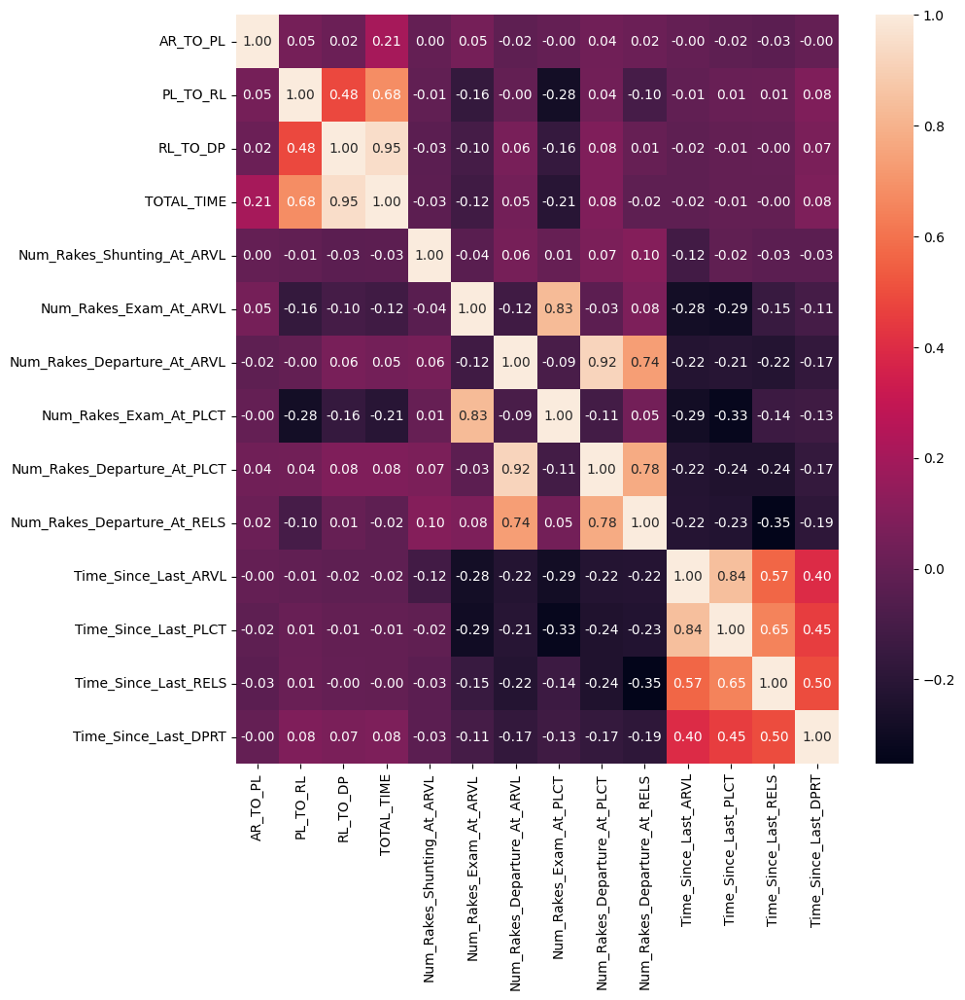

In [123]:
plt.figure(figsize=(10,10))
sns.heatmap(updated_corr, annot=True, fmt=".2f")
plt.show()

In [124]:
updated_corr_df1 = sta_updated1.copy()

In [125]:
updated_corr_df1['R_DATEOFMONTH'] = updated_corr_df1['R_DATEOFMONTH'].dt.day
updated_corr_df1['R_MONTH'] = updated_corr_df1['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df1['R_WEEK'] = updated_corr_df1['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr1 = updated_corr_df1[['R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H']].corr()

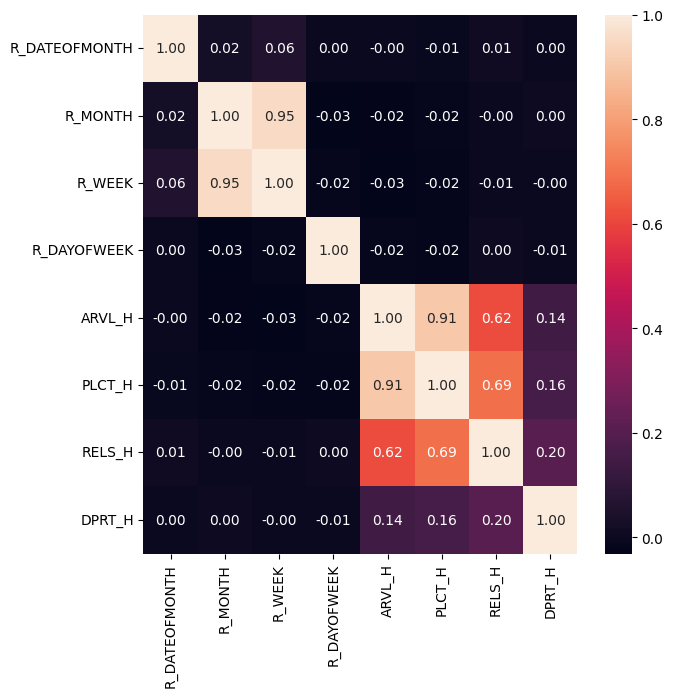

In [126]:
plt.figure(figsize=(7,7))
sns.heatmap(updated_corr1, annot=True, fmt=".2f")
plt.show()

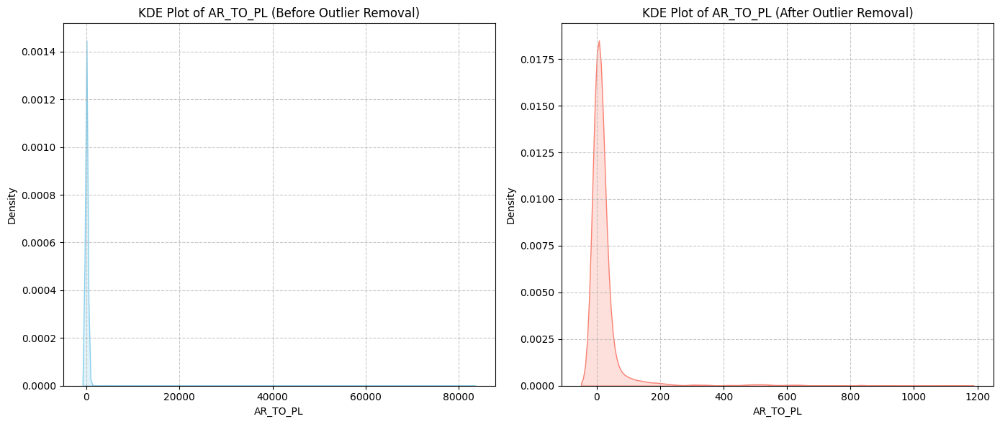

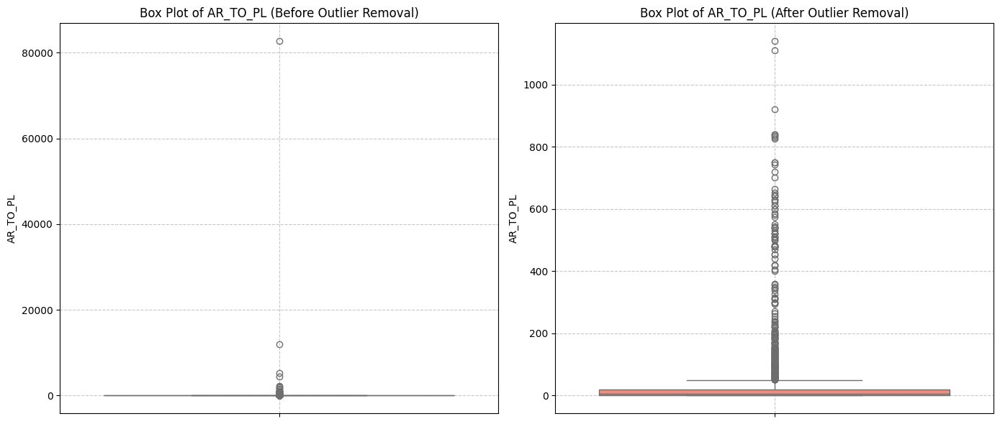

In [127]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(sta['AR_TO_PL'], fill=True, color='skyblue')
plt.title('KDE Plot of AR_TO_PL (Before Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(sta_updated1['AR_TO_PL'], fill=True, color='salmon')
plt.title('KDE Plot of AR_TO_PL (After Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=sta['AR_TO_PL'], color='skyblue')
plt.title('Box Plot of AR_TO_PL (Before Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=sta_updated1['AR_TO_PL'], color='salmon')
plt.title('Box Plot of AR_TO_PL (After Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

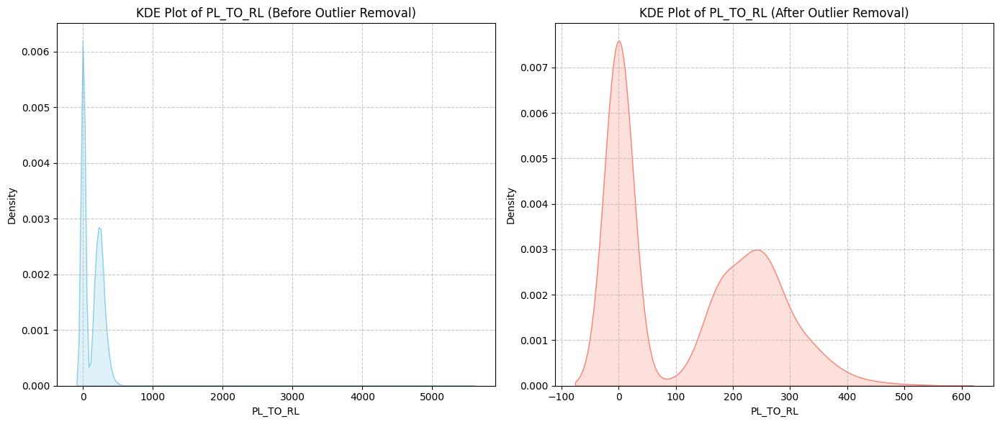

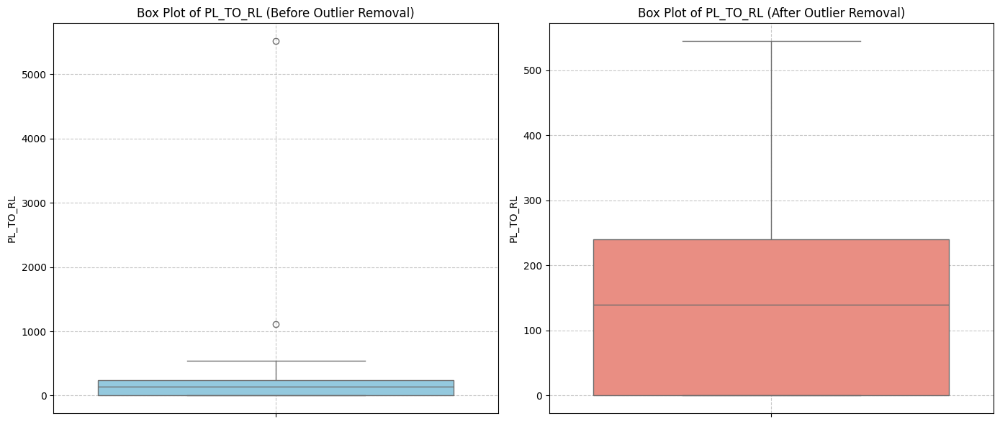

In [128]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(sta['PL_TO_RL'], fill=True, color='skyblue')
plt.title('KDE Plot of PL_TO_RL (Before Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(sta_updated1['PL_TO_RL'], fill=True, color='salmon')
plt.title('KDE Plot of PL_TO_RL (After Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=sta['PL_TO_RL'], color='skyblue')
plt.title('Box Plot of PL_TO_RL (Before Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=sta_updated1['PL_TO_RL'], color='salmon')
plt.title('Box Plot of PL_TO_RL (After Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

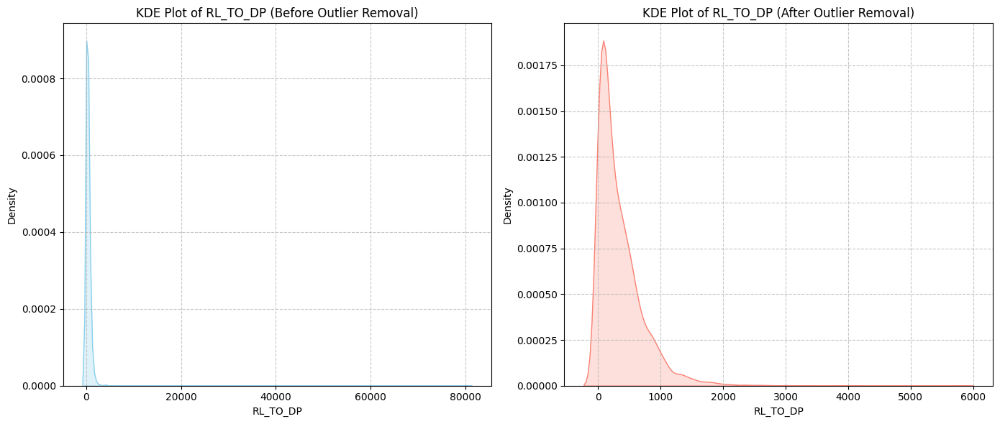

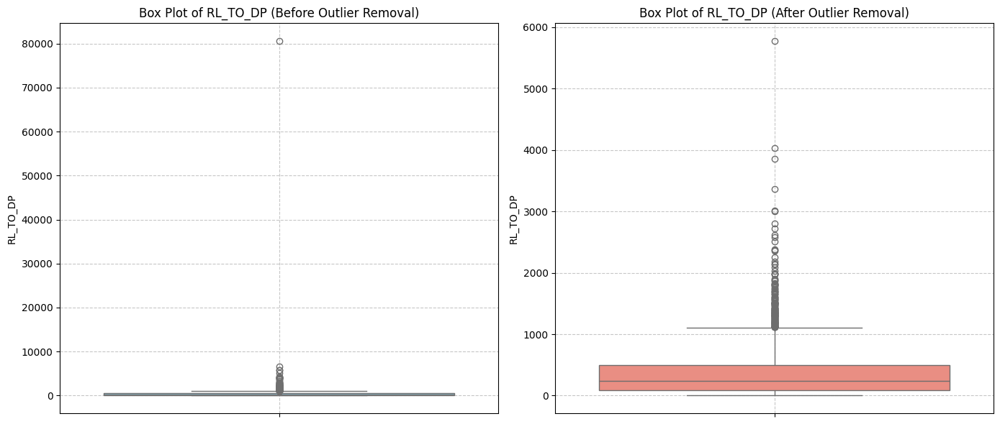

In [129]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(sta['RL_TO_DP'], fill=True, color='skyblue')
plt.title('KDE Plot of RL_TO_DP (Before Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(sta_updated1['RL_TO_DP'], fill=True, color='salmon')
plt.title('KDE Plot of RL_TO_DP (After Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=sta['RL_TO_DP'], color='skyblue')
plt.title('Box Plot of RL_TO_DP (Before Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=sta_updated1['RL_TO_DP'], color='salmon')
plt.title('Box Plot of RL_TO_DP (After Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Implementing Cyclic features

In [130]:
sta_updated2 = sta_updated1.copy()

In [131]:
sta_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BCNHL,STA,WC,33,205,645,883,2024-04-01,2024-04,...,0,0,0,0,0,0,0.0,0.0,0.0,20.0
1,2024-04-02,BCNHL,STA,WC,30,290,1609,1929,2024-04-02,2024-04,...,0,1,0,0,1,1,223.0,220.0,305.0,444.0
2,2024-04-01,BCNHL,STA,WC,50,300,545,895,2024-04-01,2024-04,...,0,1,1,1,1,2,50.0,70.0,80.0,13.0
3,2024-04-01,BCN,STA,WC,0,0,139,139,2024-04-01,2024-04,...,0,0,3,0,3,3,370.0,320.0,20.0,0.0
4,2024-04-01,BCN,STA,WC,0,0,10,10,2024-04-01,2024-04,...,0,0,3,0,3,3,210.0,210.0,210.0,81.0


In [132]:
sta_updated2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3673 entries, 0 to 3771
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        3673 non-null   object        
 1   RAKETYPE                     3673 non-null   object        
 2   EXAMSTTN                     3673 non-null   object        
 3   ZONE                         3673 non-null   object        
 4   AR_TO_PL                     3673 non-null   int64         
 5   PL_TO_RL                     3673 non-null   int64         
 6   RL_TO_DP                     3673 non-null   int64         
 7   TOTAL_TIME                   3673 non-null   int64         
 8   R_DATEOFMONTH                3673 non-null   datetime64[ns]
 9   R_MONTH                      3673 non-null   object        
 10  R_DAYOFWEEK                  3673 non-null   int64         
 11  R_WEEK                       3673 non-null   obj

In [133]:
sta_updated2['R_MONTH'] = sta_updated2['R_MONTH'].str.split('-').str[1].astype('int64')
sta_updated2['R_DATEOFMONTH'] = sta_updated2['R_DATEOFMONTH'].dt.day
sta_updated2['R_WEEK'] = sta_updated2['R_WEEK'].str.split('-').str[1].astype('int64')


sta_updated2['R_MONTH_sin'] = np.sin(2 * np.pi * sta_updated2['R_MONTH'] / 12)
sta_updated2['R_MONTH_cos'] = np.cos(2 * np.pi * sta_updated2['R_MONTH'] / 12)

sta_updated2['R_DAYOFWEEK_sin'] = np.sin(2 * np.pi * sta_updated2['R_DAYOFWEEK'] / 7)
sta_updated2['R_DAYOFWEEK_cos'] = np.cos(2 * np.pi * sta_updated2['R_DAYOFWEEK'] / 7)

sta_updated2['R_WEEK_sin'] = np.sin(2 * np.pi * sta_updated2['R_WEEK'] / 52)
sta_updated2['R_WEEK_cos'] = np.cos(2 * np.pi * sta_updated2['R_WEEK'] / 52)

sta_updated2['ARVL_H_sin'] = np.sin(2 * np.pi * sta_updated2['ARVL_H'] / 24)
sta_updated2['ARVL_H_cos'] = np.cos(2 * np.pi * sta_updated2['ARVL_H'] / 24)


sta_updated2.drop(columns=['R_MONTH', 'R_DAYOFWEEK', 'R_WEEK', 'ARVL_H', 'PLCT_H', 'RELS_H', 'DPRT_H'], axis=1, inplace=True)

sta_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,...,Time_Since_Last_RELS,Time_Since_Last_DPRT,R_MONTH_sin,R_MONTH_cos,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos
0,2024-04-01,BCNHL,STA,WC,33,205,645,883,1,0,...,0.0,20.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,-0.965926,2.588190e-01
1,2024-04-02,BCNHL,STA,WC,30,290,1609,1929,2,0,...,305.0,444.0,0.866025,-0.5,0.781831,0.62349,0.992709,-0.120537,-0.258819,9.659258e-01
2,2024-04-01,BCNHL,STA,WC,50,300,545,895,1,0,...,80.0,13.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,-0.258819,9.659258e-01
3,2024-04-01,BCN,STA,WC,0,0,139,139,1,0,...,20.0,0.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,1.000000,6.123234e-17
4,2024-04-01,BCN,STA,WC,0,0,10,10,1,0,...,210.0,81.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,0.707107,-7.071068e-01


### One Hot Encoding

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
categorical_cols = ['RAKETYPE']

In [136]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(sta_updated2[categorical_cols])

In [137]:
encoded_col_names = encoder.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_features, columns=encoded_col_names, index=sta_updated2.index)

In [138]:
sta_updated3 = pd.concat([sta_updated2, encoded_df], axis=1)
sta_updated3 = sta_updated3.drop(columns=categorical_cols)

In [139]:
sta_updated3.drop(columns=['RDATE', 'EXAMSTTN','ZONE','TOTAL_TIME'], axis=1, inplace=True)

In [140]:
sta_updated3

,AR_TO_PL,PL_TO_RL,RL_TO_DP,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,...,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos,RAKETYPE_BCFCM,RAKETYPE_BCN,RAKETYPE_BCNAHSM1,RAKETYPE_BCNHL,RAKETYPE_BLC,RAKETYPE_BOXN
0,33,205,645,1,0,0,0,0,0,0,...,0.992709,-0.120537,-9.659258e-01,2.588190e-01,0.0,0.0,0.0,1.0,0.0,0.0
1,30,290,1609,2,0,1,0,0,1,1,...,0.992709,-0.120537,-2.588190e-01,9.659258e-01,0.0,0.0,0.0,1.0,0.0,0.0
2,50,300,545,1,0,1,1,1,1,2,...,0.992709,-0.120537,-2.588190e-01,9.659258e-01,0.0,0.0,0.0,1.0,0.0,0.0
3,0,0,139,1,0,0,3,0,3,3,...,0.992709,-0.120537,1.000000e+00,6.123234e-17,0.0,1.0,0.0,0.0,0.0,0.0
4,0,0,10,1,0,0,3,0,3,3,...,0.992709,-0.120537,7.071068e-01,-7.071068e-01,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3767,0,0,5,31,0,2,1,2,1,1,...,0.992709,-0.120537,1.224647e-16,-1.000000e+00,0.0,0.0,1.0,0.0,0.0,0.0
3768,10,215,195,31,0,1,2,1,2,2,...,0.992709,-0.120537,1.224647e-16,-1.000000e+00,0.0,0.0,1.0,0.0,0.0,0.0
3769,25,275,206,31,0,2,1,1,2,2,...,0.992709,-0.120537,-5.000000e-01,-8.660254e-01,0.0,1.0,0.0,0.0,0.0,0.0
3770,0,0,30,31,0,1,3,1,3,3,...,0.992709,-0.120537,-1.000000e+00,-1.836970e-16,0.0,1.0,0.0,0.0,0.0,0.0


In [141]:
sta_updated3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3673 entries, 0 to 3771
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     3673 non-null   int64  
 1   PL_TO_RL                     3673 non-null   int64  
 2   RL_TO_DP                     3673 non-null   int64  
 3   R_DATEOFMONTH                3673 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   3673 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       3673 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  3673 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       3673 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  3673 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  3673 non-null   int64  
 10  Time_Since_Last_ARVL         3673 non-null   float64
 11  Time_Since_Last_PLCT         3673 non-null   float64
 12  Time_Since_Last_RELS         3673 non-null   float64
 13  Time_Since_Last_DPRT   

### Each time frame count analysis

In [142]:
shunting_time_count = sta_updated3['AR_TO_PL'].value_counts().reset_index()
shunting_time_count.columns = ['AR_TO_PL','RAKE_COUNT']

shunting_time_count = shunting_time_count.sort_values(by='AR_TO_PL').reset_index(drop=True)
shunting_time_count.head(30)

,AR_TO_PL,RAKE_COUNT
0,0,1756
1,1,14
2,2,4
3,3,7
4,4,8
5,5,145
6,6,2
7,7,4
8,8,8
9,9,2


In [143]:
exam_time_count = sta_updated3['PL_TO_RL'].value_counts().reset_index()
exam_time_count.columns = ['PL_TO_RL','RAKE_COUNT']

exam_time_count = exam_time_count.sort_values(by='PL_TO_RL').reset_index(drop=True)
exam_time_count.head(30)

,PL_TO_RL,RAKE_COUNT
0,0,1753
1,1,1
2,5,7
3,15,6
4,20,1
5,25,4
6,28,1
7,30,1
8,35,1
9,45,3


In [144]:
departure_time_count = sta_updated3['RL_TO_DP'].value_counts().reset_index()
departure_time_count.columns = ['RL_TO_DP','RAKE_COUNT']

departure_time_count = departure_time_count.sort_values(by='RL_TO_DP').reset_index(drop=True)
departure_time_count.head(30)

,RL_TO_DP,RAKE_COUNT
0,0,86
1,1,70
2,2,6
3,3,2
4,4,4
5,5,122
6,6,6
7,7,3
8,8,1
9,9,6


# Model Selections Part - single stage (old)

### Preparing columns

In [145]:
sta_final = sta_updated3.copy()

In [146]:
sta_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3673 entries, 0 to 3771
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     3673 non-null   int64  
 1   PL_TO_RL                     3673 non-null   int64  
 2   RL_TO_DP                     3673 non-null   int64  
 3   R_DATEOFMONTH                3673 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   3673 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       3673 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  3673 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       3673 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  3673 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  3673 non-null   int64  
 10  Time_Since_Last_ARVL         3673 non-null   float64
 11  Time_Since_Last_PLCT         3673 non-null   float64
 12  Time_Since_Last_RELS         3673 non-null   float64
 13  Time_Since_Last_DPRT   

In [147]:
target_cols = ['AR_TO_PL', 'PL_TO_RL', 'RL_TO_DP']

base_features = [col for col in sta_final.columns if col not in target_cols]

X = sta_final[base_features]
y = sta_final[target_cols]

In [148]:
base_features

['R_DATEOFMONTH',
 'Num_Rakes_Shunting_At_ARVL',
 'Num_Rakes_Exam_At_ARVL',
 'Num_Rakes_Departure_At_ARVL',
 'Num_Rakes_Exam_At_PLCT',
 'Num_Rakes_Departure_At_PLCT',
 'Num_Rakes_Departure_At_RELS',
 'Time_Since_Last_ARVL',
 'Time_Since_Last_PLCT',
 'Time_Since_Last_RELS',
 'Time_Since_Last_DPRT',
 'R_MONTH_sin',
 'R_MONTH_cos',
 'R_DAYOFWEEK_sin',
 'R_DAYOFWEEK_cos',
 'R_WEEK_sin',
 'R_WEEK_cos',
 'ARVL_H_sin',
 'ARVL_H_cos',
 'RAKETYPE_BCFCM',
 'RAKETYPE_BCN',
 'RAKETYPE_BCNAHSM1',
 'RAKETYPE_BCNHL',
 'RAKETYPE_BLC',
 'RAKETYPE_BOXN']

In [149]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [150]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

In [151]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if not np.any(non_zero_indices):
        return np.nan

    return np.mean(np.abs((y_true[non_zero_indices] - y_pred[non_zero_indices]) / y_true[non_zero_indices])) * 100


In [152]:
models = {}
scalers = {}

## RandomForest Regressor

In [153]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

In [154]:
rfr_predictions = {}
rfr_metrics = {}

In [155]:
for target in target_cols:
    print(f"RandomForestRegressor model for target: {target}")
    rfr_model = Pipeline(steps=[('regressor', RandomForestRegressor(n_estimators=300, max_depth=15, min_samples_leaf=3, random_state=42, n_jobs=-1))])
    rfr_model.fit(X_train, y_train[target])
    models[f'RFR_{target}'] = rfr_model

    y_pred = rfr_model.predict(X_test)
    rfr_predictions[target] = y_pred

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    rfr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

RandomForestRegressor model for target: AR_TO_PL
 Mean Absolute Error (MAE): 28.41683830685517
 Mean Absolute Percentage Error (MAPE): 138.6612836852926
 Root Mean Squared Error (RMSE): 69.1254835766175
 R-squared (R2): 0.21847079568373695
RandomForestRegressor model for target: PL_TO_RL
 Mean Absolute Error (MAE): 81.50125946291506
 Mean Absolute Percentage Error (MAPE): 72.28303732764165
 Root Mean Squared Error (RMSE): 100.53416009469493
 R-squared (R2): 0.39275564904902316
RandomForestRegressor model for target: RL_TO_DP
 Mean Absolute Error (MAE): 242.62891794551936
 Mean Absolute Percentage Error (MAPE): 829.4005502319519
 Root Mean Squared Error (RMSE): 382.4928008751722
 R-squared (R2): 0.11673358925070798


In [156]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))])}

In [157]:
rfr_predictions

{'AR_TO_PL': array([1.47382801e+01, 2.16639585e+01, 3.38827391e+01, 1.36048890e+01,
        1.17771003e+01, 1.11275942e+01, 1.60755537e+01, 2.29964981e+01,
        4.15881070e+01, 1.62429155e+01, 2.50964714e+00, 5.72788894e+01,
        4.36486050e+01, 4.63864627e+00, 5.07526536e+01, 2.99600583e+01,
        1.09284841e+01, 2.63564797e+01, 1.78207232e+01, 2.64243211e+01,
        3.09833864e+01, 5.75944668e+01, 5.54247144e+00, 9.21375444e+00,
        4.76023651e+01, 8.41068394e+00, 1.98472233e+01, 3.47966538e+01,
        1.51466881e+00, 8.76063445e+00, 8.42884706e+00, 3.17053057e+01,
        2.24724387e+01, 2.33732285e+01, 3.15264326e+01, 5.53873231e+00,
        7.83917518e+00, 2.06342872e+01, 3.92475119e+01, 4.41770594e+01,
        4.82288699e+01, 2.66865001e+01, 7.33656360e+00, 1.69294732e+01,
        1.84604796e+01, 1.24519977e+01, 8.56932247e+00, 2.78086842e+02,
        7.92412840e+00, 3.56124605e+02, 8.94511499e+01, 1.62967378e+01,
        3.61968884e+01, 1.24856652e+01, 1.42405283e+

In [158]:
rfr_metrics

{'AR_TO_PL': {'MAE': 28.41683830685517,
  'MAPE': np.float64(138.6612836852926),
  'RMSE': 69.1254835766175,
  'R2': 0.21847079568373695},
 'PL_TO_RL': {'MAE': 81.50125946291506,
  'MAPE': np.float64(72.28303732764165),
  'RMSE': 100.53416009469493,
  'R2': 0.39275564904902316},
 'RL_TO_DP': {'MAE': 242.62891794551936,
  'MAPE': np.float64(829.4005502319519),
  'RMSE': 382.4928008751722,
  'R2': 0.11673358925070798}}

## SupportVector Regressor

In [159]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [160]:
svr_metrics = {}

Training SVR for target: AR_TO_PL
Evaluation for AR_TO_PL (SVR):
 Mean Absolute Error (MAE): 22.762839083261685
 Mean Absolute Percentage Error (MAPE): 107.71114004713911
 Root Mean Squared Error (RMSE): 73.79376131464272
 R-squared (R2): 0.10934780856114235


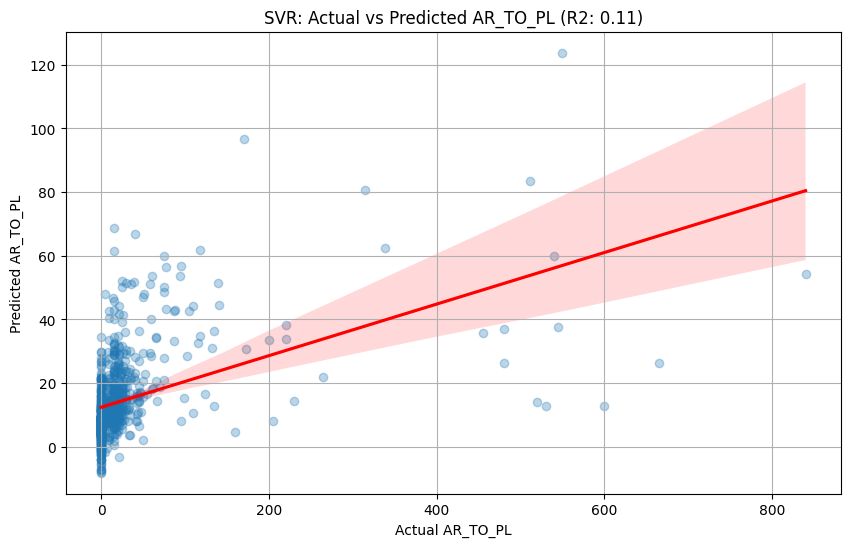

Training SVR for target: PL_TO_RL
Evaluation for PL_TO_RL (SVR):
 Mean Absolute Error (MAE): 83.25550839014478
 Mean Absolute Percentage Error (MAPE): 102.92326660744331
 Root Mean Squared Error (RMSE): 108.82489327532733
 R-squared (R2): 0.288470885721106


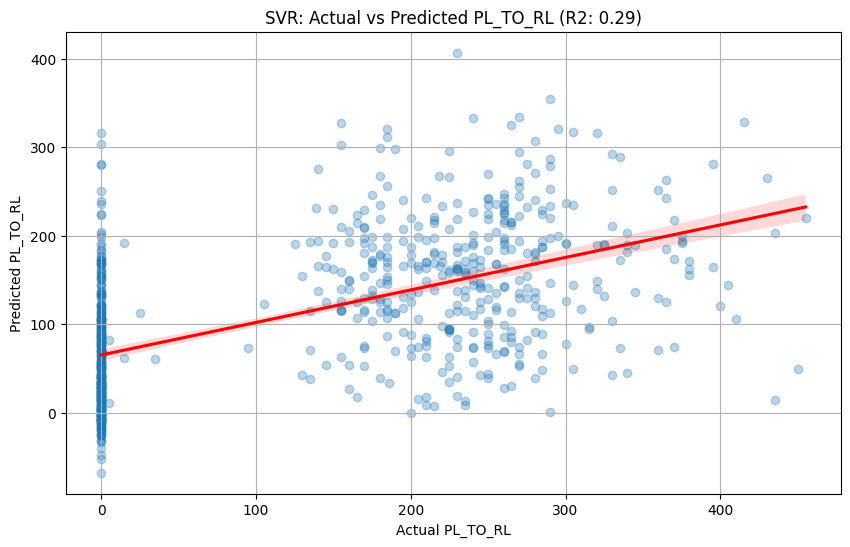

Training SVR for target: RL_TO_DP
Evaluation for RL_TO_DP (SVR):
 Mean Absolute Error (MAE): 234.70475708583788
 Mean Absolute Percentage Error (MAPE): 781.4190684602596
 Root Mean Squared Error (RMSE): 400.50822451979195
 R-squared (R2): 0.031570384789450956


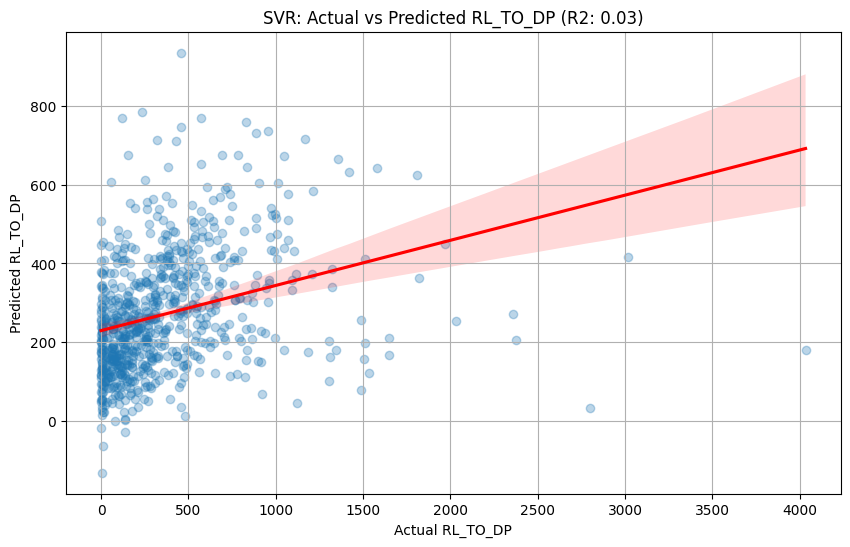

In [161]:
for target in target_cols:
    print(f"Training SVR for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

    svr_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'SVR_{target}'] = svr_model
    scalers[f'SVR_X_scaler_{target}'] = scaler_X
    scalers[f'SVR_y_scaler_{target}'] = scaler_y

    y_pred_scaled = svr_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    svr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (SVR):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'SVR: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [162]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR()}

In [163]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler()}

In [164]:
svr_metrics

{'AR_TO_PL': {'MAE': 22.762839083261685,
  'MAPE': np.float64(107.71114004713911),
  'RMSE': 73.79376131464272,
  'R2': 0.10934780856114235},
 'PL_TO_RL': {'MAE': 83.25550839014478,
  'MAPE': np.float64(102.92326660744331),
  'RMSE': 108.82489327532733,
  'R2': 0.288470885721106},
 'RL_TO_DP': {'MAE': 234.70475708583788,
  'MAPE': np.float64(781.4190684602596),
  'RMSE': 400.50822451979195,
  'R2': 0.031570384789450956}}

## KNN

In [165]:
from sklearn.neighbors import KNeighborsRegressor

In [166]:
knn_metrics = {}

Training KNN for target: AR_TO_PL
Evaluation for AR_TO_PL (KNN):
 Mean Absolute Error (MAE): 27.668187409982302
 Mean Absolute Percentage Error (MAPE): 151.28485377927282
 Root Mean Squared Error (RMSE): 76.33361806265827
 R-squared (R2): 0.04698323278187666


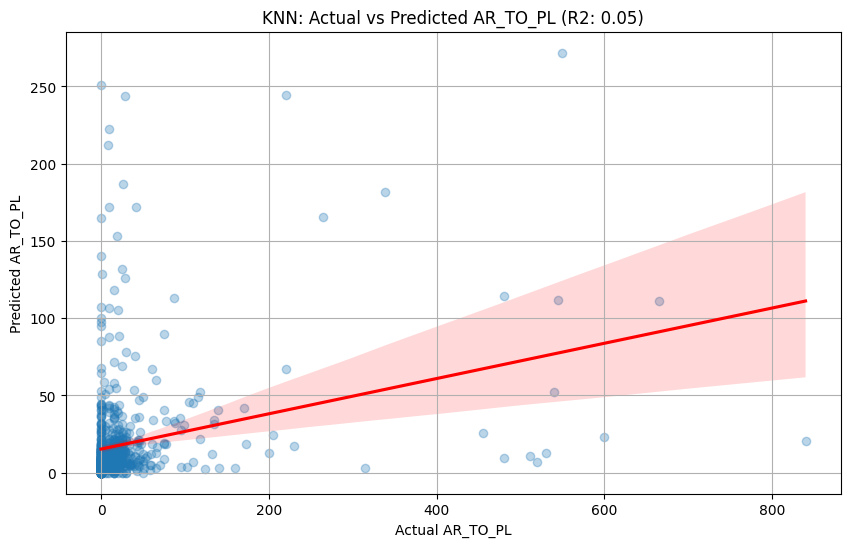

Training KNN for target: PL_TO_RL
Evaluation for PL_TO_RL (KNN):
 Mean Absolute Error (MAE): 97.80938080896922
 Mean Absolute Percentage Error (MAPE): 97.26725267429059
 Root Mean Squared Error (RMSE): 122.85599141426096
 R-squared (R2): 0.0931637816503239


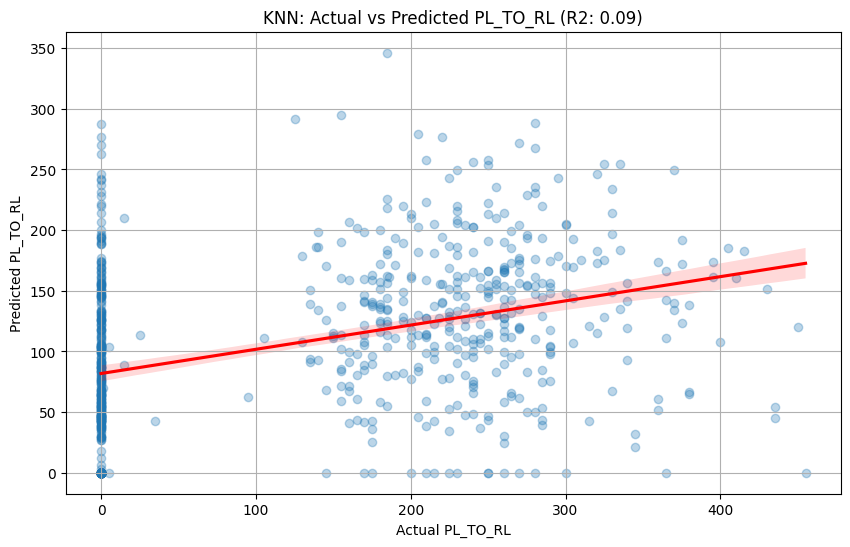

Training KNN for target: RL_TO_DP
Evaluation for RL_TO_DP (KNN):
 Mean Absolute Error (MAE): 271.6637746107384
 Mean Absolute Percentage Error (MAPE): 912.3403954650696
 Root Mean Squared Error (RMSE): 417.0787136783054
 R-squared (R2): -0.050222298854297076


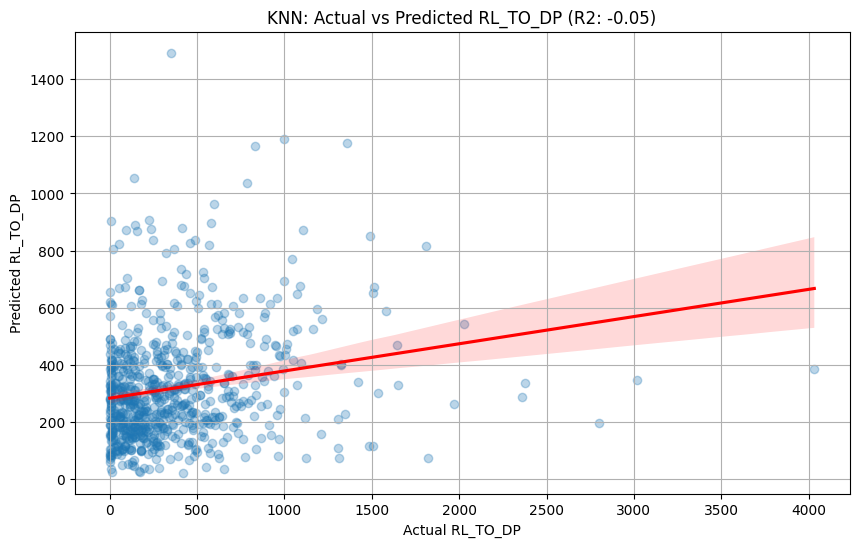

In [167]:
for target in target_cols:
    print(f"Training KNN for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    knn_model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean')

    knn_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'KNN_{target}'] = knn_model
    scalers[f'KNN_X_scaler_{target}'] = scaler_X
    scalers[f'KNN_y_scaler_{target}'] = scaler_y

    y_pred_scaled = knn_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    knn_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (KNN):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'KNN: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [168]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [169]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler(),
 'KNN_X_scaler_AR_TO_PL': StandardScaler(),
 'KNN_y_scaler_AR_TO_PL': StandardScaler(),
 'KNN_X_scaler_PL_TO_RL': StandardScaler(),
 'KNN_y_scaler_PL_TO_RL': StandardScaler(),
 'KNN_X_scaler_RL_TO_DP': StandardScaler(),
 'KNN_y_scaler_RL_TO_DP': StandardScaler()}

In [170]:
knn_metrics

{'AR_TO_PL': {'MAE': 27.668187409982302,
  'MAPE': np.float64(151.28485377927282),
  'RMSE': 76.33361806265827,
  'R2': 0.04698323278187666},
 'PL_TO_RL': {'MAE': 97.80938080896922,
  'MAPE': np.float64(97.26725267429059),
  'RMSE': 122.85599141426096,
  'R2': 0.0931637816503239},
 'RL_TO_DP': {'MAE': 271.6637746107384,
  'MAPE': np.float64(912.3403954650696),
  'RMSE': 417.0787136783054,
  'R2': -0.050222298854297076}}

## XGBoost Regressor

In [171]:
from xgboost import XGBRegressor

In [172]:
xgb_metrics = {}

Training XGBoost for target: AR_TO_PL
Evaluation for AR_TO_PL (XGBoost):
 Mean Absolute Error (MAE): 27.71361541748047
 Mean Absolute Percentage Error (MAPE): 134.8010147054406
 Root Mean Squared Error (RMSE): 73.49099731445312
 R-squared (R2): 0.11664128303527832


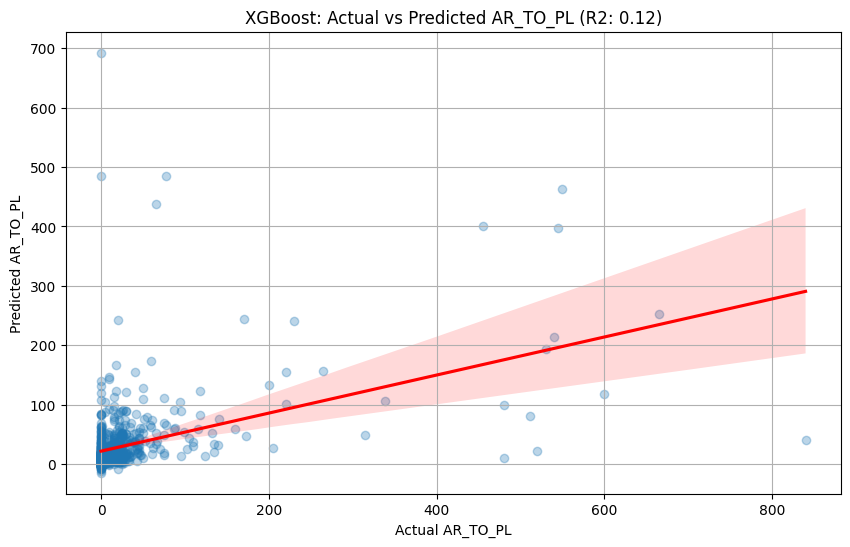

Training XGBoost for target: PL_TO_RL
Evaluation for PL_TO_RL (XGBoost):
 Mean Absolute Error (MAE): 72.4177017211914
 Mean Absolute Percentage Error (MAPE): 66.31102653845208
 Root Mean Squared Error (RMSE): 91.96839141845703
 R-squared (R2): 0.4918249249458313


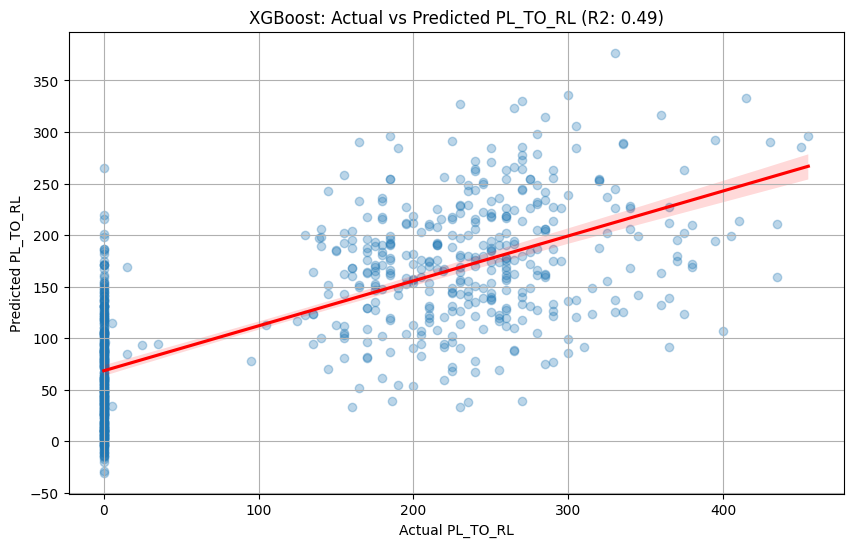

Training XGBoost for target: RL_TO_DP
Evaluation for RL_TO_DP (XGBoost):
 Mean Absolute Error (MAE): 241.30999755859375
 Mean Absolute Percentage Error (MAPE): 776.5459708650138
 Root Mean Squared Error (RMSE): 383.2414855957031
 R-squared (R2): 0.11327242851257324


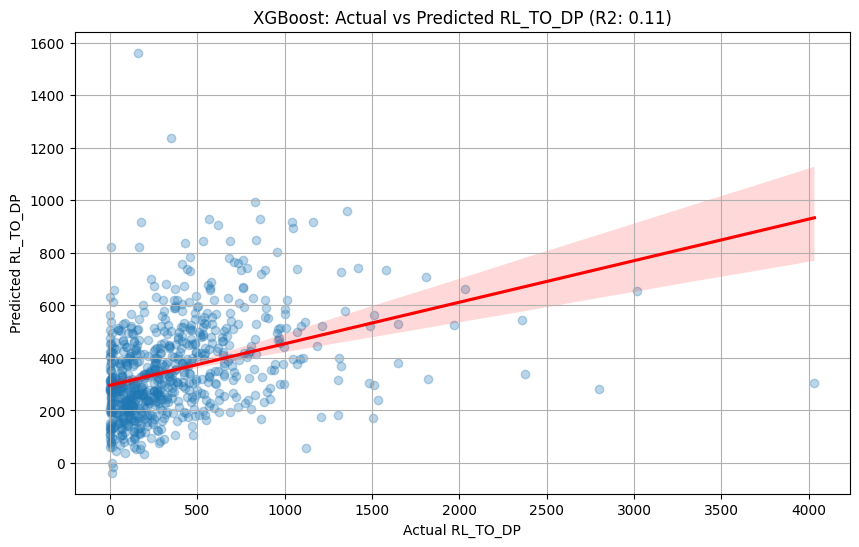

In [173]:
for target in target_cols:
    print(f"Training XGBoost for target: {target}")

    xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=250, max_depth=8, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=42, n_jobs=-1)

    xgb_model.fit(X_train, y_train[target])
    models[f'XGBoost_{target}'] = xgb_model

    y_pred = xgb_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    xgb_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (XGBoost):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'XGBoost: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [174]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [175]:
xgb_metrics

{'AR_TO_PL': {'MAE': 27.71361541748047,
  'MAPE': np.float64(134.8010147054406),
  'RMSE': 73.49099731445312,
  'R2': 0.11664128303527832},
 'PL_TO_RL': {'MAE': 72.4177017211914,
  'MAPE': np.float64(66.31102653845208),
  'RMSE': 91.96839141845703,
  'R2': 0.4918249249458313},
 'RL_TO_DP': {'MAE': 241.30999755859375,
  'MAPE': np.float64(776.5459708650138),
  'RMSE': 383.2414855957031,
  'R2': 0.11327242851257324}}

## LightGBM Regressor

In [176]:
from lightgbm import LGBMRegressor

In [177]:
lgbm_metrics = {}

Training LightGBM for target: AR_TO_PL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1023
[LightGBM] [Info] Number of data points in the train set: 2938, number of used features: 22
[LightGBM] [Info] Start training from score 26.337304
Evaluation for AR_TO_PL (LightGBM):
 Mean Absolute Error (MAE): 28.54901387733345
 Mean Absolute Percentage Error (MAPE): 162.9435071568212
 Root Mean Squared Error (RMSE): 64.31141429690325
 R-squared (R2): 0.3235355669603496


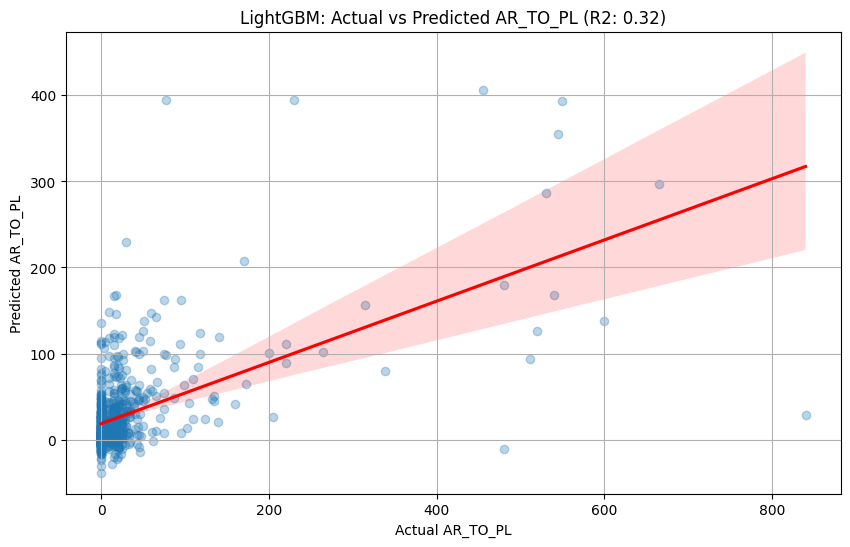

Training LightGBM for target: PL_TO_RL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1023
[LightGBM] [Info] Number of data points in the train set: 2938, number of used features: 22
[LightGBM] [Info] Start training from score 124.963581
Evaluation for PL_TO_RL (LightGBM):
 Mean Absolute Error (MAE): 72.90947341594504
 Mean Absolute Percentage Error (MAPE): 47.61112210642803
 Root Mean Squared Error (RMSE): 93.2548877848445
 R-squared (R2): 0.47750831546816164


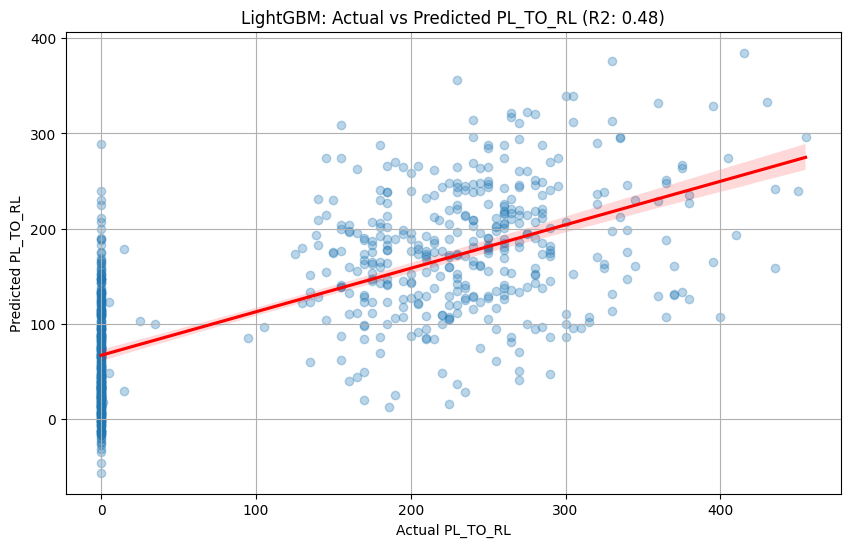

Training LightGBM for target: RL_TO_DP
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1023
[LightGBM] [Info] Number of data points in the train set: 2938, number of used features: 22
[LightGBM] [Info] Start training from score 346.159632
Evaluation for RL_TO_DP (LightGBM):
 Mean Absolute Error (MAE): 239.74061836134487
 Mean Absolute Percentage Error (MAPE): 784.6621989444606
 Root Mean Squared Error (RMSE): 380.586054388619
 R-squared (R2): 0.12551789732768848


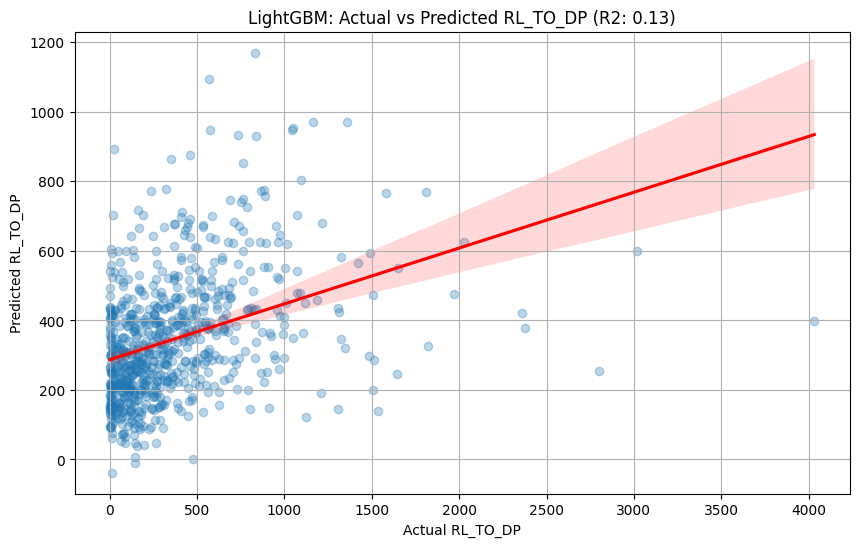

In [178]:
for target in target_cols:
    print(f"Training LightGBM for target: {target}")

    lgbm_model = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

    lgbm_model.fit(X_train, y_train[target])
    models[f'LightGBM_{target}'] = lgbm_model

    y_pred = lgbm_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    lgbm_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (LightGBM):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'LightGBM: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [179]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [180]:
lgbm_metrics

{'AR_TO_PL': {'MAE': 28.54901387733345,
  'MAPE': np.float64(162.9435071568212),
  'RMSE': 64.31141429690325,
  'R2': 0.3235355669603496},
 'PL_TO_RL': {'MAE': 72.90947341594504,
  'MAPE': np.float64(47.61112210642803),
  'RMSE': 93.2548877848445,
  'R2': 0.47750831546816164},
 'RL_TO_DP': {'MAE': 239.74061836134487,
  'MAPE': np.float64(784.6621989444606),
  'RMSE': 380.586054388619,
  'R2': 0.12551789732768848}}

## Overall Performance metrics

In [182]:
metrics = {}
metrics['rfr'] = rfr_metrics
metrics['svr'] = svr_metrics
metrics['knn'] = knn_metrics
metrics['xgb'] = xgb_metrics
metrics['lgbm'] = lgbm_metrics
metrics

{'rfr': {'AR_TO_PL': {'MAE': 28.41683830685517,
   'MAPE': np.float64(138.6612836852926),
   'RMSE': 69.1254835766175,
   'R2': 0.21847079568373695},
  'PL_TO_RL': {'MAE': 81.50125946291506,
   'MAPE': np.float64(72.28303732764165),
   'RMSE': 100.53416009469493,
   'R2': 0.39275564904902316},
  'RL_TO_DP': {'MAE': 242.62891794551936,
   'MAPE': np.float64(829.4005502319519),
   'RMSE': 382.4928008751722,
   'R2': 0.11673358925070798}},
 'svr': {'AR_TO_PL': {'MAE': 22.762839083261685,
   'MAPE': np.float64(107.71114004713911),
   'RMSE': 73.79376131464272,
   'R2': 0.10934780856114235},
  'PL_TO_RL': {'MAE': 83.25550839014478,
   'MAPE': np.float64(102.92326660744331),
   'RMSE': 108.82489327532733,
   'R2': 0.288470885721106},
  'RL_TO_DP': {'MAE': 234.70475708583788,
   'MAPE': np.float64(781.4190684602596),
   'RMSE': 400.50822451979195,
   'R2': 0.031570384789450956}},
 'knn': {'AR_TO_PL': {'MAE': 27.668187409982302,
   'MAPE': np.float64(151.28485377927282),
   'RMSE': 76.33361806

## Feature Importance

In [183]:
import shap

c:\Coding_files\ML_Bootcamp\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Key SHAP Plots and Their Interpretation:

SHAP Summary Plot (Beeswarm Plot):

Purpose: Provides a global overview of feature importance and the direction of their impact across many predictions.

Interpretation:
Features are ordered by overall importance (top is most important).
Points to the right (positive SHAP value) push the prediction higher.
Points to the left (negative SHAP value) push the prediction lower.
Color (red for high feature value, blue for low) shows if high/low values of a feature contribute to higher/lower predictions.


SHAP Force Plot (Individual Prediction Explanation):

Purpose: Explains one specific prediction in detail.

Interpretation:
Starts from the base_value (average prediction).
Red features push the prediction higher.
Blue features push the prediction lower.
The length of the bar indicates the magnitude of the impact.
The final predicted value is shown at the end.


SHAP Dependence Plot:

Purpose: Visualizes the relationship between a single feature's value and its impact (SHAP value) on the model's prediction. Can also show interaction effects.

Interpretation:
See if the relationship is linear, curved, or has thresholds.
Points are colored by another interacting feature (if specified, or SHAP finds the best one). This helps you understand if the effect of the primary feature changes depending on the value of the interacting feature.

In [184]:
target_to_explain = ['LightGBM_AR_TO_PL','XGBoost_PL_TO_RL','LightGBM_RL_TO_DP']


Explaining predictions for LightGBM_AR_TO_PL for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_AR_TO_PL:


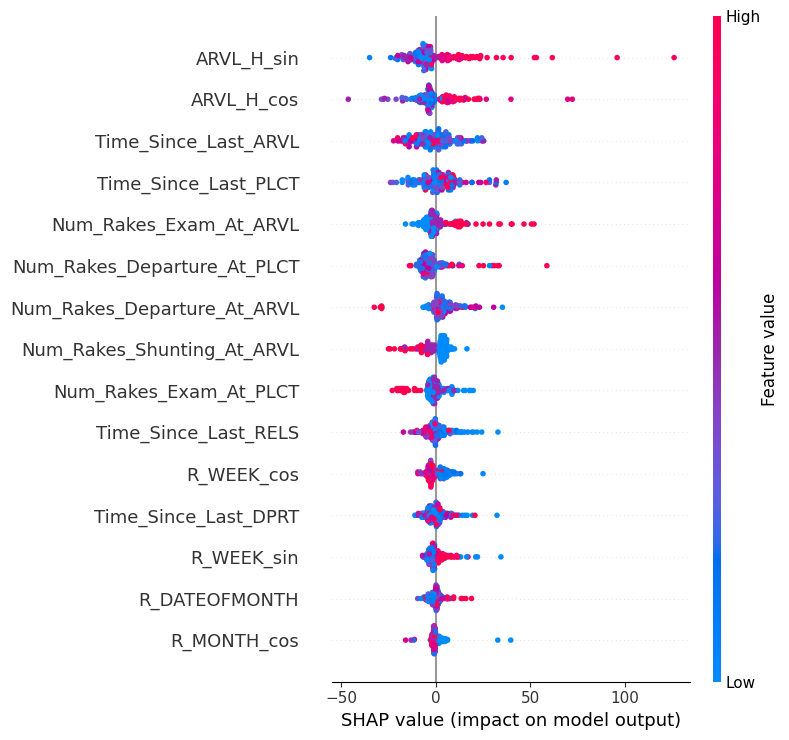

Displaying SHAP Force Plot for instance 0 for LightGBM_AR_TO_PL:


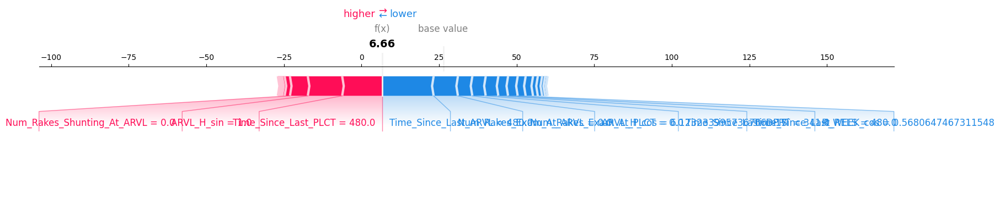


Actual prediction for instance 0: 6.66
Base (Expected) value for LightGBM_AR_TO_PL: 26.34
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'ARVL_H_sin' vs LightGBM_AR_TO_PL:


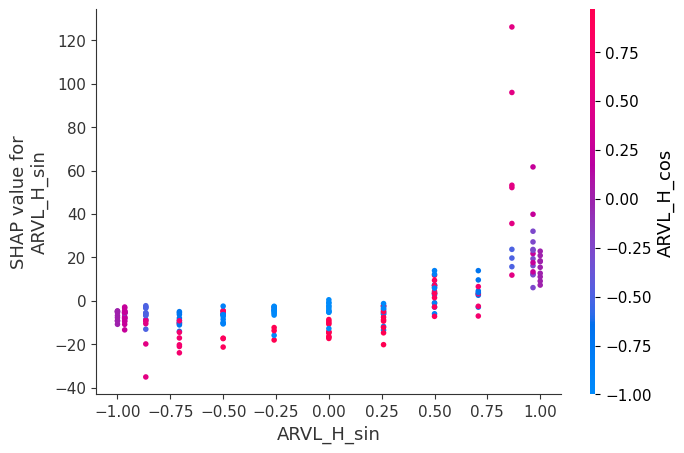

In [185]:
model_to_explain = models[target_to_explain[0]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[0]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[0]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[0]} (without TOTAL_TIME)')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[0]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[0]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[0]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'PLCT_H_sin' (placement hour) affects 'PL_TO_RL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'ARVL_H_sin' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[0]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[0]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for XGBoost_PL_TO_RL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_PL_TO_RL:


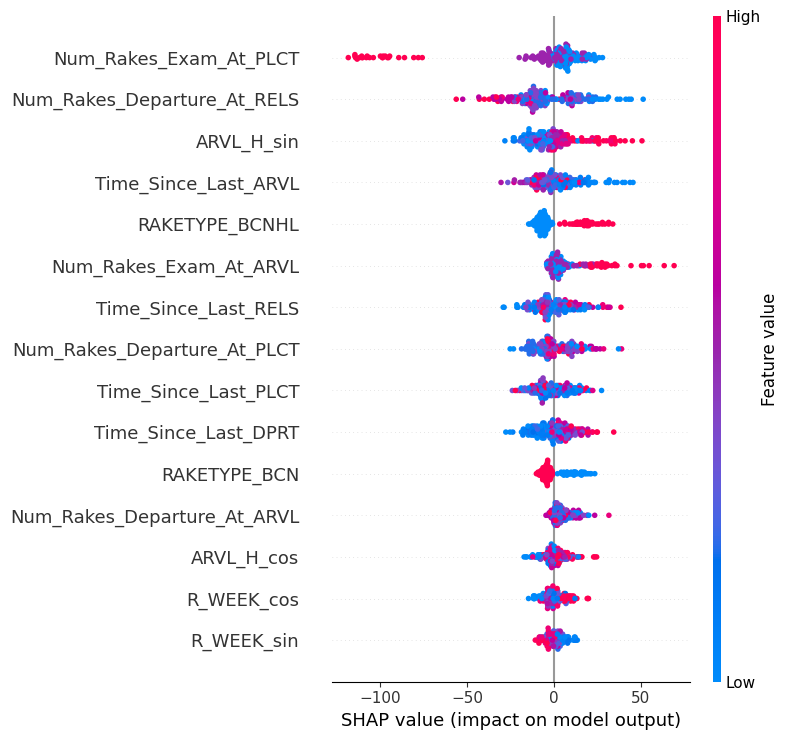

Displaying SHAP Force Plot for instance 0 for XGBoost_PL_TO_RL:


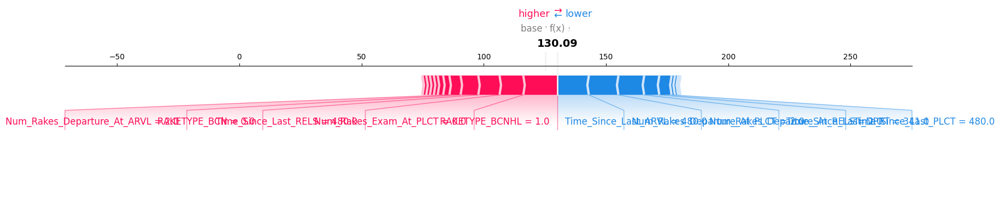


Actual prediction for instance 0: 130.09
Base (Expected) value for XGBoost_PL_TO_RL: 125.18
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs XGBoost_PL_TO_RL:


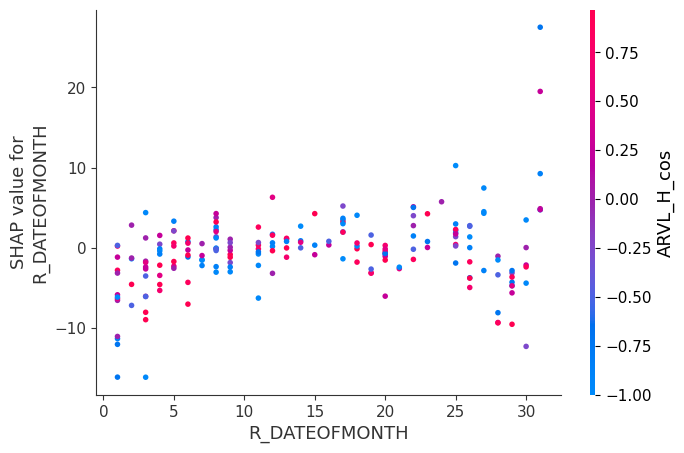

In [186]:
model_to_explain = models[target_to_explain[1]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[1]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[1]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[1]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[1]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[1]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[1]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[1]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[1]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for LightGBM_RL_TO_DP for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_RL_TO_DP:


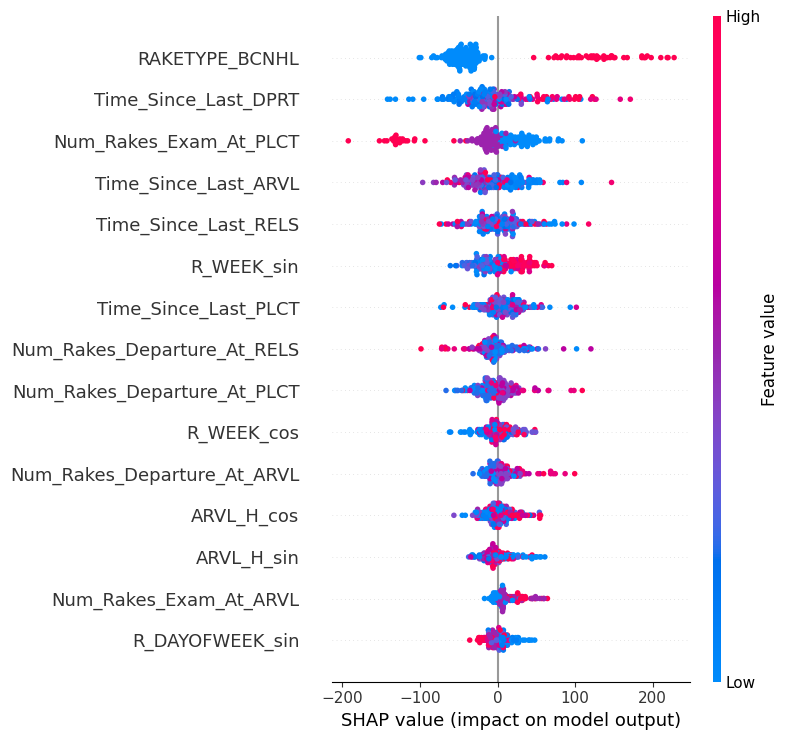

Displaying SHAP Force Plot for instance 0 for LightGBM_RL_TO_DP:


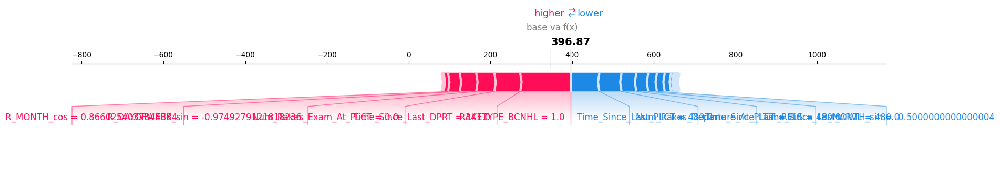


Actual prediction for instance 0: 396.87
Base (Expected) value for LightGBM_RL_TO_DP: 346.16
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs LightGBM_RL_TO_DP:


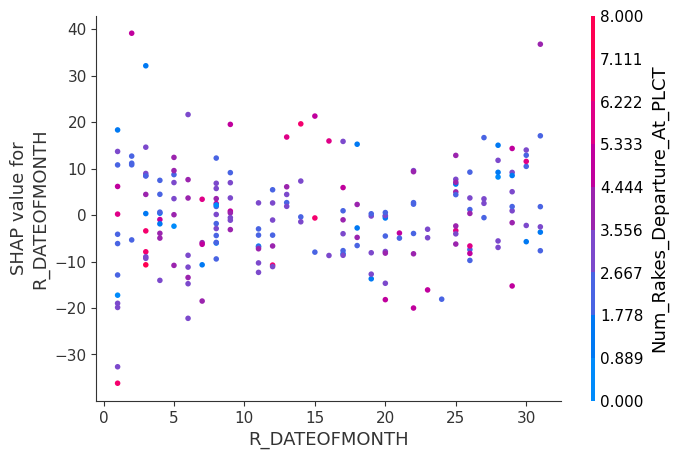

In [187]:
model_to_explain = models[target_to_explain[2]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[2]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[2]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[2]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[2]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[2]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[2]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[2]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[2]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")